In [175]:
import pandas as pd
import numpy as np
from IPython.display import Math #para escrever equações 
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [176]:
from sklearn.model_selection import train_test_split
from sklearn.svm import LinearSVC
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score, r2_score, mean_absolute_error, mean_squared_error
import statsmodels.api as sm
import seaborn as sns

import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt

In [90]:
from random import randint
from xmlrpc.client import Boolean
from tqdm import tqdm
import pandas as pd
import numpy as np
import quantecon as qe

import logging
log = logging.getLogger(__name__)
# logging.basicConfig(level=logging.DEBUG) 


In [91]:
RANDOM_SIZE   = 1000000
RANDOM_SIZE   = 200
QTD_BINS      = 3
TEST_SIZE     = 0.05
RANDOM_STATE  = 2022
PREDITOR      = ['vegetable-oil_price', 'vegetable-oil_production', 'vegetable-oil_exports']
PREDITOR_DIRECTIONS      = ['vegetable-oil_price', 'vegetable-oil_production', 'vegetable-oil_exports']

- https://raw.githubusercontent.com/fkfouri/vegetable_oil_mkt/master/dataset/__by_month_commodity_types.csv
- https://raw.githubusercontent.com/fkfouri/vegetable_oil_mkt/master/dataset/__by_month_vegetable_oil.csv
- https://raw.githubusercontent.com/fkfouri/vegetable_oil_mkt/master/dataset/__by_month_full.csv

# Mercado de Oleo

## Dataset Completo
USDA por comodity
USDA Agrupado por Oleo Vegetal
OECD Agrupado
FAO Index Price


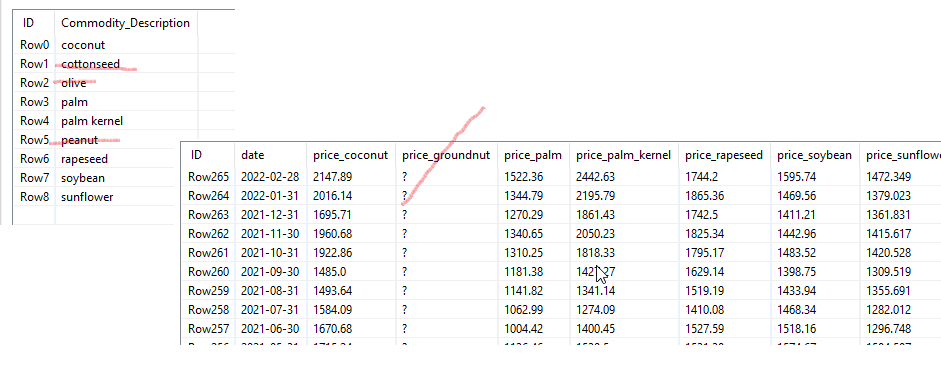

In [92]:

def get_dataset():
    df = pd.read_csv('https://raw.githubusercontent.com/fkfouri/vegetable_oil_mkt/master/dataset/__by_month_full.csv')
    print(df.shape)
    df['date'] = pd.to_datetime(df['date'])
    df.sort_values(by=['date'], ascending=[True], inplace=True)
    df.set_index(['date'], inplace=True)
    return df

%time df_full = get_dataset()
df_full.head()

(266, 139)
CPU times: total: 46.9 ms
Wall time: 163 ms
(266, 139)
CPU times: total: 46.9 ms
Wall time: 163 ms


,reference,coconut_beginning-stocks,coconut_crush,coconut_domestic-consumption,coconut_ending-stocks,coconut_exports,coconut_feed-waste-dom-cons,coconut_food-use-dom-cons,coconut_imports,coconut_industrial-dom-cons,...,vegetable-oil_total-supply,vegetable-oil_oecd_consumption,vegetable-oil_oecd_ending-stocks,vegetable-oil_oecd_exports,vegetable-oil_oecd_food,vegetable-oil_oecd_food-fat-availability,vegetable-oil_oecd_human-consumption-per-capita,vegetable-oil_oecd_imports,vegetable-oil_oecd_other-use,vegetable-oil_oecd_production
date,,,,,,,,,,,,,,,,,,,,,
2000-01-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,7273.770,844.920,2541.320,6179.990,2.240,1.020,2490.870,1088.770,7469.760
2000-02-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,7298.970,849.930,2562.660,6190.320,2.240,1.020,2504.980,1098.620,7494.420
2000-03-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,7324.160,854.950,2584.010,6200.660,2.240,1.020,2519.100,1108.460,7519.090
2000-04-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,7349.360,859.960,2605.360,6211.000,2.240,1.030,2533.210,1118.310,7543.750
2000-05-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,7374.550,864.970,2626.710,6221.340,2.250,1.030,2547.320,1128.150,7568.420


,reference,coconut_beginning-stocks,coconut_crush,coconut_domestic-consumption,coconut_ending-stocks,coconut_exports,coconut_feed-waste-dom-cons,coconut_food-use-dom-cons,coconut_imports,coconut_industrial-dom-cons,...,vegetable-oil_total-supply,vegetable-oil_oecd_consumption,vegetable-oil_oecd_ending-stocks,vegetable-oil_oecd_exports,vegetable-oil_oecd_food,vegetable-oil_oecd_food-fat-availability,vegetable-oil_oecd_human-consumption-per-capita,vegetable-oil_oecd_imports,vegetable-oil_oecd_other-use,vegetable-oil_oecd_production
date,,,,,,,,,,,,,,,,,,,,,
2000-01-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,7273.770,844.920,2541.320,6179.990,2.240,1.020,2490.870,1088.770,7469.760
2000-02-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,7298.970,849.930,2562.660,6190.320,2.240,1.020,2504.980,1098.620,7494.420
2000-03-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,7324.160,854.950,2584.010,6200.660,2.240,1.020,2519.100,1108.460,7519.090
2000-04-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,7349.360,859.960,2605.360,6211.000,2.240,1.030,2533.210,1118.310,7543.750
2000-05-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,7374.550,864.970,2626.710,6221.340,2.250,1.030,2547.320,1128.150,7568.420


In [93]:
df_full.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 266 entries, 2000-01-31 to 2022-02-28
Columns: 138 entries, reference to vegetable-oil_oecd_production
dtypes: float64(137), object(1)
memory usage: 288.9+ KB
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 266 entries, 2000-01-31 to 2022-02-28
Columns: 138 entries, reference to vegetable-oil_oecd_production
dtypes: float64(137), object(1)
memory usage: 288.9+ KB


In [94]:
df_full.dtypes

reference                                           object
coconut_beginning-stocks                           float64
coconut_crush                                      float64
coconut_domestic-consumption                       float64
coconut_ending-stocks                              float64
                                                    ...   
vegetable-oil_oecd_food-fat-availability           float64
vegetable-oil_oecd_human-consumption-per-capita    float64
vegetable-oil_oecd_imports                         float64
vegetable-oil_oecd_other-use                       float64
vegetable-oil_oecd_production                      float64
Length: 138, dtype: object

reference                                           object
coconut_beginning-stocks                           float64
coconut_crush                                      float64
coconut_domestic-consumption                       float64
coconut_ending-stocks                              float64
                                                    ...   
vegetable-oil_oecd_food-fat-availability           float64
vegetable-oil_oecd_human-consumption-per-capita    float64
vegetable-oil_oecd_imports                         float64
vegetable-oil_oecd_other-use                       float64
vegetable-oil_oecd_production                      float64
Length: 138, dtype: object

In [95]:
features = [x for x in df_full.columns if ('exports' in x or 'production' in x or 'price' in x) and not ('olive' in x or 'cottonseed' in x) ]
prices = [x for x in df_full.columns if 'price' in x and 'groundnut' not in x  ]
print(len(features), features)
print(len(prices), prices)

26 ['coconut_exports', 'coconut_price', 'coconut_production', 'palm-kernel_exports', 'palm-kernel_price', 'palm-kernel_production', 'palm_exports', 'palm_price', 'palm_production', 'peanut_exports', 'peanut_price', 'peanut_production', 'rapeseed_exports', 'rapeseed_price', 'rapeseed_production', 'soybean_exports', 'soybean_price', 'soybean_production', 'sunflower_exports', 'sunflower_price', 'sunflower_production', 'vegetable-oil_exports', 'vegetable-oil_price', 'vegetable-oil_production', 'vegetable-oil_oecd_exports', 'vegetable-oil_oecd_production']
8 ['coconut_price', 'palm-kernel_price', 'palm_price', 'peanut_price', 'rapeseed_price', 'soybean_price', 'sunflower_price', 'vegetable-oil_price']
26 ['coconut_exports', 'coconut_price', 'coconut_production', 'palm-kernel_exports', 'palm-kernel_price', 'palm-kernel_production', 'palm_exports', 'palm_price', 'palm_production', 'peanut_exports', 'peanut_price', 'peanut_production', 'rapeseed_exports', 'rapeseed_price', 'rapeseed_production

In [96]:
df = df_full[ features]
print(df.shape)
df = df[df['sunflower_production'].notnull()]
df = df[df['sunflower_price'].notnull()]
print(df.shape)
df

(266, 26)
(234, 26)


,coconut_exports,coconut_price,coconut_production,palm-kernel_exports,palm-kernel_price,palm-kernel_production,palm_exports,palm_price,palm_production,peanut_exports,...,soybean_price,soybean_production,sunflower_exports,sunflower_price,sunflower_production,vegetable-oil_exports,vegetable-oil_price,vegetable-oil_production,vegetable-oil_oecd_exports,vegetable-oil_oecd_production
date,,,,,,,,,,,,,,,,,,,,,
2002-02-28,148.440,376.000,255.940,130.470,356.000,264.710,1527.920,352.980,2146.310,17.030,...,364.920,3204.320,166.180,578.000,620.920,3312.180,47.786,8559.630,2986.310,7954.130
2002-03-31,148.040,366.000,255.830,130.830,353.240,266.520,1543.880,359.000,2162.830,16.580,...,359.210,3222.400,168.850,557.000,625.580,3339.800,47.622,8591.720,3014.280,7983.170
2002-04-30,147.640,411.000,255.720,131.190,405.000,268.330,1559.830,360.070,2179.360,16.140,...,370.860,3240.470,171.530,552.000,630.250,3367.440,48.969,8623.810,3042.260,8012.210
2002-05-31,147.240,420.000,255.610,131.560,418.300,270.150,1575.790,384.910,2195.890,15.690,...,399.890,3258.550,174.200,574.000,634.920,3395.080,51.641,8655.950,3070.240,8041.250
2002-06-30,146.830,446.000,255.500,131.920,439.000,271.960,1591.750,426.130,2212.420,15.250,...,456.810,3276.620,176.880,595.000,639.580,3422.710,55.804,8688.040,3098.220,8070.290
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-08-31,157.080,1493.640,290.610,276.780,1341.140,716.470,4092.220,1141.820,6229.440,35.640,...,1433.940,6354.170,988.220,1355.691,1703.690,7821.270,165.862,18894.320,7325.470,18174.560
2021-09-30,158.080,1485.000,291.080,278.380,1427.270,718.600,4103.190,1181.380,6246.960,35.020,...,1398.750,6350.750,994.670,1309.519,1717.600,7837.790,168.571,18923.870,7328.510,18207.820
2021-10-31,159.080,1922.860,291.560,279.970,1818.330,720.740,4114.150,1310.250,6264.470,34.400,...,1483.520,6347.330,1001.110,1420.528,1731.510,7854.300,184.837,18953.420,7331.560,18241.070


(266, 26)
(234, 26)


,coconut_exports,coconut_price,coconut_production,palm-kernel_exports,palm-kernel_price,palm-kernel_production,palm_exports,palm_price,palm_production,peanut_exports,...,soybean_price,soybean_production,sunflower_exports,sunflower_price,sunflower_production,vegetable-oil_exports,vegetable-oil_price,vegetable-oil_production,vegetable-oil_oecd_exports,vegetable-oil_oecd_production
date,,,,,,,,,,,,,,,,,,,,,
2002-02-28,148.440,376.000,255.940,130.470,356.000,264.710,1527.920,352.980,2146.310,17.030,...,364.920,3204.320,166.180,578.000,620.920,3312.180,47.786,8559.630,2986.310,7954.130
2002-03-31,148.040,366.000,255.830,130.830,353.240,266.520,1543.880,359.000,2162.830,16.580,...,359.210,3222.400,168.850,557.000,625.580,3339.800,47.622,8591.720,3014.280,7983.170
2002-04-30,147.640,411.000,255.720,131.190,405.000,268.330,1559.830,360.070,2179.360,16.140,...,370.860,3240.470,171.530,552.000,630.250,3367.440,48.969,8623.810,3042.260,8012.210
2002-05-31,147.240,420.000,255.610,131.560,418.300,270.150,1575.790,384.910,2195.890,15.690,...,399.890,3258.550,174.200,574.000,634.920,3395.080,51.641,8655.950,3070.240,8041.250
2002-06-30,146.830,446.000,255.500,131.920,439.000,271.960,1591.750,426.130,2212.420,15.250,...,456.810,3276.620,176.880,595.000,639.580,3422.710,55.804,8688.040,3098.220,8070.290
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-08-31,157.080,1493.640,290.610,276.780,1341.140,716.470,4092.220,1141.820,6229.440,35.640,...,1433.940,6354.170,988.220,1355.691,1703.690,7821.270,165.862,18894.320,7325.470,18174.560
2021-09-30,158.080,1485.000,291.080,278.380,1427.270,718.600,4103.190,1181.380,6246.960,35.020,...,1398.750,6350.750,994.670,1309.519,1717.600,7837.790,168.571,18923.870,7328.510,18207.820
2021-10-31,159.080,1922.860,291.560,279.970,1818.330,720.740,4114.150,1310.250,6264.470,34.400,...,1483.520,6347.330,1001.110,1420.528,1731.510,7854.300,184.837,18953.420,7331.560,18241.070


In [97]:
df.describe()

,coconut_exports,coconut_price,coconut_production,palm-kernel_exports,palm-kernel_price,palm-kernel_production,palm_exports,palm_price,palm_production,peanut_exports,...,soybean_price,soybean_production,sunflower_exports,sunflower_price,sunflower_production,vegetable-oil_exports,vegetable-oil_price,vegetable-oil_production,vegetable-oil_oecd_exports,vegetable-oil_oecd_production
count,234.000,234.000,234.000,234.000,234.000,234.000,234.000,234.000,234.000,234.000,...,234.000,234.000,234.000,234.000,234.000,234.000,234.000,234.000,234.000,234.000
mean,154.793,1037.208,277.760,233.840,956.092,523.365,3226.635,763.075,4406.418,19.901,...,882.535,4857.446,563.021,966.043,1174.819,5990.575,103.046,14277.728,5545.769,13471.372
std,10.334,412.612,12.313,41.691,378.930,139.269,805.918,244.906,1262.844,6.470,...,272.357,980.073,284.888,334.951,331.668,1329.965,32.741,3166.837,1307.176,3118.232
min,123.000,366.000,248.500,130.470,353.240,264.710,1527.920,352.980,2146.310,12.830,...,359.210,3204.320,166.180,543.000,620.920,3312.180,47.622,8559.630,2986.310,7954.130
25%,148.055,702.250,270.998,219.213,655.290,399.255,2515.020,577.495,3275.315,15.468,...,719.372,4057.825,329.412,719.643,886.732,5027.562,78.436,11538.903,4463.065,10815.903
50%,154.895,953.500,275.410,245.990,878.330,530.115,3399.860,732.000,4468.605,16.805,...,832.990,4667.785,493.780,856.470,1127.385,5927.510,97.910,14325.960,5663.720,13418.630
75%,160.400,1387.287,287.767,263.450,1232.705,642.967,4014.682,886.188,5503.118,23.133,...,1016.713,5831.602,867.900,1174.505,1528.378,7278.573,121.403,17158.577,6772.868,16394.708
max,177.920,2256.000,302.500,283.170,2307.630,725.000,4325.500,1377.220,6299.500,40.580,...,1574.670,6381.500,1122.670,2045.000,1761.580,7887.340,184.837,19012.500,7349.260,18307.580


,coconut_exports,coconut_price,coconut_production,palm-kernel_exports,palm-kernel_price,palm-kernel_production,palm_exports,palm_price,palm_production,peanut_exports,...,soybean_price,soybean_production,sunflower_exports,sunflower_price,sunflower_production,vegetable-oil_exports,vegetable-oil_price,vegetable-oil_production,vegetable-oil_oecd_exports,vegetable-oil_oecd_production
count,234.000,234.000,234.000,234.000,234.000,234.000,234.000,234.000,234.000,234.000,...,234.000,234.000,234.000,234.000,234.000,234.000,234.000,234.000,234.000,234.000
mean,154.793,1037.208,277.760,233.840,956.092,523.365,3226.635,763.075,4406.418,19.901,...,882.535,4857.446,563.021,966.043,1174.819,5990.575,103.046,14277.728,5545.769,13471.372
std,10.334,412.612,12.313,41.691,378.930,139.269,805.918,244.906,1262.844,6.470,...,272.357,980.073,284.888,334.951,331.668,1329.965,32.741,3166.837,1307.176,3118.232
min,123.000,366.000,248.500,130.470,353.240,264.710,1527.920,352.980,2146.310,12.830,...,359.210,3204.320,166.180,543.000,620.920,3312.180,47.622,8559.630,2986.310,7954.130
25%,148.055,702.250,270.998,219.213,655.290,399.255,2515.020,577.495,3275.315,15.468,...,719.372,4057.825,329.412,719.643,886.732,5027.562,78.436,11538.903,4463.065,10815.903
50%,154.895,953.500,275.410,245.990,878.330,530.115,3399.860,732.000,4468.605,16.805,...,832.990,4667.785,493.780,856.470,1127.385,5927.510,97.910,14325.960,5663.720,13418.630
75%,160.400,1387.287,287.767,263.450,1232.705,642.967,4014.682,886.188,5503.118,23.133,...,1016.713,5831.602,867.900,1174.505,1528.378,7278.573,121.403,17158.577,6772.868,16394.708
max,177.920,2256.000,302.500,283.170,2307.630,725.000,4325.500,1377.220,6299.500,40.580,...,1574.670,6381.500,1122.670,2045.000,1761.580,7887.340,184.837,19012.500,7349.260,18307.580


## Correlação

Paired density and scatterplot matrix

https://seaborn.pydata.org/examples/pair_grid_with_kde.html

In [98]:
if False:
    %time
    sns.set_theme(style="white")

    g = sns.PairGrid(df, diag_sharey=False)
    g.map_upper(sns.scatterplot, s=15)
    g.map_lower(sns.kdeplot)
    g.map_diag(sns.kdeplot, lw=2)

![Alt text](https://raw.githubusercontent.com/fkfouri/vegetable_oil_mkt/master/images/Compare.png)

## Dendograma

In [99]:
if False:
    plt.figure(figsize=(25,10))
    dendrogram = sch.dendrogram(sch.linkage(df, method  = "ward"))

    plt.title('Dendrogram')

    # plt.xlabel('Customers')
    plt.ylabel('Euclidean distances')
    %time plt.show()

# Markov
Observaçoes:
- Sera que o outcome deveria ser calculado em funcao do dado? Não deveria ser uma referencia Exogena? Exemplos (Open Interest da soja eu tenho). No exemplo do VIRAL... ele pega o outcome como o volume de negocios.

In [100]:
!pip install --upgrade quantecon numba tqdm --quiet

In [101]:
df.tail()

,coconut_exports,coconut_price,coconut_production,palm-kernel_exports,palm-kernel_price,palm-kernel_production,palm_exports,palm_price,palm_production,peanut_exports,...,soybean_price,soybean_production,sunflower_exports,sunflower_price,sunflower_production,vegetable-oil_exports,vegetable-oil_price,vegetable-oil_production,vegetable-oil_oecd_exports,vegetable-oil_oecd_production
date,,,,,,,,,,,,,,,,,,,,,
2021-08-31,157.080,1493.640,290.610,276.780,1341.140,716.470,4092.220,1141.820,6229.440,35.640,...,1433.940,6354.170,988.220,1355.691,1703.690,7821.270,165.862,18894.320,7325.470,18174.560
2021-09-30,158.080,1485.000,291.080,278.380,1427.270,718.600,4103.190,1181.380,6246.960,35.020,...,1398.750,6350.750,994.670,1309.519,1717.600,7837.790,168.571,18923.870,7328.510,18207.820
2021-10-31,159.080,1922.860,291.560,279.970,1818.330,720.740,4114.150,1310.250,6264.470,34.400,...,1483.520,6347.330,1001.110,1420.528,1731.510,7854.300,184.837,18953.420,7331.560,18241.070
2021-11-30,160.080,1960.680,292.030,281.570,2050.230,722.870,4125.120,1340.650,6281.990,33.780,...,1442.960,6343.920,1007.560,1415.617,1745.420,7870.820,184.555,18982.970,7334.600,18274.330
2021-12-31,161.080,1695.710,292.500,283.170,1861.430,725.000,4136.080,1270.290,6299.500,33.170,...,1411.210,6340.500,1014.000,1361.831,1759.330,7887.340,178.505,19012.500,7337.650,18307.580


,coconut_exports,coconut_price,coconut_production,palm-kernel_exports,palm-kernel_price,palm-kernel_production,palm_exports,palm_price,palm_production,peanut_exports,...,soybean_price,soybean_production,sunflower_exports,sunflower_price,sunflower_production,vegetable-oil_exports,vegetable-oil_price,vegetable-oil_production,vegetable-oil_oecd_exports,vegetable-oil_oecd_production
date,,,,,,,,,,,,,,,,,,,,,
2021-08-31,157.080,1493.640,290.610,276.780,1341.140,716.470,4092.220,1141.820,6229.440,35.640,...,1433.940,6354.170,988.220,1355.691,1703.690,7821.270,165.862,18894.320,7325.470,18174.560
2021-09-30,158.080,1485.000,291.080,278.380,1427.270,718.600,4103.190,1181.380,6246.960,35.020,...,1398.750,6350.750,994.670,1309.519,1717.600,7837.790,168.571,18923.870,7328.510,18207.820
2021-10-31,159.080,1922.860,291.560,279.970,1818.330,720.740,4114.150,1310.250,6264.470,34.400,...,1483.520,6347.330,1001.110,1420.528,1731.510,7854.300,184.837,18953.420,7331.560,18241.070
2021-11-30,160.080,1960.680,292.030,281.570,2050.230,722.870,4125.120,1340.650,6281.990,33.780,...,1442.960,6343.920,1007.560,1415.617,1745.420,7870.820,184.555,18982.970,7334.600,18274.330
2021-12-31,161.080,1695.710,292.500,283.170,1861.430,725.000,4136.080,1270.290,6299.500,33.170,...,1411.210,6340.500,1014.000,1361.831,1759.330,7887.340,178.505,19012.500,7337.650,18307.580


## Geração do Random Sets

In [102]:
def prepare_dataset(df: pd.DataFrame):
    df = df.copy()
    for col in df.columns:
        df[f'{col}_delta']    = df[col].diff()
        df[f'{col}_outcome']  = df[col].diff(-1) * -1
        df[f'{col}_mom']      = df[col].pct_change()

    columns = sorted(list(df.columns))
    return df[columns].reset_index()


df_m = prepare_dataset(df)
df_m.tail(10).T

,224,225,226,227,228,229,230,231,232,233
date,2021-03-31 00:00:00,2021-04-30 00:00:00,2021-05-31 00:00:00,2021-06-30 00:00:00,2021-07-31 00:00:00,2021-08-31 00:00:00,2021-09-30 00:00:00,2021-10-31 00:00:00,2021-11-30 00:00:00,2021-12-31 00:00:00
coconut_exports,152.080,153.080,154.080,155.080,156.080,157.080,158.080,159.080,160.080,161.080
coconut_exports_delta,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000
coconut_exports_mom,0.007,0.007,0.007,0.006,0.006,0.006,0.006,0.006,0.006,0.006
coconut_exports_outcome,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,NaN
...,...,...,...,...,...,...,...,...,...,...
vegetable-oil_price_outcome,2.889,12.685,-17.195,-2.185,10.366,2.709,16.266,-0.282,-6.050,NaN
vegetable-oil_production,18746.630,18776.160,18805.710,18835.260,18864.780,18894.320,18923.870,18953.420,18982.970,19012.500
vegetable-oil_production_delta,29.550,29.530,29.550,29.550,29.520,29.540,29.550,29.550,29.550,29.530
vegetable-oil_production_mom,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002


,224,225,226,227,228,229,230,231,232,233
date,2021-03-31 00:00:00,2021-04-30 00:00:00,2021-05-31 00:00:00,2021-06-30 00:00:00,2021-07-31 00:00:00,2021-08-31 00:00:00,2021-09-30 00:00:00,2021-10-31 00:00:00,2021-11-30 00:00:00,2021-12-31 00:00:00
coconut_exports,152.080,153.080,154.080,155.080,156.080,157.080,158.080,159.080,160.080,161.080
coconut_exports_delta,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000
coconut_exports_mom,0.007,0.007,0.007,0.006,0.006,0.006,0.006,0.006,0.006,0.006
coconut_exports_outcome,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,NaN
...,...,...,...,...,...,...,...,...,...,...
vegetable-oil_price_outcome,2.889,12.685,-17.195,-2.185,10.366,2.709,16.266,-0.282,-6.050,NaN
vegetable-oil_production,18746.630,18776.160,18805.710,18835.260,18864.780,18894.320,18923.870,18953.420,18982.970,19012.500
vegetable-oil_production_delta,29.550,29.530,29.550,29.550,29.520,29.540,29.550,29.550,29.550,29.530
vegetable-oil_production_mom,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002


In [103]:
df_m.tail()

,date,coconut_exports,coconut_exports_delta,coconut_exports_mom,coconut_exports_outcome,coconut_price,coconut_price_delta,coconut_price_mom,coconut_price_outcome,coconut_production,...,vegetable-oil_oecd_production_mom,vegetable-oil_oecd_production_outcome,vegetable-oil_price,vegetable-oil_price_delta,vegetable-oil_price_mom,vegetable-oil_price_outcome,vegetable-oil_production,vegetable-oil_production_delta,vegetable-oil_production_mom,vegetable-oil_production_outcome
229,2021-08-31,157.080,1.000,0.006,1.000,1493.640,-90.450,-0.057,-8.640,290.610,...,0.002,33.260,165.862,10.366,0.067,2.709,18894.320,29.540,0.002,29.550
230,2021-09-30,158.080,1.000,0.006,1.000,1485.000,-8.640,-0.006,437.860,291.080,...,0.002,33.250,168.571,2.709,0.016,16.266,18923.870,29.550,0.002,29.550
231,2021-10-31,159.080,1.000,0.006,1.000,1922.860,437.860,0.295,37.820,291.560,...,0.002,33.260,184.837,16.266,0.096,-0.282,18953.420,29.550,0.002,29.550
232,2021-11-30,160.080,1.000,0.006,1.000,1960.680,37.820,0.020,-264.970,292.030,...,0.002,33.250,184.555,-0.282,-0.002,-6.050,18982.970,29.550,0.002,29.530
233,2021-12-31,161.080,1.000,0.006,NaN,1695.710,-264.970,-0.135,NaN,292.500,...,0.002,NaN,178.505,-6.050,-0.033,NaN,19012.500,29.530,0.002,NaN


,date,coconut_exports,coconut_exports_delta,coconut_exports_mom,coconut_exports_outcome,coconut_price,coconut_price_delta,coconut_price_mom,coconut_price_outcome,coconut_production,...,vegetable-oil_oecd_production_mom,vegetable-oil_oecd_production_outcome,vegetable-oil_price,vegetable-oil_price_delta,vegetable-oil_price_mom,vegetable-oil_price_outcome,vegetable-oil_production,vegetable-oil_production_delta,vegetable-oil_production_mom,vegetable-oil_production_outcome
229,2021-08-31,157.080,1.000,0.006,1.000,1493.640,-90.450,-0.057,-8.640,290.610,...,0.002,33.260,165.862,10.366,0.067,2.709,18894.320,29.540,0.002,29.550
230,2021-09-30,158.080,1.000,0.006,1.000,1485.000,-8.640,-0.006,437.860,291.080,...,0.002,33.250,168.571,2.709,0.016,16.266,18923.870,29.550,0.002,29.550
231,2021-10-31,159.080,1.000,0.006,1.000,1922.860,437.860,0.295,37.820,291.560,...,0.002,33.260,184.837,16.266,0.096,-0.282,18953.420,29.550,0.002,29.550
232,2021-11-30,160.080,1.000,0.006,1.000,1960.680,37.820,0.020,-264.970,292.030,...,0.002,33.250,184.555,-0.282,-0.002,-6.050,18982.970,29.550,0.002,29.530
233,2021-12-31,161.080,1.000,0.006,NaN,1695.710,-264.970,-0.135,NaN,292.500,...,0.002,NaN,178.505,-6.050,-0.033,NaN,19012.500,29.530,0.002,NaN


In [104]:
df[['vegetable-oil_price', 'vegetable-oil_production', 'vegetable-oil_exports']]

for name, value in df[['vegetable-oil_price', 'vegetable-oil_production', 'vegetable-oil_exports']].iteritems():
    print(name, value.mean())

vegetable-oil_price 103.04604273504272
vegetable-oil_production 14277.728162393161
vegetable-oil_exports 5990.57517094017
vegetable-oil_price 103.04604273504272
vegetable-oil_production 14277.728162393161
vegetable-oil_exports 5990.57517094017


In [105]:
def get_random_sets(input_dataframe: pd.DataFrame, 
                    size = 100000,
                    **kwargs):
    
    # take random sets of sequential rows 
    new_set = []

    # breakpoint()
    
    log.debug(f'AQUI:   {size}')
    for row_set in (tqdm(iterable = range(0, size), bar_format='{desc:<15}{percentage:3.0f}%|{bar:50}{r_bar}' ) ):
        
        # obtem de forma randomica uma amostra de n linhas do dataset
        # entre 3 e 18 meses
        row_quant     = randint(3, 18)
        row_start     = randint(0, len(input_dataframe) - row_quant)
        row_finish    = row_start + row_quant
        
        market_subset = input_dataframe.iloc[row_start:row_finish]

        # log.debug(f'AQUI:   {row_start} |{row_finish} | {market_subset.shape}')
        
        Close_Date    = max(market_subset['date'])
        

        if row_set%(size//5)==0:
            pass
            print(f'row_set: {row_set:<6} | row_quant: {row_quant:2} | rows: {row_start:>6}-{row_finish-1:<6} | market_subset: {str(market_subset.shape):^10} | Close_Date: {Close_Date:%m/%d/%Y}')
        
        ref = {}
        ref['Sequence_ID']  = [row_set]*len(market_subset)          # poderia ser 'row_quant' ao inves de 'len(market_subset)'
        ref['Close_Date']   = [Close_Date]*len(market_subset)
        ref['ref_date']     = market_subset['date']
        
        # Leitura dos Preditores, Tipo Media Movel
        for name, value in market_subset[PREDITOR].iteritems():
            ref[name]       = value.mean()
        
        columns_ref = {}
        
        if 'columns' in kwargs and isinstance(kwargs['columns'], list):
            for _col in kwargs['columns']:
                if _col in input_dataframe.columns:
                    columns_ref[_col] = market_subset[_col]
                    columns_ref[f'{_col}_variation'] = market_subset[_col].pct_change()
                    
                    if 'outcomes' in kwargs and isinstance(kwargs['outcomes'], list) and _col in kwargs['outcomes']:
                        columns_ref[f'{_col}_outcome'] = market_subset[_col].diff(-1) * -1
            
        
        if 'bypass' in kwargs and isinstance(kwargs['bypass'], list):
            for _col in kwargs['bypass']:
                columns_ref[_col] = market_subset[_col]
               
        # columns_ref = dict( sorted(columns_ref.items(), key=lambda x: x[0].lower()) )
        
        #merge dictionaries
        ref = {**ref, **columns_ref}
        
        new_set.append(pd.DataFrame(ref))
        
    return new_set

# get_random_sets(df_m, RANDOM_SIZE)

In [106]:
%time my_set_case1 = get_random_sets(df.reset_index(), RANDOM_SIZE,columns=features,  outcomes=features, bypass=[])

DEBUG:__main__:AQUI:   200
                 3%|█▌                                                | 6/200 [00:00<00:03, 52.13it/s]

row_set: 0      | row_quant:  5 | rows:    173-177    | market_subset:  (5, 27)   | Close_Date: 04/30/2017


                 6%|███▎                                              | 13/200 [00:00<00:03, 59.74it/s]

row_set: 0      | row_quant:  5 | rows:    173-177    | market_subset:  (5, 27)   | Close_Date: 04/30/2017


                23%|███████████▌                                      | 46/200 [00:00<00:02, 61.67it/s]

row_set: 40     | row_quant: 17 | rows:     66-82     | market_subset:  (17, 27)  | Close_Date: 05/31/2009
row_set: 40     | row_quant: 17 | rows:     66-82     | market_subset:  (17, 27)  | Close_Date: 05/31/2009


                44%|██████████████████████▎                           | 89/200 [00:01<00:01, 61.76it/s]

row_set: 80     | row_quant:  6 | rows:    122-127    | market_subset:  (6, 27)   | Close_Date: 02/28/2013
row_set: 80     | row_quant:  6 | rows:    122-127    | market_subset:  (6, 27)   | Close_Date: 02/28/2013


                66%|████████████████████████████████▊                 | 131/200 [00:02<00:01, 62.10it/s]

row_set: 120    | row_quant: 11 | rows:     49-59     | market_subset:  (11, 27)  | Close_Date: 06/30/2007
row_set: 120    | row_quant: 11 | rows:     49-59     | market_subset:  (11, 27)  | Close_Date: 06/30/2007


                83%|█████████████████████████████████████████▌        | 166/200 [00:02<00:00, 63.87it/s]

row_set: 160    | row_quant: 13 | rows:     50-62     | market_subset:  (13, 27)  | Close_Date: 09/30/2007
row_set: 160    | row_quant: 13 | rows:     50-62     | market_subset:  (13, 27)  | Close_Date: 09/30/2007


               100%|██████████████████████████████████████████████████| 200/200 [00:03<00:00, 61.97it/s]

CPU times: total: 3.3 s
Wall time: 3.24 s


CPU times: total: 3.3 s
Wall time: 3.24 s


In [107]:
def convet_collection_to_dataframe(collection):
    """
    Concatena todas as colecoes
    Remove os np.inf e np.nan, gerados pelo pc_c
    """
    df_out = pd.concat(collection)
    
    log.debug(f'Before dropping NaNs: {df_out.shape}')
    df_out.replace([np.inf, -np.inf], np.nan, inplace=True)
    df_out = df_out.dropna(how='any') 
    log.debug(f'After dropping NaNs: {df_out.shape}')
    return df_out

In [108]:
%time df1 = convet_collection_to_dataframe(my_set_case1)
df1

DEBUG:__main__:Before dropping NaNs: (2133, 81)
DEBUG:__main__:Before dropping NaNs: (2133, 81)
DEBUG:__main__:After dropping NaNs: (1685, 81)
DEBUG:__main__:After dropping NaNs: (1685, 81)


CPU times: total: 15.6 ms
Wall time: 23.2 ms
CPU times: total: 15.6 ms
Wall time: 23.2 ms


,Sequence_ID,Close_Date,ref_date,vegetable-oil_price,vegetable-oil_production,vegetable-oil_exports,coconut_exports,coconut_exports_variation,coconut_exports_outcome,coconut_price,...,vegetable-oil_price_variation,vegetable-oil_price_outcome,vegetable-oil_production_variation,vegetable-oil_production_outcome,vegetable-oil_oecd_exports,vegetable-oil_oecd_exports_variation,vegetable-oil_oecd_exports_outcome,vegetable-oil_oecd_production,vegetable-oil_oecd_production_variation,vegetable-oil_oecd_production_outcome
174,0,2017-04-30,2017-01-31,112.192,17108.710,7339.310,148.690,-0.001,-0.150,1818.640,...,0.018,-4.223,0.004,66.490,6763.770,0.002,12.130,16331.460,0.005,84.330
175,0,2017-04-30,2017-02-28,107.969,17175.200,7331.940,148.540,-0.001,-0.140,1688.250,...,-0.038,-6.378,0.004,66.460,6775.900,0.002,12.130,16415.790,0.005,84.330
176,0,2017-04-30,2017-03-31,101.591,17241.660,7324.590,148.400,-0.001,-0.150,1542.390,...,-0.059,-4.013,0.004,66.480,6788.030,0.002,12.130,16500.120,0.005,84.330
12,1,2004-04-30,2003-07-31,58.839,9217.830,3769.910,146.940,0.002,0.370,439.000,...,-0.050,-1.750,0.005,48.170,3378.180,0.005,16.010,8540.680,0.005,42.310
13,1,2004-04-30,2003-08-31,57.089,9266.000,3795.840,147.310,0.003,0.360,421.000,...,-0.030,2.246,0.005,48.170,3394.190,0.005,16.010,8582.990,0.005,42.310
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,198,2010-05-31,2010-02-28,107.309,13152.850,5487.280,168.760,-0.011,-1.860,798.000,...,0.002,3.016,0.004,46.950,4998.410,0.006,30.150,12113.220,0.005,63.380
92,198,2010-05-31,2010-03-31,110.325,13199.800,5495.050,166.900,-0.011,-1.870,921.000,...,0.028,-0.961,0.004,46.980,5028.560,0.006,30.150,12176.600,0.005,63.380
93,198,2010-05-31,2010-04-30,109.364,13246.780,5502.810,165.030,-0.011,-1.870,940.000,...,-0.009,-2.197,0.004,46.970,5058.710,0.006,30.140,12239.980,0.005,63.370
163,199,2016-04-30,2016-02-29,92.151,16200.790,6817.070,134.390,0.011,1.440,1218.930,...,0.080,5.192,0.005,84.150,6270.310,0.008,48.130,15179.880,0.007,106.730


,Sequence_ID,Close_Date,ref_date,vegetable-oil_price,vegetable-oil_production,vegetable-oil_exports,coconut_exports,coconut_exports_variation,coconut_exports_outcome,coconut_price,...,vegetable-oil_price_variation,vegetable-oil_price_outcome,vegetable-oil_production_variation,vegetable-oil_production_outcome,vegetable-oil_oecd_exports,vegetable-oil_oecd_exports_variation,vegetable-oil_oecd_exports_outcome,vegetable-oil_oecd_production,vegetable-oil_oecd_production_variation,vegetable-oil_oecd_production_outcome
174,0,2017-04-30,2017-01-31,112.192,17108.710,7339.310,148.690,-0.001,-0.150,1818.640,...,0.018,-4.223,0.004,66.490,6763.770,0.002,12.130,16331.460,0.005,84.330
175,0,2017-04-30,2017-02-28,107.969,17175.200,7331.940,148.540,-0.001,-0.140,1688.250,...,-0.038,-6.378,0.004,66.460,6775.900,0.002,12.130,16415.790,0.005,84.330
176,0,2017-04-30,2017-03-31,101.591,17241.660,7324.590,148.400,-0.001,-0.150,1542.390,...,-0.059,-4.013,0.004,66.480,6788.030,0.002,12.130,16500.120,0.005,84.330
12,1,2004-04-30,2003-07-31,58.839,9217.830,3769.910,146.940,0.002,0.370,439.000,...,-0.050,-1.750,0.005,48.170,3378.180,0.005,16.010,8540.680,0.005,42.310
13,1,2004-04-30,2003-08-31,57.089,9266.000,3795.840,147.310,0.003,0.360,421.000,...,-0.030,2.246,0.005,48.170,3394.190,0.005,16.010,8582.990,0.005,42.310
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,198,2010-05-31,2010-02-28,107.309,13152.850,5487.280,168.760,-0.011,-1.860,798.000,...,0.002,3.016,0.004,46.950,4998.410,0.006,30.150,12113.220,0.005,63.380
92,198,2010-05-31,2010-03-31,110.325,13199.800,5495.050,166.900,-0.011,-1.870,921.000,...,0.028,-0.961,0.004,46.980,5028.560,0.006,30.150,12176.600,0.005,63.380
93,198,2010-05-31,2010-04-30,109.364,13246.780,5502.810,165.030,-0.011,-1.870,940.000,...,-0.009,-2.197,0.004,46.970,5058.710,0.006,30.140,12239.980,0.005,63.370
163,199,2016-04-30,2016-02-29,92.151,16200.790,6817.070,134.390,0.011,1.440,1218.930,...,0.080,5.192,0.005,84.150,6270.310,0.008,48.130,15179.880,0.007,106.730


In [109]:
outcomes = [x for x in df1.columns if 'outcome' in x  ]
outcomes

['coconut_exports_outcome',
 'coconut_price_outcome',
 'coconut_production_outcome',
 'palm-kernel_exports_outcome',
 'palm-kernel_price_outcome',
 'palm-kernel_production_outcome',
 'palm_exports_outcome',
 'palm_price_outcome',
 'palm_production_outcome',
 'peanut_exports_outcome',
 'peanut_price_outcome',
 'peanut_production_outcome',
 'rapeseed_exports_outcome',
 'rapeseed_price_outcome',
 'rapeseed_production_outcome',
 'soybean_exports_outcome',
 'soybean_price_outcome',
 'soybean_production_outcome',
 'sunflower_exports_outcome',
 'sunflower_price_outcome',
 'sunflower_production_outcome',
 'vegetable-oil_exports_outcome',
 'vegetable-oil_price_outcome',
 'vegetable-oil_production_outcome',
 'vegetable-oil_oecd_exports_outcome',
 'vegetable-oil_oecd_production_outcome']

['coconut_exports_outcome',
 'coconut_price_outcome',
 'coconut_production_outcome',
 'palm-kernel_exports_outcome',
 'palm-kernel_price_outcome',
 'palm-kernel_production_outcome',
 'palm_exports_outcome',
 'palm_price_outcome',
 'palm_production_outcome',
 'peanut_exports_outcome',
 'peanut_price_outcome',
 'peanut_production_outcome',
 'rapeseed_exports_outcome',
 'rapeseed_price_outcome',
 'rapeseed_production_outcome',
 'soybean_exports_outcome',
 'soybean_price_outcome',
 'soybean_production_outcome',
 'sunflower_exports_outcome',
 'sunflower_price_outcome',
 'sunflower_production_outcome',
 'vegetable-oil_exports_outcome',
 'vegetable-oil_price_outcome',
 'vegetable-oil_production_outcome',
 'vegetable-oil_oecd_exports_outcome',
 'vegetable-oil_oecd_production_outcome']

## Divisao em Quantis

In [110]:
get_divison = lambda size: [item / size for item in list(range(size + 1))]
get_labels = lambda size, start=0: [f'{chr( (item % 26 + start) + 65  )}{ "" if item // 26 <= 0 else item // 26 }' for item in list(range(size))]
get_full = lambda size: [ (chr(i + 65), f'{j / size} < x <= { (j+1) / size}' ) for i , j in enumerate(range(size))]
get_bins = lambda _input_array, size:  np.round(np.linspace(_input_array.min(), _input_array.max(), size + 1), 6).tolist()


def read_kwarg_list(kwargs, name, _else_conditions = None):
    if name in kwargs and isinstance(kwargs[name], list):
        return kwargs[name]
    return _else_conditions

def read_kwarg_bool(kwargs, name):
    if name in kwargs and isinstance(kwargs[name], Boolean):
        return kwargs[name]
    return False
        

In [111]:
print( get_labels(3, 10), get_labels(3)) 

['K', 'L', 'M'] ['A', 'B', 'C']
['K', 'L', 'M'] ['A', 'B', 'C']


In [112]:
def quantiles_v1(df: pd.DataFrame, labels: list):
    df    = df.copy()
    ref   = ''.join(labels).lower()
    size  = len(labels)

    columns_labels = []
    for col in df.columns:
        if 'variation' in col:
            column_name         = f'{col}_qcut'
            df[column_name]     = pd.qcut(df[col], q=size, labels = labels)
            columns_labels.append(column_name)

    equation = ' + '.join( [f'df["{col}"].astype(str)' for col in columns_labels] )
    df['event_pattern']  = eval(equation) 
    columns_labels.append('event_pattern')

    return df
    return df[['Sequence_ID','Close_Date'] + columns_labels]
    

In [113]:
df2 = quantiles_v1(df1, ['L','M','H'])
print(df2.shape)
df2.tail()

(1685, 108)
(1685, 108)


,Sequence_ID,Close_Date,ref_date,vegetable-oil_price,vegetable-oil_production,vegetable-oil_exports,coconut_exports,coconut_exports_variation,coconut_exports_outcome,coconut_price,...,soybean_production_variation_qcut,sunflower_exports_variation_qcut,sunflower_price_variation_qcut,sunflower_production_variation_qcut,vegetable-oil_exports_variation_qcut,vegetable-oil_price_variation_qcut,vegetable-oil_production_variation_qcut,vegetable-oil_oecd_exports_variation_qcut,vegetable-oil_oecd_production_variation_qcut,event_pattern
91,198,2010-05-31,2010-02-28,107.309,13152.850,5487.280,168.760,-0.011,-1.860,798.000,...,H,M,L,L,M,M,M,H,H,LMHLMLMMMLMHHMLMLHMLLMMMHH
92,198,2010-05-31,2010-03-31,110.325,13199.800,5495.050,166.900,-0.011,-1.870,921.000,...,H,M,M,L,M,H,M,H,H,LHHLHLMHMLHHHMLMMHMMLMHMHH
93,198,2010-05-31,2010-04-30,109.364,13246.780,5502.810,165.030,-0.011,-1.870,940.000,...,H,M,L,L,M,M,M,H,H,LMHLMLMMMLHHHMLMMHMLLMMMHH
163,199,2016-04-30,2016-02-29,92.151,16200.790,6817.070,134.390,0.011,1.440,1218.930,...,M,H,M,H,H,H,H,H,H,HHMMHHHHHHLHMMLLHMHMHHHHHH
164,199,2016-04-30,2016-03-31,97.343,16284.940,6870.040,135.830,0.011,1.450,1440.480,...,M,H,L,H,H,H,H,H,H,HHMMHHHHHHLHMLLLMMHLHHHHHH


,Sequence_ID,Close_Date,ref_date,vegetable-oil_price,vegetable-oil_production,vegetable-oil_exports,coconut_exports,coconut_exports_variation,coconut_exports_outcome,coconut_price,...,soybean_production_variation_qcut,sunflower_exports_variation_qcut,sunflower_price_variation_qcut,sunflower_production_variation_qcut,vegetable-oil_exports_variation_qcut,vegetable-oil_price_variation_qcut,vegetable-oil_production_variation_qcut,vegetable-oil_oecd_exports_variation_qcut,vegetable-oil_oecd_production_variation_qcut,event_pattern
91,198,2010-05-31,2010-02-28,107.309,13152.850,5487.280,168.760,-0.011,-1.860,798.000,...,H,M,L,L,M,M,M,H,H,LMHLMLMMMLMHHMLMLHMLLMMMHH
92,198,2010-05-31,2010-03-31,110.325,13199.800,5495.050,166.900,-0.011,-1.870,921.000,...,H,M,M,L,M,H,M,H,H,LHHLHLMHMLHHHMLMMHMMLMHMHH
93,198,2010-05-31,2010-04-30,109.364,13246.780,5502.810,165.030,-0.011,-1.870,940.000,...,H,M,L,L,M,M,M,H,H,LMHLMLMMMLHHHMLMMHMLLMMMHH
163,199,2016-04-30,2016-02-29,92.151,16200.790,6817.070,134.390,0.011,1.440,1218.930,...,M,H,M,H,H,H,H,H,H,HHMMHHHHHHLHMMLLHMHMHHHHHH
164,199,2016-04-30,2016-03-31,97.343,16284.940,6870.040,135.830,0.011,1.450,1440.480,...,M,H,L,H,H,H,H,H,H,HHMMHHHHHHLHMLLLMMHLHHHHHH


In [114]:
outcomes

['coconut_exports_outcome',
 'coconut_price_outcome',
 'coconut_production_outcome',
 'palm-kernel_exports_outcome',
 'palm-kernel_price_outcome',
 'palm-kernel_production_outcome',
 'palm_exports_outcome',
 'palm_price_outcome',
 'palm_production_outcome',
 'peanut_exports_outcome',
 'peanut_price_outcome',
 'peanut_production_outcome',
 'rapeseed_exports_outcome',
 'rapeseed_price_outcome',
 'rapeseed_production_outcome',
 'soybean_exports_outcome',
 'soybean_price_outcome',
 'soybean_production_outcome',
 'sunflower_exports_outcome',
 'sunflower_price_outcome',
 'sunflower_production_outcome',
 'vegetable-oil_exports_outcome',
 'vegetable-oil_price_outcome',
 'vegetable-oil_production_outcome',
 'vegetable-oil_oecd_exports_outcome',
 'vegetable-oil_oecd_production_outcome']

['coconut_exports_outcome',
 'coconut_price_outcome',
 'coconut_production_outcome',
 'palm-kernel_exports_outcome',
 'palm-kernel_price_outcome',
 'palm-kernel_production_outcome',
 'palm_exports_outcome',
 'palm_price_outcome',
 'palm_production_outcome',
 'peanut_exports_outcome',
 'peanut_price_outcome',
 'peanut_production_outcome',
 'rapeseed_exports_outcome',
 'rapeseed_price_outcome',
 'rapeseed_production_outcome',
 'soybean_exports_outcome',
 'soybean_price_outcome',
 'soybean_production_outcome',
 'sunflower_exports_outcome',
 'sunflower_price_outcome',
 'sunflower_production_outcome',
 'vegetable-oil_exports_outcome',
 'vegetable-oil_price_outcome',
 'vegetable-oil_production_outcome',
 'vegetable-oil_oecd_exports_outcome',
 'vegetable-oil_oecd_production_outcome']

## Compressing

In [115]:
def compress_v1(input_dataframe: pd.DataFrame, **kwargs):
    columns         = read_kwarg_list(kwargs,'columns')
    outcomes        = read_kwarg_list(kwargs,'outcomes')
    
    if columns and 'event_pattern' in input_dataframe.columns:
        df_step1 = input_dataframe.groupby(columns)['event_pattern'].apply(lambda x: ','.join(x)).reset_index()
        
    if columns and outcomes:
        df_step2 = input_dataframe.groupby(columns)[outcomes].mean()
        
    compressed_set = pd.merge(df_step1, df_step2, on= columns, how='inner')
    
    return compressed_set

In [116]:
df3 = compress_v1(df2, columns = ['Sequence_ID', 'Close_Date'] + PREDITOR,  outcomes = outcomes)
print(df3.shape)
df3.tail()

(1685, 32)
(1685, 32)


,Sequence_ID,Close_Date,vegetable-oil_price,vegetable-oil_production,vegetable-oil_exports,event_pattern,coconut_exports_outcome,coconut_price_outcome,coconut_production_outcome,palm-kernel_exports_outcome,...,soybean_price_outcome,soybean_production_outcome,sunflower_exports_outcome,sunflower_price_outcome,sunflower_production_outcome,vegetable-oil_exports_outcome,vegetable-oil_price_outcome,vegetable-oil_production_outcome,vegetable-oil_oecd_exports_outcome,vegetable-oil_oecd_production_outcome
1680,198,2010-05-31,107.565,13058.920,5471.750,HHHMHMMHLMHLMMHHMHLHMMHHLM,-1.870,16.000,0.850,-0.550,...,-19.360,17.300,0.260,-18.000,-0.260,7.760,-0.463,46.970,30.150,63.370
1681,198,2010-05-31,109.364,13246.780,5502.810,LMHLMLMMMLHHHMLMMHMLLMMMHH,-1.870,-8.000,0.850,-0.540,...,-43.340,17.300,0.260,-14.000,-0.260,7.760,-2.197,46.970,30.140,63.370
1682,198,2010-05-31,110.325,13199.800,5495.050,LHHLHLMHMLHHHMLMMHMMLMHMHH,-1.870,19.000,0.850,-0.540,...,-8.240,17.300,0.260,-25.000,-0.260,7.760,-0.961,46.980,30.150,63.380
1683,199,2016-04-30,92.151,16200.790,6817.070,HHMMHHHHHHLHMMLLHMHMHHHHHH,1.440,221.550,0.550,0.480,...,-1.630,15.010,17.910,-39.000,19.660,52.970,5.192,84.150,48.130,106.730
1684,199,2016-04-30,97.343,16284.940,6870.040,HHMMHHHHHHLHMLLLMMHLHHHHHH,1.450,140.470,0.560,0.490,...,28.520,15.020,17.910,16.760,19.660,52.960,3.826,84.150,48.140,106.720


,Sequence_ID,Close_Date,vegetable-oil_price,vegetable-oil_production,vegetable-oil_exports,event_pattern,coconut_exports_outcome,coconut_price_outcome,coconut_production_outcome,palm-kernel_exports_outcome,...,soybean_price_outcome,soybean_production_outcome,sunflower_exports_outcome,sunflower_price_outcome,sunflower_production_outcome,vegetable-oil_exports_outcome,vegetable-oil_price_outcome,vegetable-oil_production_outcome,vegetable-oil_oecd_exports_outcome,vegetable-oil_oecd_production_outcome
1680,198,2010-05-31,107.565,13058.920,5471.750,HHHMHMMHLMHLMMHHMHLHMMHHLM,-1.870,16.000,0.850,-0.550,...,-19.360,17.300,0.260,-18.000,-0.260,7.760,-0.463,46.970,30.150,63.370
1681,198,2010-05-31,109.364,13246.780,5502.810,LMHLMLMMMLHHHMLMMHMLLMMMHH,-1.870,-8.000,0.850,-0.540,...,-43.340,17.300,0.260,-14.000,-0.260,7.760,-2.197,46.970,30.140,63.370
1682,198,2010-05-31,110.325,13199.800,5495.050,LHHLHLMHMLHHHMLMMHMMLMHMHH,-1.870,19.000,0.850,-0.540,...,-8.240,17.300,0.260,-25.000,-0.260,7.760,-0.961,46.980,30.150,63.380
1683,199,2016-04-30,92.151,16200.790,6817.070,HHMMHHHHHHLHMMLLHMHMHHHHHH,1.440,221.550,0.550,0.480,...,-1.630,15.010,17.910,-39.000,19.660,52.970,5.192,84.150,48.130,106.730
1684,199,2016-04-30,97.343,16284.940,6870.040,HHMMHHHHHHLHMLLLMMHLHHHHHH,1.450,140.470,0.560,0.490,...,28.520,15.020,17.910,16.760,19.660,52.960,3.826,84.150,48.140,106.720


In [117]:
df3.columns

Index(['Sequence_ID', 'Close_Date', 'vegetable-oil_price',
       'vegetable-oil_production', 'vegetable-oil_exports', 'event_pattern',
       'coconut_exports_outcome', 'coconut_price_outcome',
       'coconut_production_outcome', 'palm-kernel_exports_outcome',
       'palm-kernel_price_outcome', 'palm-kernel_production_outcome',
       'palm_exports_outcome', 'palm_price_outcome', 'palm_production_outcome',
       'peanut_exports_outcome', 'peanut_price_outcome',
       'peanut_production_outcome', 'rapeseed_exports_outcome',
       'rapeseed_price_outcome', 'rapeseed_production_outcome',
       'soybean_exports_outcome', 'soybean_price_outcome',
       'soybean_production_outcome', 'sunflower_exports_outcome',
       'sunflower_price_outcome', 'sunflower_production_outcome',
       'vegetable-oil_exports_outcome', 'vegetable-oil_price_outcome',
       'vegetable-oil_production_outcome',
       'vegetable-oil_oecd_exports_outcome',
       'vegetable-oil_oecd_production_outcome'],
   

Index(['Sequence_ID', 'Close_Date', 'vegetable-oil_price',
       'vegetable-oil_production', 'vegetable-oil_exports', 'event_pattern',
       'coconut_exports_outcome', 'coconut_price_outcome',
       'coconut_production_outcome', 'palm-kernel_exports_outcome',
       'palm-kernel_price_outcome', 'palm-kernel_production_outcome',
       'palm_exports_outcome', 'palm_price_outcome', 'palm_production_outcome',
       'peanut_exports_outcome', 'peanut_price_outcome',
       'peanut_production_outcome', 'rapeseed_exports_outcome',
       'rapeseed_price_outcome', 'rapeseed_production_outcome',
       'soybean_exports_outcome', 'soybean_price_outcome',
       'soybean_production_outcome', 'sunflower_exports_outcome',
       'sunflower_price_outcome', 'sunflower_production_outcome',
       'vegetable-oil_exports_outcome', 'vegetable-oil_price_outcome',
       'vegetable-oil_production_outcome',
       'vegetable-oil_oecd_exports_outcome',
       'vegetable-oil_oecd_production_outcome'],
   

## Simplificando o Dataset
A rigor a simplificaçao ocorre antes de *Directions*, pois dá para remover dados indesejados.

In [118]:
df3[outcomes].describe()

,coconut_exports_outcome,coconut_price_outcome,coconut_production_outcome,palm-kernel_exports_outcome,palm-kernel_price_outcome,palm-kernel_production_outcome,palm_exports_outcome,palm_price_outcome,palm_production_outcome,peanut_exports_outcome,...,soybean_price_outcome,soybean_production_outcome,sunflower_exports_outcome,sunflower_price_outcome,sunflower_production_outcome,vegetable-oil_exports_outcome,vegetable-oil_price_outcome,vegetable-oil_production_outcome,vegetable-oil_oecd_exports_outcome,vegetable-oil_oecd_production_outcome
count,1685.000,1685.000,1685.000,1685.000,1685.000,1685.000,1685.000,1685.000,1685.000,1685.000,...,1685.000,1685.000,1685.000,1685.000,1685.000,1685.000,1685.000,1685.000,1685.000,1685.000
mean,-0.065,8.709,0.162,0.563,6.772,1.912,9.955,4.839,17.745,0.133,...,4.096,13.520,3.586,4.652,4.531,17.721,0.604,44.884,18.191,44.826
std,1.910,96.099,1.177,1.411,98.297,1.807,17.329,51.358,16.431,0.327,...,46.873,13.282,8.616,67.931,9.064,23.223,6.183,25.798,19.557,31.077
min,-3.120,-331.000,-1.830,-2.650,-389.130,-2.120,-24.320,-249.910,-22.310,-1.530,...,-258.490,-16.860,-15.500,-373.000,-14.100,-28.240,-29.180,-9.230,-24.600,-17.340
25%,-1.860,-32.920,-0.490,-0.540,-35.830,0.810,-1.690,-22.130,11.090,-0.070,...,-18.290,5.920,-2.310,-17.000,-0.250,1.550,-2.433,29.420,7.790,25.830
50%,-0.080,5.000,0.490,0.490,12.790,2.180,14.750,3.380,20.650,0.070,...,3.080,13.180,0.890,1.990,1.940,19.590,0.599,46.950,18.450,42.310
75%,1.290,60.000,0.860,1.410,58.070,3.380,22.340,35.050,26.580,0.270,...,31.020,19.270,9.330,28.830,10.690,33.540,4.228,66.470,33.260,62.330
max,4.130,323.000,2.270,2.940,309.500,9.430,79.680,146.480,82.180,1.220,...,133.970,71.850,17.910,240.000,26.270,136.430,15.540,176.590,127.930,158.470


,coconut_exports_outcome,coconut_price_outcome,coconut_production_outcome,palm-kernel_exports_outcome,palm-kernel_price_outcome,palm-kernel_production_outcome,palm_exports_outcome,palm_price_outcome,palm_production_outcome,peanut_exports_outcome,...,soybean_price_outcome,soybean_production_outcome,sunflower_exports_outcome,sunflower_price_outcome,sunflower_production_outcome,vegetable-oil_exports_outcome,vegetable-oil_price_outcome,vegetable-oil_production_outcome,vegetable-oil_oecd_exports_outcome,vegetable-oil_oecd_production_outcome
count,1685.000,1685.000,1685.000,1685.000,1685.000,1685.000,1685.000,1685.000,1685.000,1685.000,...,1685.000,1685.000,1685.000,1685.000,1685.000,1685.000,1685.000,1685.000,1685.000,1685.000
mean,-0.065,8.709,0.162,0.563,6.772,1.912,9.955,4.839,17.745,0.133,...,4.096,13.520,3.586,4.652,4.531,17.721,0.604,44.884,18.191,44.826
std,1.910,96.099,1.177,1.411,98.297,1.807,17.329,51.358,16.431,0.327,...,46.873,13.282,8.616,67.931,9.064,23.223,6.183,25.798,19.557,31.077
min,-3.120,-331.000,-1.830,-2.650,-389.130,-2.120,-24.320,-249.910,-22.310,-1.530,...,-258.490,-16.860,-15.500,-373.000,-14.100,-28.240,-29.180,-9.230,-24.600,-17.340
25%,-1.860,-32.920,-0.490,-0.540,-35.830,0.810,-1.690,-22.130,11.090,-0.070,...,-18.290,5.920,-2.310,-17.000,-0.250,1.550,-2.433,29.420,7.790,25.830
50%,-0.080,5.000,0.490,0.490,12.790,2.180,14.750,3.380,20.650,0.070,...,3.080,13.180,0.890,1.990,1.940,19.590,0.599,46.950,18.450,42.310
75%,1.290,60.000,0.860,1.410,58.070,3.380,22.340,35.050,26.580,0.270,...,31.020,19.270,9.330,28.830,10.690,33.540,4.228,66.470,33.260,62.330
max,4.130,323.000,2.270,2.940,309.500,9.430,79.680,146.480,82.180,1.220,...,133.970,71.850,17.910,240.000,26.270,136.430,15.540,176.590,127.930,158.470


In [119]:
# df3[[x for x in df_full.columns if 'outcome' in x and 'prices' in x  ]].describe()

In [120]:
relevant_cut_off  = 1 #variacao maior que 1 ponto 
outcome_reference = 'sunflower_price_outcome'

print(f'All available data: { df3.shape[0]}')
df4 = df3[ abs(df3[outcome_reference]) > relevant_cut_off ][:]
print(f'Relevant changes: { df4.shape[0]}')

All available data: 1685
Relevant changes: 1556
All available data: 1685
Relevant changes: 1556


In [121]:
df4

,Sequence_ID,Close_Date,vegetable-oil_price,vegetable-oil_production,vegetable-oil_exports,event_pattern,coconut_exports_outcome,coconut_price_outcome,coconut_production_outcome,palm-kernel_exports_outcome,...,soybean_price_outcome,soybean_production_outcome,sunflower_exports_outcome,sunflower_price_outcome,sunflower_production_outcome,vegetable-oil_exports_outcome,vegetable-oil_price_outcome,vegetable-oil_production_outcome,vegetable-oil_oecd_exports_outcome,vegetable-oil_oecd_production_outcome
0,0,2017-04-30,101.591,17241.660,7324.590,MLHMLHLLHMHMLLMLLLLLMLLMLH,-0.150,47.330,1.770,0.130,...,-20.900,5.920,-3.000,-37.500,1.930,-7.360,-4.013,66.480,12.130,84.330
1,0,2017-04-30,107.969,17175.200,7331.940,MLHMLHLLHMLMLLMLLLLMMLLMLH,-0.140,-145.860,1.770,0.130,...,-24.660,5.920,-3.000,-37.830,1.930,-7.350,-6.378,66.460,12.130,84.330
3,1,2004-04-30,57.089,9266.000,3795.840,MLMHLHHLHHHHHLHMLLMLHHLHMH,0.360,10.000,0.710,1.160,...,42.330,-0.450,2.530,2.000,7.610,25.920,2.246,48.170,16.010,42.310
4,1,2004-04-30,58.839,9217.830,3769.910,MLMHLHHMHHHHHLHMLLMLHHLHMH,0.370,-18.000,0.720,1.170,...,-15.720,-0.450,2.530,-32.000,7.610,25.930,-1.750,48.170,16.010,42.310
5,1,2004-04-30,59.335,9314.170,3821.760,MMMHHHHMHHHHHMHMHLMMHHHHMH,0.360,56.000,0.720,1.170,...,50.240,-0.450,2.520,70.000,7.610,25.900,8.052,48.170,16.020,42.310
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1680,198,2010-05-31,107.565,13058.920,5471.750,HHHMHMMHLMHLMMHHMHLHMMHHLM,-1.870,16.000,0.850,-0.550,...,-19.360,17.300,0.260,-18.000,-0.260,7.760,-0.463,46.970,30.150,63.370
1681,198,2010-05-31,109.364,13246.780,5502.810,LMHLMLMMMLHHHMLMMHMLLMMMHH,-1.870,-8.000,0.850,-0.540,...,-43.340,17.300,0.260,-14.000,-0.260,7.760,-2.197,46.970,30.140,63.370
1682,198,2010-05-31,110.325,13199.800,5495.050,LHHLHLMHMLHHHMLMMHMMLMHMHH,-1.870,19.000,0.850,-0.540,...,-8.240,17.300,0.260,-25.000,-0.260,7.760,-0.961,46.980,30.150,63.380
1683,199,2016-04-30,92.151,16200.790,6817.070,HHMMHHHHHHLHMMLLHMHMHHHHHH,1.440,221.550,0.550,0.480,...,-1.630,15.010,17.910,-39.000,19.660,52.970,5.192,84.150,48.130,106.730


,Sequence_ID,Close_Date,vegetable-oil_price,vegetable-oil_production,vegetable-oil_exports,event_pattern,coconut_exports_outcome,coconut_price_outcome,coconut_production_outcome,palm-kernel_exports_outcome,...,soybean_price_outcome,soybean_production_outcome,sunflower_exports_outcome,sunflower_price_outcome,sunflower_production_outcome,vegetable-oil_exports_outcome,vegetable-oil_price_outcome,vegetable-oil_production_outcome,vegetable-oil_oecd_exports_outcome,vegetable-oil_oecd_production_outcome
0,0,2017-04-30,101.591,17241.660,7324.590,MLHMLHLLHMHMLLMLLLLLMLLMLH,-0.150,47.330,1.770,0.130,...,-20.900,5.920,-3.000,-37.500,1.930,-7.360,-4.013,66.480,12.130,84.330
1,0,2017-04-30,107.969,17175.200,7331.940,MLHMLHLLHMLMLLMLLLLMMLLMLH,-0.140,-145.860,1.770,0.130,...,-24.660,5.920,-3.000,-37.830,1.930,-7.350,-6.378,66.460,12.130,84.330
3,1,2004-04-30,57.089,9266.000,3795.840,MLMHLHHLHHHHHLHMLLMLHHLHMH,0.360,10.000,0.710,1.160,...,42.330,-0.450,2.530,2.000,7.610,25.920,2.246,48.170,16.010,42.310
4,1,2004-04-30,58.839,9217.830,3769.910,MLMHLHHMHHHHHLHMLLMLHHLHMH,0.370,-18.000,0.720,1.170,...,-15.720,-0.450,2.530,-32.000,7.610,25.930,-1.750,48.170,16.010,42.310
5,1,2004-04-30,59.335,9314.170,3821.760,MMMHHHHMHHHHHMHMHLMMHHHHMH,0.360,56.000,0.720,1.170,...,50.240,-0.450,2.520,70.000,7.610,25.900,8.052,48.170,16.020,42.310
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1680,198,2010-05-31,107.565,13058.920,5471.750,HHHMHMMHLMHLMMHHMHLHMMHHLM,-1.870,16.000,0.850,-0.550,...,-19.360,17.300,0.260,-18.000,-0.260,7.760,-0.463,46.970,30.150,63.370
1681,198,2010-05-31,109.364,13246.780,5502.810,LMHLMLMMMLHHHMLMMHMLLMMMHH,-1.870,-8.000,0.850,-0.540,...,-43.340,17.300,0.260,-14.000,-0.260,7.760,-2.197,46.970,30.140,63.370
1682,198,2010-05-31,110.325,13199.800,5495.050,LHHLHLMHMLHHHMLMMHMMLMHMHH,-1.870,19.000,0.850,-0.540,...,-8.240,17.300,0.260,-25.000,-0.260,7.760,-0.961,46.980,30.150,63.380
1683,199,2016-04-30,92.151,16200.790,6817.070,HHMMHHHHHHLHMMLLHMHMHHHHHH,1.440,221.550,0.550,0.480,...,-1.630,15.010,17.910,-39.000,19.660,52.970,5.192,84.150,48.130,106.730


## Directions


In [122]:
def directions(df: pd.DataFrame):
    df    = df.copy()

    for col in [x for x in df.columns if 'outcome' in x ]:
        column_name         = f'{col}_direction'
        df[column_name]     = df[col].apply(lambda x: 1 if x > 0 else 0 )

    qtd_cols = 6
        
    columns_fixed   = list(df.columns[:qtd_cols])
    columns_sort    = sorted(list(df.columns[qtd_cols:]))
    
    return df[columns_fixed + columns_sort].sort_values(by = ['Close_Date'], ascending=[True]) \
            .reset_index().set_index(['Sequence_ID', 'Close_Date'])


In [123]:
#sem simplificacao
%time df5 = directions(df3)
df5

CPU times: total: 46.9 ms
Wall time: 46.9 ms
CPU times: total: 46.9 ms
Wall time: 46.9 ms


index  vegetable-oil_price  vegetable-oil_production  \
Sequence_ID Close_Date                                                         
6           2003-04-30     49               55.804                  8688.040   
            2003-04-30     50               59.234                  9025.170   
            2003-04-30     53               64.323                  8928.840   
            2003-04-30     52               62.353                  8977.000   
            2003-04-30     51               59.647                  8752.250   
...                       ...                  ...                       ...   
180         2021-07-31   1538               77.769                 18643.860   
            2021-07-31   1542               98.702                 18649.920   
170         2021-12-31   1458              106.450                 18653.960   
            2021-12-31   1456               98.702                 18649.920   
            2021-12-31   1457              104.596                 18651.940   

                        vegetable-oil_exports               event_pattern  \
Sequence_ID Close_Date                                                      
6           2003-04-30               3422.710  MHMMHHHHHLHLLHLHHHHHHHHMHM   
            2003-04-30               3666.240  MLHHLHHLHHHHHLHMMLHLHHLHMH   
            2003-04-30               3614.410  LHMHHHHHHLHLLHLHHHHMHHHHHH   
            2003-04-30               3640.340  MLMHLHHMHHHHHLHMLLHLHHLHMH   
            2003-04-30               3477.980  LMMMMHHHHLHLLHLHHHHHHHHHHH   
...                                       ...                         ...   
180         2021-07-31               7794.910  MMMLLLLLLHHMMHMMMLLMLLLLLL   
            2021-07-31               7749.590  LHMLHLLHLHMMMHMMHLLHLLHLLL   
170         2021-12-31               7719.390  MHMLHLLHLHLMMMMMMLLMLLMLLL   
            2021-12-31               7749.590  LHMLHLLHLHMMMHMMHLLHLLHLLL   
            2021-12-31               7734.480  LHMLMLLHLHMMMMMMHLLHLLHLLL   

                        coconut_exports_outcome  \
Sequence_ID Close_Date                            
6           2003-04-30                   -0.800   
            2003-04-30                    0.360   
            2003-04-30                    0.360   
            2003-04-30                    0.360   
            2003-04-30                   -1.250   
...                                         ...   
180         2021-07-31                   -0.580   
            2021-07-31                   -0.580   
170         2021-12-31                   -0.580   
            2021-12-31                   -0.580   
            2021-12-31                   -0.570   

                        coconut_exports_outcome_direction  \
Sequence_ID Close_Date                                      
6           2003-04-30                                  0   
            2003-04-30                                  1   
            2003-04-30                                  1   
            2003-04-30                                  1   
            2003-04-30                                  0   
...                                                   ...   
180         2021-07-31                                  0   
            2021-07-31                                  0   
170         2021-12-31                                  0   
            2021-12-31                                  0   
            2021-12-31                                  0   

                        coconut_price_outcome  \
Sequence_ID Close_Date                          
6           2003-04-30                 -3.000   
            2003-04-30                -20.000   
            2003-04-30                -17.000   
            2003-04-30                -36.000   
            2003-04-30                 51.000   
...                                       ...   
180         2021-07-31                 84.050   
            2021-07-31                 52.880   
170         2021-12-31           

index  vegetable-oil_price  vegetable-oil_production  \
Sequence_ID Close_Date                                                         
6           2003-04-30     49               55.804                  8688.040   
            2003-04-30     50               59.234                  9025.170   
            2003-04-30     53               64.323                  8928.840   
            2003-04-30     52               62.353                  8977.000   
            2003-04-30     51               59.647                  8752.250   
...                       ...                  ...                       ...   
180         2021-07-31   1538               77.769                 18643.860   
            2021-07-31   1542               98.702                 18649.920   
170         2021-12-31   1458              106.450                 18653.960   
            2021-12-31   1456               98.702                 18649.920   
            2021-12-31   1457              104.596                 18651.940   

                        vegetable-oil_exports               event_pattern  \
Sequence_ID Close_Date                                                      
6           2003-04-30               3422.710  MHMMHHHHHLHLLHLHHHHHHHHMHM   
            2003-04-30               3666.240  MLHHLHHLHHHHHLHMMLHLHHLHMH   
            2003-04-30               3614.410  LHMHHHHHHLHLLHLHHHHMHHHHHH   
            2003-04-30               3640.340  MLMHLHHMHHHHHLHMLLHLHHLHMH   
            2003-04-30               3477.980  LMMMMHHHHLHLLHLHHHHHHHHHHH   
...                                       ...                         ...   
180         2021-07-31               7794.910  MMMLLLLLLHHMMHMMMLLMLLLLLL   
            2021-07-31               7749.590  LHMLHLLHLHMMMHMMHLLHLLHLLL   
170         2021-12-31               7719.390  MHMLHLLHLHLMMMMMMLLMLLMLLL   
            2021-12-31               7749.590  LHMLHLLHLHMMMHMMHLLHLLHLLL   
            2021-12-31               7734.480  LHMLMLLHLHMMMMMMHLLHLLHLLL   

                        coconut_exports_outcome  \
Sequence_ID Close_Date                            
6           2003-04-30                   -0.800   
            2003-04-30                    0.360   
            2003-04-30                    0.360   
            2003-04-30                    0.360   
            2003-04-30                   -1.250   
...                                         ...   
180         2021-07-31                   -0.580   
            2021-07-31                   -0.580   
170         2021-12-31                   -0.580   
            2021-12-31                   -0.580   
            2021-12-31                   -0.570   

                        coconut_exports_outcome_direction  \
Sequence_ID Close_Date                                      
6           2003-04-30                                  0   
            2003-04-30                                  1   
            2003-04-30                                  1   
            2003-04-30                                  1   
            2003-04-30                                  0   
...                                                   ...   
180         2021-07-31                                  0   
            2021-07-31                                  0   
170         2021-12-31                                  0   
            2021-12-31                                  0   
            2021-12-31                                  0   

                        coconut_price_outcome  \
Sequence_ID Close_Date                          
6           2003-04-30                 -3.000   
            2003-04-30                -20.000   
            2003-04-30                -17.000   
            2003-04-30                -36.000   
            2003-04-30                 51.000   
...                                       ...   
180         2021-07-31                 84.050   
            2021-07-31                 52.880   
170         2021-12-31           

## Split Train/Test

O Shuffle esta desativado. Não sera realizado embaralhamento de serie temporal, para evitar o erro de prever o passado com dados do futuro.

In [124]:
feature_directions = ['event_pattern'] + [x for x in df5.columns if 'direction' in x ]

In [125]:
X = df5[ feature_directions ]
y = df5[PREDITOR]


In [126]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=TEST_SIZE, random_state=RANDOM_STATE, shuffle=False)
print(f'X_train: {X_train.shape} | X_test: {X_test.shape} | y_train: {y_train.shape} | y_test: {y_test.shape} ')

X_train: (1600, 27) | X_test: (85, 27) | y_train: (1600, 3) | y_test: (85, 3) 
X_train: (1600, 27) | X_test: (85, 27) | y_train: (1600, 3) | y_test: (85, 3) 


In [127]:
X_train

event_pattern  \
Sequence_ID Close_Date                               
6           2003-04-30  MHMMHHHHHLHLLHLHHHHHHHHMHM   
            2003-04-30  MLHHLHHLHHHHHLHMMLHLHHLHMH   
            2003-04-30  LHMHHHHHHLHLLHLHHHHMHHHHHH   
            2003-04-30  MLMHLHHMHHHHHLHMLLHLHHLHMH   
            2003-04-30  LMMMMHHHHLHLLHLHHHHHHHHHHH   
...                                            ...   
140         2020-07-31  MMMLHLLLLHHMMLMMLLLMLLLLLL   
            2020-07-31  MMMLLLLLLHHMMHMMMLLMLLLLLL   
73          2020-07-31  MMMLLLLLLHHMMHMMMLLMLLLLLL   
47          2020-07-31  LLLLLLLLLMMHHLMHLMHHHLLLLL   
            2020-07-31  LMLLLLLLLMMHMMMHMMHMMLMLLL   

                        coconut_exports_outcome_direction  \
Sequence_ID Close_Date                                      
6           2003-04-30                                  0   
            2003-04-30                                  1   
            2003-04-30                                  1   
            2003-04-30                                  1   
            2003-04-30                                  0   
...                                                   ...   
140         2020-07-31                                  0   
            2020-07-31                                  0   
73          2020-07-31                                  0   
47          2020-07-31                                  0   
            2020-07-31                                  0   

                        coconut_price_outcome_direction  \
Sequence_ID Close_Date                                    
6           2003-04-30                                0   
            2003-04-30                                0   
            2003-04-30                                0   
            2003-04-30                                0   
            2003-04-30                                1   
...                                                 ...   
140         2020-07-31                                0   
            2020-07-31                                1   
73          2020-07-31                                1   
47          2020-07-31                                0   
            2020-07-31                                0   

                        coconut_production_outcome_direction  \
Sequence_ID Close_Date                                         
6           2003-04-30                                     0   
            2003-04-30                                     1   
            2003-04-30                                     1   
            2003-04-30                                     1   
            2003-04-30                                     1   
...                                                      ...   
140         2020-07-31                                     0   
            2020-07-31                                     0   
73          2020-07-31                                     0   
47          2020-07-31                                     0   
            2020-07-31                                     0   

                        palm-kernel_exports_outcome_direction  \
Sequence_ID Close_Date                                          
6           2003-04-30                                      1   
            2003-04-30                                      1   
            2003-04-30                                      1   
            2003-04-30                                      1   
            2003-04-30                                      1   
...                                                       ...   
140         2020-07-31                                      0   
            2020-07-31                                      0   
73          2020-07-31                                      0   
47          2020-07-31                                      0   
            2020-07-31                                      0   

                        palm-kernel_price_outcome_direction  \
Sequence_ID Close_Date        

event_pattern  \
Sequence_ID Close_Date                               
6           2003-04-30  MHMMHHHHHLHLLHLHHHHHHHHMHM   
            2003-04-30  MLHHLHHLHHHHHLHMMLHLHHLHMH   
            2003-04-30  LHMHHHHHHLHLLHLHHHHMHHHHHH   
            2003-04-30  MLMHLHHMHHHHHLHMLLHLHHLHMH   
            2003-04-30  LMMMMHHHHLHLLHLHHHHHHHHHHH   
...                                            ...   
140         2020-07-31  MMMLHLLLLHHMMLMMLLLMLLLLLL   
            2020-07-31  MMMLLLLLLHHMMHMMMLLMLLLLLL   
73          2020-07-31  MMMLLLLLLHHMMHMMMLLMLLLLLL   
47          2020-07-31  LLLLLLLLLMMHHLMHLMHHHLLLLL   
            2020-07-31  LMLLLLLLLMMHMMMHMMHMMLMLLL   

                        coconut_exports_outcome_direction  \
Sequence_ID Close_Date                                      
6           2003-04-30                                  0   
            2003-04-30                                  1   
            2003-04-30                                  1   
            2003-04-30                                  1   
            2003-04-30                                  0   
...                                                   ...   
140         2020-07-31                                  0   
            2020-07-31                                  0   
73          2020-07-31                                  0   
47          2020-07-31                                  0   
            2020-07-31                                  0   

                        coconut_price_outcome_direction  \
Sequence_ID Close_Date                                    
6           2003-04-30                                0   
            2003-04-30                                0   
            2003-04-30                                0   
            2003-04-30                                0   
            2003-04-30                                1   
...                                                 ...   
140         2020-07-31                                0   
            2020-07-31                                1   
73          2020-07-31                                1   
47          2020-07-31                                0   
            2020-07-31                                0   

                        coconut_production_outcome_direction  \
Sequence_ID Close_Date                                         
6           2003-04-30                                     0   
            2003-04-30                                     1   
            2003-04-30                                     1   
            2003-04-30                                     1   
            2003-04-30                                     1   
...                                                      ...   
140         2020-07-31                                     0   
            2020-07-31                                     0   
73          2020-07-31                                     0   
47          2020-07-31                                     0   
            2020-07-31                                     0   

                        palm-kernel_exports_outcome_direction  \
Sequence_ID Close_Date                                          
6           2003-04-30                                      1   
            2003-04-30                                      1   
            2003-04-30                                      1   
            2003-04-30                                      1   
            2003-04-30                                      1   
...                                                       ...   
140         2020-07-31                                      0   
            2020-07-31                                      0   
73          2020-07-31                                      0   
47          2020-07-31                                      0   
            2020-07-31                                      0   

                        palm-kernel_price_outcome_direction  \
Sequence_ID Close_Date        

In [128]:
print(X_train.shape, "Metade de linhas:", X_train.shape[0]/2)
print('=='*80)
print('Vou usar a referencia de "sunflower_production_outcome_direction" pois ele tem aproximadamente metade do shape e por ser o influenciado de mercado. ')
print('=='*80)

X_train[[x for x in df5.columns if 'direction' in x ]].sum()

(1600, 27) Metade de linhas: 800.0
Vou usar a referencia de "sunflower_production_outcome_direction" pois ele tem aproximadamente metade do shape e por ser o influenciado de mercado. 


coconut_exports_outcome_direction                   766
coconut_price_outcome_direction                     870
coconut_production_outcome_direction                861
palm-kernel_exports_outcome_direction              1147
palm-kernel_price_outcome_direction                 914
palm-kernel_production_outcome_direction           1371
palm_exports_outcome_direction                     1246
palm_price_outcome_direction                        842
palm_production_outcome_direction                  1405
peanut_exports_outcome_direction                    852
peanut_price_outcome_direction                      824
peanut_production_outcome_direction                 970
rapeseed_exports_outcome_direction                 1289
rapeseed_price_outcome_direction                    863
rapeseed_production_outcome_direction              1265
soybean_exports_outcome_direction                   798
soybean_price_outcome_direction                     860
soybean_production_outcome_direction            

(1600, 27) Metade de linhas: 800.0
Vou usar a referencia de "sunflower_production_outcome_direction" pois ele tem aproximadamente metade do shape e por ser o influenciado de mercado. 


coconut_exports_outcome_direction                   766
coconut_price_outcome_direction                     870
coconut_production_outcome_direction                861
palm-kernel_exports_outcome_direction              1147
palm-kernel_price_outcome_direction                 914
palm-kernel_production_outcome_direction           1371
palm_exports_outcome_direction                     1246
palm_price_outcome_direction                        842
palm_production_outcome_direction                  1405
peanut_exports_outcome_direction                    852
peanut_price_outcome_direction                      824
peanut_production_outcome_direction                 970
rapeseed_exports_outcome_direction                 1289
rapeseed_price_outcome_direction                    863
rapeseed_production_outcome_direction              1265
soybean_exports_outcome_direction                   798
soybean_price_outcome_direction                     860
soybean_production_outcome_direction            

In [129]:
direction_reference = 'sunflower_production_outcome_direction'
df6_pos_case1 = X_train.loc[X_train[direction_reference] > 0]
df6_neg_case1 = X_train.loc[X_train[direction_reference] <= 0]
print(f'df6_pos: {df6_pos_case1.shape} | df6_neg: {df6_neg_case1.shape}')

df6_pos: (1234, 27) | df6_neg: (366, 27)
df6_pos: (1234, 27) | df6_neg: (366, 27)


## Unique Patterns

In [130]:
X_train_case1 = X_train.copy()

In [131]:
def get_unique_patterns_V1(input_array: np.ndarray, **kwargs):
    """ 
    Aqui o 'get_labels' nao deve fazer parte... pois os unique patterns pode estar agrupado. Ex. AAA, ABC, etc
    """
    flat_list = [ item.split(',') for item in input_array ]
    unique_patterns = ','.join(str(r) for v in flat_list for r in v)
    unique_patterns = sorted(list( set( unique_patterns.split(',') ) ))
    return unique_patterns

In [132]:
# flat_list = [ item.split(',') for item in X_train['event_pattern'].values ]
# unique_patterns = ','.join(str(r) for v in flat_list for r in v)
# unique_patterns = sorted(list( set( unique_patterns.split(',') ) ))
# unique_patterns

In [133]:
unique_patterns = get_unique_patterns_V1(X_train_case1['event_pattern'].values)
print(len(unique_patterns), unique_patterns[:3])

209 ['HHHHHHHHHLLLLHHHHHLHLHHHHH', 'HHHHHHHHHLLLLLHHMHLLLHMHHH', 'HHHHHHHMHLLLLLHHLHLLLHMHHH']
209 ['HHHHHHHHHLLLLHHHHHLHLHHHHH', 'HHHHHHHHHLLLLLHHMHLLLHMHHH', 'HHHHHHHMHLLLLLHHLHLLLHMHHH']


## Matriz de Markov

Matriz estocastica
- cada elemento da matriz é positivo
- a somatoria de cada linha é 1

In [134]:
def build_transition_grid_v1(input_dataframe: pd.DataFrame, unique_patterns):
    # log.debug(f'unique_patterns ==> {unique_patterns}')
    
    # build the markov transition grid

    patterns = []
    counts = []
    counts_fk = {}
    
    # de
    for from_event in unique_patterns:
        # para
        
        for to_event in unique_patterns:
            
            pattern = from_event + ',' + to_event # MMM,MlM
            

            ids_matches = input_dataframe[input_dataframe['event_pattern'].str.contains(pattern)]
            
            
            found = 0
            if len(ids_matches) > 0:
                Event_Pattern = '---'.join(ids_matches['event_pattern'].values)
                found = Event_Pattern.count(pattern)
                
#             log.debug(f'pattern => {pattern} | ids_matches: {len(ids_matches)} | found: {found} ')
            patterns.append(pattern)
            counts.append(found)
            
            counts_fk[pattern] = f'{len(ids_matches)}|{found}'
    
    # log.debug(f'patterns: {patterns}')
    # log.debug(f'counts: {counts}')
    # log.debug(counts_fk)

    # create to/from grid
    grid_Df = pd.DataFrame({'pairs':patterns, 'counts': counts})
    
    # return grid_Df

    ## Warning
    # grid_Df['x'], grid_Df['y'] = grid_Df['pairs'].str.split(',').str
    
    grid_Df[['x', 'y']] = grid_Df['pairs'].str.split(',', n=1, expand=True)
    
    # return grid_Df

    grid_Df = grid_Df.pivot(index='x', columns='y', values='counts')
    
    # return grid_Df

    # log.debug(f'Antes Columns :{grid_Df.columns}')
    grid_Df.columns= [col for col in grid_Df.columns]
    # log.debug(f'Depois Columns :{grid_Df.columns}')
    
    # return grid_Df
   

    # replace all NaN with zeros
    grid_Df.fillna(0, inplace=True)
    
    grid_Df['soma'] = grid_Df.sum(axis=1)
    
    # return grid_Df

    # grid_Df.rowSums(transition_dataframe) 
    # grid_Df = grid_Df / grid_Df['soma']
    
    for col in grid_Df.columns:
        grid_Df[col] = grid_Df[col]/grid_Df['soma']
        
        
    del grid_Df['soma']

    return grid_Df

In [135]:
%time grid_pos = build_transition_grid_v1(df6_pos_case1, unique_patterns) 
grid_pos.to_excel('grid_case1_pos.xlsx')
grid_pos

CPU times: total: 42.2 s
Wall time: 42.2 s
CPU times: total: 42.2 s
Wall time: 42.2 s


,HHHHHHHHHLLLLHHHHHLHLHHHHH,HHHHHHHHHLLLLLHHMHLLLHMHHH,HHHHHHHMHLLLLLHHLHLLLHMHHH,HHHHHHHMHLLLLMHHMHLHLHMHHH,HHHMHHHHHLHHLHHLHLLHLMHMHH,HHHMHHHHHLHHLHHLHLLHLMHMHM,HHHMHHHHHLHHLHMLHLLHLMHMHM,HHHMHHHMHLHHLMHLHLLHLMHMHM,HHHMHHHMHLLHLLHLMLLLLMMHHH,HHHMHMMHLMHLMMHHMHLHMMHHLM,...,MMMHHHHMHHHHHMHMHLMMHHHHMH,MMMHHMHHMHLLMHMHMHLHLHHMHM,MMMHLLHLLHLLLLMHLHLLLHLMHM,MMMHMLHLLHLLLLMHLHLLLHLMHM,MMMHMLHMLHLLLLMHMHLHLHMMHM,MMMHMMHLLHLLMMMHLHLMLHLMHM,MMMHMMHLMHLLMLMHLHLLLHLMHM,MMMLHLLLLHHMMLMMLLLMLLLLLL,MMMLLLLLLHHMMHMMMLLMLLLLLL,MMMLLLLLLHHMMLMMLLLLLLLLLL
x,,,,,,,,,,,,,,,,,,,,,
HHHHHHHHHLLLLHHHHHLHLHHHHH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HHHHHHHHHLLLLLHHMHLLLHMHHH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HHHHHHHMHLLLLLHHLHLLLHMHHH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HHHHHHHMHLLLLMHHMHLHLHMHHH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HHHMHHHHHLHHLHHLHLLHLMHMHH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MMMHMMHLLHLLMMMHLHLMLHLMHM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MMMHMMHLMHLLMLMHLHLLLHLMHM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MMMLHLLLLHHMMLMMLLLMLLLLLL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,HHHHHHHHHLLLLHHHHHLHLHHHHH,HHHHHHHHHLLLLLHHMHLLLHMHHH,HHHHHHHMHLLLLLHHLHLLLHMHHH,HHHHHHHMHLLLLMHHMHLHLHMHHH,HHHMHHHHHLHHLHHLHLLHLMHMHH,HHHMHHHHHLHHLHHLHLLHLMHMHM,HHHMHHHHHLHHLHMLHLLHLMHMHM,HHHMHHHMHLHHLMHLHLLHLMHMHM,HHHMHHHMHLLHLLHLMLLLLMMHHH,HHHMHMMHLMHLMMHHMHLHMMHHLM,...,MMMHHHHMHHHHHMHMHLMMHHHHMH,MMMHHMHHMHLLMHMHMHLHLHHMHM,MMMHLLHLLHLLLLMHLHLLLHLMHM,MMMHMLHLLHLLLLMHLHLLLHLMHM,MMMHMLHMLHLLLLMHMHLHLHMMHM,MMMHMMHLLHLLMMMHLHLMLHLMHM,MMMHMMHLMHLLMLMHLHLLLHLMHM,MMMLHLLLLHHMMLMMLLLMLLLLLL,MMMLLLLLLHHMMHMMMLLMLLLLLL,MMMLLLLLLHHMMLMMLLLLLLLLLL
x,,,,,,,,,,,,,,,,,,,,,
HHHHHHHHHLLLLHHHHHLHLHHHHH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HHHHHHHHHLLLLLHHMHLLLHMHHH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HHHHHHHMHLLLLLHHLHLLLHMHHH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HHHHHHHMHLLLLMHHMHLHLHMHHH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HHHMHHHHHLHHLHHLHLLHLMHMHH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MMMHMMHLLHLLMMMHLHLMLHLMHM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MMMHMMHLMHLLMLMHLHLLLHLMHM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MMMLHLLLLHHMMLMMLLLMLLLLLL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [136]:
%time grid_neg = build_transition_grid_v1(df6_neg_case1, unique_patterns)
grid_neg.to_excel('grid_case1_neg.xlsx')
grid_neg

CPU times: total: 25.9 s
Wall time: 25.9 s
CPU times: total: 25.9 s
Wall time: 25.9 s


,HHHHHHHHHLLLLHHHHHLHLHHHHH,HHHHHHHHHLLLLLHHMHLLLHMHHH,HHHHHHHMHLLLLLHHLHLLLHMHHH,HHHHHHHMHLLLLMHHMHLHLHMHHH,HHHMHHHHHLHHLHHLHLLHLMHMHH,HHHMHHHHHLHHLHHLHLLHLMHMHM,HHHMHHHHHLHHLHMLHLLHLMHMHM,HHHMHHHMHLHHLMHLHLLHLMHMHM,HHHMHHHMHLLHLLHLMLLLLMMHHH,HHHMHMMHLMHLMMHHMHLHMMHHLM,...,MMMHHHHMHHHHHMHMHLMMHHHHMH,MMMHHMHHMHLLMHMHMHLHLHHMHM,MMMHLLHLLHLLLLMHLHLLLHLMHM,MMMHMLHLLHLLLLMHLHLLLHLMHM,MMMHMLHMLHLLLLMHMHLHLHMMHM,MMMHMMHLLHLLMMMHLHLMLHLMHM,MMMHMMHLMHLLMLMHLHLLLHLMHM,MMMLHLLLLHHMMLMMLLLMLLLLLL,MMMLLLLLLHHMMHMMMLLMLLLLLL,MMMLLLLLLHHMMLMMLLLLLLLLLL
x,,,,,,,,,,,,,,,,,,,,,
HHHHHHHHHLLLLHHHHHLHLHHHHH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HHHHHHHHHLLLLLHHMHLLLHMHHH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HHHHHHHMHLLLLLHHLHLLLHMHHH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HHHHHHHMHLLLLMHHMHLHLHMHHH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HHHMHHHHHLHHLHHLHLLHLMHMHH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MMMHMMHLLHLLMMMHLHLMLHLMHM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MMMHMMHLMHLLMLMHLHLLLHLMHM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MMMLHLLLLHHMMLMMLLLMLLLLLL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,HHHHHHHHHLLLLHHHHHLHLHHHHH,HHHHHHHHHLLLLLHHMHLLLHMHHH,HHHHHHHMHLLLLLHHLHLLLHMHHH,HHHHHHHMHLLLLMHHMHLHLHMHHH,HHHMHHHHHLHHLHHLHLLHLMHMHH,HHHMHHHHHLHHLHHLHLLHLMHMHM,HHHMHHHHHLHHLHMLHLLHLMHMHM,HHHMHHHMHLHHLMHLHLLHLMHMHM,HHHMHHHMHLLHLLHLMLLLLMMHHH,HHHMHMMHLMHLMMHHMHLHMMHHLM,...,MMMHHHHMHHHHHMHMHLMMHHHHMH,MMMHHMHHMHLLMHMHMHLHLHHMHM,MMMHLLHLLHLLLLMHLHLLLHLMHM,MMMHMLHLLHLLLLMHLHLLLHLMHM,MMMHMLHMLHLLLLMHMHLHLHMMHM,MMMHMMHLLHLLMMMHLHLMLHLMHM,MMMHMMHLMHLLMLMHLHLLLHLMHM,MMMLHLLLLHHMMLMMLLLMLLLLLL,MMMLLLLLLHHMMHMMMLLMLLLLLL,MMMLLLLLLHHMMLMMLLLLLLLLLL
x,,,,,,,,,,,,,,,,,,,,,
HHHHHHHHHLLLLHHHHHLHLHHHHH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HHHHHHHHHLLLLLHHMHLLLHMHHH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HHHHHHHMHLLLLLHHLHLLLHMHHH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HHHHHHHMHLLLLMHHMHLHLHMHHH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HHHMHHHHHLHHLHHLHLLHLMHMHH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MMMHMMHLLHLLMMMHLHLMLHLMHM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MMMHMMHLMHLLMLMHLHLLLHLMHM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MMMLHLLLLHHMMLMMLLLMLLLLLL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Markov 2
-Tentativa de segregar os patterns em:
- product_variation
- exports_variation
- price variation

Para ter padroes menores.

## Geração do Random Sets

In [137]:
%time my_set_case2 = get_random_sets(df.reset_index(), RANDOM_SIZE,columns=features,  outcomes=features, bypass=[])

DEBUG:__main__:AQUI:   200
                 2%|█▎                                                | 5/200 [00:00<00:04, 45.48it/s]

row_set: 0      | row_quant: 18 | rows:     28-45     | market_subset:  (18, 27)  | Close_Date: 04/30/2006
row_set: 0      | row_quant: 18 | rows:     28-45     | market_subset:  (18, 27)  | Close_Date: 04/30/2006


                26%|████████████▊                                     | 51/200 [00:00<00:02, 64.33it/s]

row_set: 40     | row_quant:  4 | rows:     15-18     | market_subset:  (4, 27)   | Close_Date: 01/31/2004
row_set: 40     | row_quant:  4 | rows:     15-18     | market_subset:  (4, 27)   | Close_Date: 01/31/2004


                47%|███████████████████████▌                          | 94/200 [00:01<00:01, 64.66it/s]

row_set: 80     | row_quant:  9 | rows:    208-216    | market_subset:  (9, 27)   | Close_Date: 07/31/2020
row_set: 80     | row_quant:  9 | rows:    208-216    | market_subset:  (9, 27)   | Close_Date: 07/31/2020


                64%|████████████████████████████████▎                 | 129/200 [00:02<00:01, 65.10it/s]

row_set: 120    | row_quant: 14 | rows:     72-85     | market_subset:  (14, 27)  | Close_Date: 08/31/2009
row_set: 120    | row_quant: 14 | rows:     72-85     | market_subset:  (14, 27)  | Close_Date: 08/31/2009


                85%|██████████████████████████████████████████▌       | 170/200 [00:02<00:00, 52.97it/s]

row_set: 160    | row_quant: 10 | rows:    107-116    | market_subset:  (10, 27)  | Close_Date: 03/31/2012
row_set: 160    | row_quant: 10 | rows:    107-116    | market_subset:  (10, 27)  | Close_Date: 03/31/2012


               100%|██████████████████████████████████████████████████| 200/200 [00:03<00:00, 59.96it/s]

CPU times: total: 3.33 s
Wall time: 3.35 s
CPU times: total: 3.33 s
Wall time: 3.35 s


In [138]:
%time df1 = convet_collection_to_dataframe(my_set_case2)
df1

DEBUG:__main__:Before dropping NaNs: (2194, 81)
DEBUG:__main__:Before dropping NaNs: (2194, 81)
DEBUG:__main__:After dropping NaNs: (1704, 81)
DEBUG:__main__:After dropping NaNs: (1704, 81)


CPU times: total: 31.2 ms
Wall time: 24.7 ms
CPU times: total: 31.2 ms
Wall time: 24.7 ms


,Sequence_ID,Close_Date,ref_date,vegetable-oil_price,vegetable-oil_production,vegetable-oil_exports,coconut_exports,coconut_exports_variation,coconut_exports_outcome,coconut_price,...,vegetable-oil_price_variation,vegetable-oil_price_outcome,vegetable-oil_production_variation,vegetable-oil_production_outcome,vegetable-oil_oecd_exports,vegetable-oil_oecd_exports_variation,vegetable-oil_oecd_exports_outcome,vegetable-oil_oecd_production,vegetable-oil_oecd_production_variation,vegetable-oil_oecd_production_outcome
29,0,2006-04-30,2004-12-31,66.021,10279.340,4302.080,173.500,0.012,-0.210,654.000,...,-0.014,-2.872,0.007,56.180,3782.310,0.007,34.400,9708.550,0.008,45.050
30,0,2006-04-30,2005-01-31,63.149,10335.520,4335.930,173.290,-0.001,-0.210,646.000,...,-0.044,-0.883,0.005,56.210,3816.710,0.009,34.390,9753.600,0.005,45.050
31,0,2006-04-30,2005-02-28,62.266,10391.730,4369.760,173.080,-0.001,-0.200,646.000,...,-0.014,4.477,0.005,56.160,3851.100,0.009,34.400,9798.650,0.005,45.050
32,0,2006-04-30,2005-03-31,66.743,10447.890,4403.620,172.880,-0.001,-0.210,710.000,...,0.072,-1.668,0.005,56.180,3885.500,0.009,34.400,9843.700,0.005,45.050
33,0,2006-04-30,2005-04-30,65.075,10504.070,4437.440,172.670,-0.001,-0.210,679.000,...,-0.025,-0.848,0.005,56.190,3919.900,0.009,34.390,9888.750,0.005,45.050
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17,198,2004-02-29,2003-12-31,71.564,9458.690,3899.500,148.750,0.002,2.060,583.000,...,0.040,-0.345,0.005,68.360,3458.240,0.005,27.010,8752.220,0.005,79.700
18,198,2004-02-29,2004-01-31,71.219,9527.050,3933.030,150.810,0.014,2.070,584.000,...,-0.005,4.844,0.007,68.380,3485.250,0.008,27.010,8831.920,0.009,79.690
52,199,2007-02-28,2006-11-30,78.347,11277.160,4923.800,147.090,-0.015,-2.170,656.000,...,0.078,4.658,0.003,29.420,4280.690,0.002,7.780,10533.190,0.002,25.830
53,199,2007-02-28,2006-12-31,83.005,11306.580,4943.410,144.920,-0.015,1.290,731.667,...,0.059,-0.734,0.003,44.240,4288.470,0.002,33.260,10559.020,0.002,48.930


,Sequence_ID,Close_Date,ref_date,vegetable-oil_price,vegetable-oil_production,vegetable-oil_exports,coconut_exports,coconut_exports_variation,coconut_exports_outcome,coconut_price,...,vegetable-oil_price_variation,vegetable-oil_price_outcome,vegetable-oil_production_variation,vegetable-oil_production_outcome,vegetable-oil_oecd_exports,vegetable-oil_oecd_exports_variation,vegetable-oil_oecd_exports_outcome,vegetable-oil_oecd_production,vegetable-oil_oecd_production_variation,vegetable-oil_oecd_production_outcome
29,0,2006-04-30,2004-12-31,66.021,10279.340,4302.080,173.500,0.012,-0.210,654.000,...,-0.014,-2.872,0.007,56.180,3782.310,0.007,34.400,9708.550,0.008,45.050
30,0,2006-04-30,2005-01-31,63.149,10335.520,4335.930,173.290,-0.001,-0.210,646.000,...,-0.044,-0.883,0.005,56.210,3816.710,0.009,34.390,9753.600,0.005,45.050
31,0,2006-04-30,2005-02-28,62.266,10391.730,4369.760,173.080,-0.001,-0.200,646.000,...,-0.014,4.477,0.005,56.160,3851.100,0.009,34.400,9798.650,0.005,45.050
32,0,2006-04-30,2005-03-31,66.743,10447.890,4403.620,172.880,-0.001,-0.210,710.000,...,0.072,-1.668,0.005,56.180,3885.500,0.009,34.400,9843.700,0.005,45.050
33,0,2006-04-30,2005-04-30,65.075,10504.070,4437.440,172.670,-0.001,-0.210,679.000,...,-0.025,-0.848,0.005,56.190,3919.900,0.009,34.390,9888.750,0.005,45.050
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17,198,2004-02-29,2003-12-31,71.564,9458.690,3899.500,148.750,0.002,2.060,583.000,...,0.040,-0.345,0.005,68.360,3458.240,0.005,27.010,8752.220,0.005,79.700
18,198,2004-02-29,2004-01-31,71.219,9527.050,3933.030,150.810,0.014,2.070,584.000,...,-0.005,4.844,0.007,68.380,3485.250,0.008,27.010,8831.920,0.009,79.690
52,199,2007-02-28,2006-11-30,78.347,11277.160,4923.800,147.090,-0.015,-2.170,656.000,...,0.078,4.658,0.003,29.420,4280.690,0.002,7.780,10533.190,0.002,25.830
53,199,2007-02-28,2006-12-31,83.005,11306.580,4943.410,144.920,-0.015,1.290,731.667,...,0.059,-0.734,0.003,44.240,4288.470,0.002,33.260,10559.020,0.002,48.930


In [139]:
outcomes = [x for x in df1.columns if 'outcome' in x  ]
outcomes

['coconut_exports_outcome',
 'coconut_price_outcome',
 'coconut_production_outcome',
 'palm-kernel_exports_outcome',
 'palm-kernel_price_outcome',
 'palm-kernel_production_outcome',
 'palm_exports_outcome',
 'palm_price_outcome',
 'palm_production_outcome',
 'peanut_exports_outcome',
 'peanut_price_outcome',
 'peanut_production_outcome',
 'rapeseed_exports_outcome',
 'rapeseed_price_outcome',
 'rapeseed_production_outcome',
 'soybean_exports_outcome',
 'soybean_price_outcome',
 'soybean_production_outcome',
 'sunflower_exports_outcome',
 'sunflower_price_outcome',
 'sunflower_production_outcome',
 'vegetable-oil_exports_outcome',
 'vegetable-oil_price_outcome',
 'vegetable-oil_production_outcome',
 'vegetable-oil_oecd_exports_outcome',
 'vegetable-oil_oecd_production_outcome']

['coconut_exports_outcome',
 'coconut_price_outcome',
 'coconut_production_outcome',
 'palm-kernel_exports_outcome',
 'palm-kernel_price_outcome',
 'palm-kernel_production_outcome',
 'palm_exports_outcome',
 'palm_price_outcome',
 'palm_production_outcome',
 'peanut_exports_outcome',
 'peanut_price_outcome',
 'peanut_production_outcome',
 'rapeseed_exports_outcome',
 'rapeseed_price_outcome',
 'rapeseed_production_outcome',
 'soybean_exports_outcome',
 'soybean_price_outcome',
 'soybean_production_outcome',
 'sunflower_exports_outcome',
 'sunflower_price_outcome',
 'sunflower_production_outcome',
 'vegetable-oil_exports_outcome',
 'vegetable-oil_price_outcome',
 'vegetable-oil_production_outcome',
 'vegetable-oil_oecd_exports_outcome',
 'vegetable-oil_oecd_production_outcome']

## Divisao em Quantis

Processo de Discretização em 3

In [140]:
def quantiles_v2(df: pd.DataFrame, size = 3):
    df    = df.copy()

    columns_production  = []
    columns_exports     = []
    columns_prices      = []
    columns_vegetable   = []
    
    for i, col in enumerate(df.columns):
        column_name         = f'{col}_qcut'
        
        if 'variation' in col and 'vegetable' not in col:
        
            if 'production' in col:
                labels = get_labels(size, 1*size)

                df[column_name]     = pd.qcut(df[col], q=size, labels = labels)
                columns_production.append(column_name)

            elif 'exports' in col:
                labels = get_labels(size, 3*size)
                df[column_name]     = pd.qcut(df[col], q=size, labels = labels)
                columns_exports.append(column_name)            

            elif 'price' in col:
                labels = get_labels(size, 5*size)
                df[column_name]     = pd.qcut(df[col], q=size, labels = labels)
                columns_prices.append(column_name) 
            
        elif 'vegetable' not in col:
            columns_vegetable.append(column_name)
            
    def get_equation(columns):
        return ' + '.join( [f'df["{col}"].astype(str)' for col in columns] )
        
    df['event_pattern_production']  = eval(get_equation(columns_production)) 
    df['event_pattern_exports']     = eval(get_equation(columns_exports)) 
    df['event_pattern_prices']      = eval(get_equation(columns_prices)) 
    
    columns_fixed   = list(df.columns[:4])
    columns_sort    = sorted(list(df.columns[4:-3]))
    columns_event   = sorted(list(df.columns[-3:]))
    
    columns_production.append('event_pattern')

    return df[columns_fixed + columns_event+columns_sort].sort_values(by = ['Close_Date'], ascending=[False])
    return df
    return df[['Sequence_ID','Close_Date'] + columns_production]
    

In [141]:
df2 = quantiles_v2(df1, size=QTD_BINS)
print(df2.shape)
df2.tail()

(1704, 105)


,Sequence_ID,Close_Date,ref_date,vegetable-oil_price,event_pattern_exports,event_pattern_prices,event_pattern_production,coconut_exports,coconut_exports_outcome,coconut_exports_variation,...,vegetable-oil_oecd_exports_outcome,vegetable-oil_oecd_exports_variation,vegetable-oil_oecd_production,vegetable-oil_oecd_production_outcome,vegetable-oil_oecd_production_variation,vegetable-oil_price_outcome,vegetable-oil_price_variation,vegetable-oil_production,vegetable-oil_production_outcome,vegetable-oil_production_variation
2,134,2002-08-31,2002-04-30,48.969,KKLJJLL,RRQPQRQ,EFFDDFF,147.640,-0.400,-0.003,...,27.980,0.009,8012.210,29.040,0.004,2.672,0.028,8623.810,32.140,0.004
4,134,2002-08-31,2002-06-30,55.804,KKLJJLL,RRRRRRR,EFFDDFF,146.830,-0.800,-0.003,...,55.950,0.009,8070.290,58.080,0.004,3.843,0.081,8688.040,64.210,0.004
3,118,2002-06-30,2002-05-31,51.641,KKLJJLL,QQRRQRR,EFFDDFF,147.240,-0.410,-0.003,...,27.980,0.009,8041.250,29.040,0.004,4.163,0.055,8655.950,32.090,0.004
1,118,2002-06-30,2002-03-31,47.622,KKLJJLL,PQQPPPP,EFFDDFF,148.040,-0.400,-0.003,...,27.980,0.009,7983.170,29.040,0.004,1.347,-0.003,8591.720,32.090,0.004
2,118,2002-06-30,2002-04-30,48.969,KKLJJLL,RRQPQRQ,EFFDDFF,147.640,-0.400,-0.003,...,27.980,0.009,8012.210,29.040,0.004,2.672,0.028,8623.810,32.140,0.004


(1704, 105)


,Sequence_ID,Close_Date,ref_date,vegetable-oil_price,event_pattern_exports,event_pattern_prices,event_pattern_production,coconut_exports,coconut_exports_outcome,coconut_exports_variation,...,vegetable-oil_oecd_exports_outcome,vegetable-oil_oecd_exports_variation,vegetable-oil_oecd_production,vegetable-oil_oecd_production_outcome,vegetable-oil_oecd_production_variation,vegetable-oil_price_outcome,vegetable-oil_price_variation,vegetable-oil_production,vegetable-oil_production_outcome,vegetable-oil_production_variation
2,134,2002-08-31,2002-04-30,48.969,KKLJJLL,RRQPQRQ,EFFDDFF,147.640,-0.400,-0.003,...,27.980,0.009,8012.210,29.040,0.004,2.672,0.028,8623.810,32.140,0.004
4,134,2002-08-31,2002-06-30,55.804,KKLJJLL,RRRRRRR,EFFDDFF,146.830,-0.800,-0.003,...,55.950,0.009,8070.290,58.080,0.004,3.843,0.081,8688.040,64.210,0.004
3,118,2002-06-30,2002-05-31,51.641,KKLJJLL,QQRRQRR,EFFDDFF,147.240,-0.410,-0.003,...,27.980,0.009,8041.250,29.040,0.004,4.163,0.055,8655.950,32.090,0.004
1,118,2002-06-30,2002-03-31,47.622,KKLJJLL,PQQPPPP,EFFDDFF,148.040,-0.400,-0.003,...,27.980,0.009,7983.170,29.040,0.004,1.347,-0.003,8591.720,32.090,0.004
2,118,2002-06-30,2002-04-30,48.969,KKLJJLL,RRQPQRQ,EFFDDFF,147.640,-0.400,-0.003,...,27.980,0.009,8012.210,29.040,0.004,2.672,0.028,8623.810,32.140,0.004


## Compressing

In [142]:
def compress_v2(df: pd.DataFrame, **kwargs):
    columns         = read_kwarg_list(kwargs,'columns')
    outcomes        = read_kwarg_list(kwargs,'outcomes')
    
    event_patterns = [x for x in df.columns if 'event_pattern' in x  ]

    if columns and len(event_patterns) >= 1:
        #Nao pode usar o set... pois precisa-se da repeticao para compararcao entre fors
        # da funcao build_transition_grid_v2
        df_step1 = df.groupby(columns)[event_patterns].\
                    agg(lambda x: ','.join( list(  set(x) ) ) )
#         df_step1 = df.groupby(columns)[event_patterns].\
#                     agg(lambda x: list( set(x) ) ) 
        
    if columns and outcomes:
        df_step2 = df.groupby(columns)[outcomes].mean()
        
    compressed_set = pd.merge(df_step1, df_step2, on=columns, how='inner')
    
    agrupador = 'events_pattern'
    
    compressed_set[agrupador] = compressed_set[event_patterns].agg(','.join, axis=1)
          
    array1 = np.array(list(compressed_set.columns))
    array2 = np.array(event_patterns + [agrupador])
    delta = np.setdiff1d(array1, array2, assume_unique=True)

    return compressed_set[ [agrupador] + list(delta)]

In [143]:
df3 = compress_v2(df2, columns = ['Sequence_ID', 'Close_Date'] + PREDITOR,  outcomes = outcomes)
print(df3.shape)
df3.tail()

(1704, 27)
(1704, 27)


events_pattern  \
Sequence_ID Close_Date vegetable-oil_price vegetable-oil_production vegetable-oil_exports                            
198         2004-02-29 71.219              9527.050                 3933.030               LLLJJLJ,QQPRRRR,FFFDFFD   
                       71.564              9458.690                 3899.500               KLLLLKK,RRQQRQR,EFFFFDF   
199         2007-02-28 78.347              11277.160                4923.800               JLJJLLK,RRRPRRR,DDDDDFE   
                       82.271              11350.820                4959.440               LKLJJJJ,QQQPPQP,FFFFFDD   
                       83.005              11306.580                4943.410               JLJJLLK,RRRPRRQ,DDDDDFE   

                                                                                           coconut_exports_outcome  \
Sequence_ID Close_Date vegetable-oil_price vegetable-oil_production vegetable-oil_exports                            
198         2004-02-29 71.219              9527.050                 3933.030                                 2.070   
                       71.564              9458.690                 3899.500                                 2.060   
199         2007-02-28 78.347              11277.160                4923.800                                -2.170   
                       82.271              11350.820                4959.440                                 1.290   
                       83.005              11306.580                4943.410                                 1.290   

                                                                                           coconut_price_outcome  \
Sequence_ID Close_Date vegetable-oil_price vegetable-oil_production vegetable-oil_exports                          
198         2004-02-29 71.219              9527.050                 3933.030                              58.000   
                       71.564              9458.690                 3899.500                               1.000   
199         2007-02-28 78.347              11277.160                4923.800                              75.667   
                       82.271              11350.820                4959.440                              32.000   
                       83.005              11306.580                4943.410                              -0.667   

                                                                                           coconut_production_outcome  \
Sequence_ID Close_Date vegetable-oil_price vegetable-oil_production vegetable-oil_exports                               
198         2004-02-29 71.219              9527.050                 3933.030                                    1.080   
                       71.564              9458.690                 3899.500                                    1.070   
199         2007-02-28 78.347              11277.160                4923.800                                   -1.830   
                       82.271              11350.820                4959.440                                    2.270   
                       83.005              11306.580                4943.410                                    2.260   

                                                                                           palm-kernel_exports_outcome  \
Sequence_ID Close_Date vegetable-oil_price vegetable-oil_production vegetable-oil_exports                                
198         2004-02-29 71.219              9527.050                 3933.030                                     1.920   
                       71.564              9458.690                 3899.500                                     1.920   
199         2007-02-28 78.347              11277.160                4923.800                                     2.590   
                       82.271              11350.820                4959.440                                     0.880   
                       83.005              11306.580 

events_pattern  \
Sequence_ID Close_Date vegetable-oil_price vegetable-oil_production vegetable-oil_exports                            
198         2004-02-29 71.219              9527.050                 3933.030               LLLJJLJ,QQPRRRR,FFFDFFD   
                       71.564              9458.690                 3899.500               KLLLLKK,RRQQRQR,EFFFFDF   
199         2007-02-28 78.347              11277.160                4923.800               JLJJLLK,RRRPRRR,DDDDDFE   
                       82.271              11350.820                4959.440               LKLJJJJ,QQQPPQP,FFFFFDD   
                       83.005              11306.580                4943.410               JLJJLLK,RRRPRRQ,DDDDDFE   

                                                                                           coconut_exports_outcome  \
Sequence_ID Close_Date vegetable-oil_price vegetable-oil_production vegetable-oil_exports                            
198         2004-02-29 71.219              9527.050                 3933.030                                 2.070   
                       71.564              9458.690                 3899.500                                 2.060   
199         2007-02-28 78.347              11277.160                4923.800                                -2.170   
                       82.271              11350.820                4959.440                                 1.290   
                       83.005              11306.580                4943.410                                 1.290   

                                                                                           coconut_price_outcome  \
Sequence_ID Close_Date vegetable-oil_price vegetable-oil_production vegetable-oil_exports                          
198         2004-02-29 71.219              9527.050                 3933.030                              58.000   
                       71.564              9458.690                 3899.500                               1.000   
199         2007-02-28 78.347              11277.160                4923.800                              75.667   
                       82.271              11350.820                4959.440                              32.000   
                       83.005              11306.580                4943.410                              -0.667   

                                                                                           coconut_production_outcome  \
Sequence_ID Close_Date vegetable-oil_price vegetable-oil_production vegetable-oil_exports                               
198         2004-02-29 71.219              9527.050                 3933.030                                    1.080   
                       71.564              9458.690                 3899.500                                    1.070   
199         2007-02-28 78.347              11277.160                4923.800                                   -1.830   
                       82.271              11350.820                4959.440                                    2.270   
                       83.005              11306.580                4943.410                                    2.260   

                                                                                           palm-kernel_exports_outcome  \
Sequence_ID Close_Date vegetable-oil_price vegetable-oil_production vegetable-oil_exports                                
198         2004-02-29 71.219              9527.050                 3933.030                                     1.920   
                       71.564              9458.690                 3899.500                                     1.920   
199         2007-02-28 78.347              11277.160                4923.800                                     2.590   
                       82.271              11350.820                4959.440                                     0.880   
                       83.005              11306.580 

In [144]:
df3.columns

Index(['events_pattern', 'coconut_exports_outcome', 'coconut_price_outcome',
       'coconut_production_outcome', 'palm-kernel_exports_outcome',
       'palm-kernel_price_outcome', 'palm-kernel_production_outcome',
       'palm_exports_outcome', 'palm_price_outcome', 'palm_production_outcome',
       'peanut_exports_outcome', 'peanut_price_outcome',
       'peanut_production_outcome', 'rapeseed_exports_outcome',
       'rapeseed_price_outcome', 'rapeseed_production_outcome',
       'soybean_exports_outcome', 'soybean_price_outcome',
       'soybean_production_outcome', 'sunflower_exports_outcome',
       'sunflower_price_outcome', 'sunflower_production_outcome',
       'vegetable-oil_exports_outcome', 'vegetable-oil_price_outcome',
       'vegetable-oil_production_outcome',
       'vegetable-oil_oecd_exports_outcome',
       'vegetable-oil_oecd_production_outcome'],
      dtype='object')

Index(['events_pattern', 'coconut_exports_outcome', 'coconut_price_outcome',
       'coconut_production_outcome', 'palm-kernel_exports_outcome',
       'palm-kernel_price_outcome', 'palm-kernel_production_outcome',
       'palm_exports_outcome', 'palm_price_outcome', 'palm_production_outcome',
       'peanut_exports_outcome', 'peanut_price_outcome',
       'peanut_production_outcome', 'rapeseed_exports_outcome',
       'rapeseed_price_outcome', 'rapeseed_production_outcome',
       'soybean_exports_outcome', 'soybean_price_outcome',
       'soybean_production_outcome', 'sunflower_exports_outcome',
       'sunflower_price_outcome', 'sunflower_production_outcome',
       'vegetable-oil_exports_outcome', 'vegetable-oil_price_outcome',
       'vegetable-oil_production_outcome',
       'vegetable-oil_oecd_exports_outcome',
       'vegetable-oil_oecd_production_outcome'],
      dtype='object')

## Simplificando o Dataset

In [145]:
df3[outcomes].describe()

,coconut_exports_outcome,coconut_price_outcome,coconut_production_outcome,palm-kernel_exports_outcome,palm-kernel_price_outcome,palm-kernel_production_outcome,palm_exports_outcome,palm_price_outcome,palm_production_outcome,peanut_exports_outcome,...,soybean_price_outcome,soybean_production_outcome,sunflower_exports_outcome,sunflower_price_outcome,sunflower_production_outcome,vegetable-oil_exports_outcome,vegetable-oil_price_outcome,vegetable-oil_production_outcome,vegetable-oil_oecd_exports_outcome,vegetable-oil_oecd_production_outcome
count,1704.000,1704.000,1704.000,1704.000,1704.000,1704.000,1704.000,1704.000,1704.000,1704.000,...,1704.000,1704.000,1704.000,1704.000,1704.000,1704.000,1704.000,1704.000,1704.000,1704.000
mean,-0.062,8.776,0.196,0.538,6.220,1.882,10.612,3.297,17.598,0.119,...,3.019,13.782,3.581,2.910,4.410,18.759,0.429,44.784,19.059,45.462
std,1.839,97.957,1.097,1.406,101.468,1.824,17.655,51.840,16.650,0.334,...,46.604,13.447,8.522,69.516,9.156,24.139,6.293,26.169,20.215,31.448
min,-3.120,-331.000,-1.830,-2.650,-389.130,-2.120,-24.320,-249.910,-22.310,-1.530,...,-258.490,-16.860,-15.500,-373.000,-14.100,-28.240,-29.180,-9.230,-24.600,-17.340
25%,-1.830,-33.020,-0.380,-0.540,-39.950,1.090,0.780,-22.820,13.110,-0.070,...,-18.630,5.920,-2.310,-19.000,-0.260,7.350,-2.473,29.410,11.650,31.110
50%,-0.070,5.790,0.490,0.490,12.790,2.180,15.850,2.940,20.650,0.040,...,1.880,13.180,2.520,1.000,3.430,19.610,0.267,46.970,23.300,42.310
75%,1.290,58.500,0.860,1.910,58.070,3.110,22.340,33.410,25.240,0.250,...,30.210,18.610,9.330,29.000,10.690,33.550,4.106,66.470,33.260,63.370
max,4.130,323.000,2.270,2.940,309.500,9.430,79.680,146.480,82.180,1.220,...,133.970,71.850,17.910,240.000,26.270,136.430,15.540,176.590,127.930,158.470


,coconut_exports_outcome,coconut_price_outcome,coconut_production_outcome,palm-kernel_exports_outcome,palm-kernel_price_outcome,palm-kernel_production_outcome,palm_exports_outcome,palm_price_outcome,palm_production_outcome,peanut_exports_outcome,...,soybean_price_outcome,soybean_production_outcome,sunflower_exports_outcome,sunflower_price_outcome,sunflower_production_outcome,vegetable-oil_exports_outcome,vegetable-oil_price_outcome,vegetable-oil_production_outcome,vegetable-oil_oecd_exports_outcome,vegetable-oil_oecd_production_outcome
count,1704.000,1704.000,1704.000,1704.000,1704.000,1704.000,1704.000,1704.000,1704.000,1704.000,...,1704.000,1704.000,1704.000,1704.000,1704.000,1704.000,1704.000,1704.000,1704.000,1704.000
mean,-0.062,8.776,0.196,0.538,6.220,1.882,10.612,3.297,17.598,0.119,...,3.019,13.782,3.581,2.910,4.410,18.759,0.429,44.784,19.059,45.462
std,1.839,97.957,1.097,1.406,101.468,1.824,17.655,51.840,16.650,0.334,...,46.604,13.447,8.522,69.516,9.156,24.139,6.293,26.169,20.215,31.448
min,-3.120,-331.000,-1.830,-2.650,-389.130,-2.120,-24.320,-249.910,-22.310,-1.530,...,-258.490,-16.860,-15.500,-373.000,-14.100,-28.240,-29.180,-9.230,-24.600,-17.340
25%,-1.830,-33.020,-0.380,-0.540,-39.950,1.090,0.780,-22.820,13.110,-0.070,...,-18.630,5.920,-2.310,-19.000,-0.260,7.350,-2.473,29.410,11.650,31.110
50%,-0.070,5.790,0.490,0.490,12.790,2.180,15.850,2.940,20.650,0.040,...,1.880,13.180,2.520,1.000,3.430,19.610,0.267,46.970,23.300,42.310
75%,1.290,58.500,0.860,1.910,58.070,3.110,22.340,33.410,25.240,0.250,...,30.210,18.610,9.330,29.000,10.690,33.550,4.106,66.470,33.260,63.370
max,4.130,323.000,2.270,2.940,309.500,9.430,79.680,146.480,82.180,1.220,...,133.970,71.850,17.910,240.000,26.270,136.430,15.540,176.590,127.930,158.470


In [146]:
relevant_cut_off  = 1 #variacao maior que 1 ponto 
outcome_reference = 'coconut_price_outcome'

print(f'All available data: { df3.shape[0]}')
df4 = df3[ abs(df3[outcome_reference]) > relevant_cut_off ][:]
print(f'Relevant changes: { df4.shape[0]}')

All available data: 1704
Relevant changes: 1665
All available data: 1704
Relevant changes: 1665


In [147]:
df4

events_pattern  \
Sequence_ID Close_Date vegetable-oil_price vegetable-oil_production vegetable-oil_exports                            
0           2006-04-30 62.266              10391.730                4369.760               KKLLLLL,QQQPPPQ,DEEEFFF   
                       62.510              10728.840                4572.800               KKLLLKL,PPQPQPP,DEEEFFF   
                       63.492              10953.600                4708.160               KKKLLKL,PPPPPPQ,DEEEFFF   
                       63.673              10983.020                4727.770               JLJJLLK,QQQPQQP,DDDDDFE   
                       64.002              10785.020                4606.650               KKKLLKL,QQQQRQQ,DEEEFFF   
...                                                                                                            ...   
198         2004-02-29 67.387              9362.340                 3847.660               KLLLLKK,RRRRRRR,EFFFFDF   
                       68.834              9410.500                 3873.590               KLLLLKK,RQRRQRR,EFFFFDF   
                       71.219              9527.050                 3933.030               LLLJJLJ,QQPRRRR,FFFDFFD   
199         2007-02-28 78.347              11277.160                4923.800               JLJJLLK,RRRPRRR,DDDDDFE   
                       82.271              11350.820                4959.440               LKLJJJJ,QQQPPQP,FFFFFDD   

                                                                                           coconut_exports_outcome  \
Sequence_ID Close_Date vegetable-oil_price vegetable-oil_production vegetable-oil_exports                            
0           2006-04-30 62.266              10391.730                4369.760                                -0.200   
                       62.510              10728.840                4572.800                                -0.210   
                       63.492              10953.600                4708.160                                -2.170   
                       63.673              10983.020                4727.770                                -2.180   
                       64.002              10785.020                4606.650                                -0.200   
...                                                                                                            ...   
198         2004-02-29 67.387              9362.340                 3847.660                                 0.360   
                       68.834              9410.500                 3873.590                                 0.360   
                       71.219              9527.050                 3933.030                                 2.070   
199         2007-02-28 78.347              11277.160                4923.800                                -2.170   
                       82.271              11350.820                4959.440                                 1.290   

                                                                                           coconut_price_outcome  \
Sequence_ID Close_Date vegetable-oil_price vegetable-oil_production vegetable-oil_exports                          
0           2006-04-30 62.266              10391.730                4369.760                              64.000   
                       62.510              10728.840                4572.800                               9.000   
                       63.492              10953.600                4708.160                              16.000   
                       63.673              10983.020                4727.770                              22.000   
                       64.002              10785.020                4606.650                              28.000   
...                                                                                                          ...   
198         2004-02-29 67.387              9362.340                 3847.660                          

events_pattern  \
Sequence_ID Close_Date vegetable-oil_price vegetable-oil_production vegetable-oil_exports                            
0           2006-04-30 62.266              10391.730                4369.760               KKLLLLL,QQQPPPQ,DEEEFFF   
                       62.510              10728.840                4572.800               KKLLLKL,PPQPQPP,DEEEFFF   
                       63.492              10953.600                4708.160               KKKLLKL,PPPPPPQ,DEEEFFF   
                       63.673              10983.020                4727.770               JLJJLLK,QQQPQQP,DDDDDFE   
                       64.002              10785.020                4606.650               KKKLLKL,QQQQRQQ,DEEEFFF   
...                                                                                                            ...   
198         2004-02-29 67.387              9362.340                 3847.660               KLLLLKK,RRRRRRR,EFFFFDF   
                       68.834              9410.500                 3873.590               KLLLLKK,RQRRQRR,EFFFFDF   
                       71.219              9527.050                 3933.030               LLLJJLJ,QQPRRRR,FFFDFFD   
199         2007-02-28 78.347              11277.160                4923.800               JLJJLLK,RRRPRRR,DDDDDFE   
                       82.271              11350.820                4959.440               LKLJJJJ,QQQPPQP,FFFFFDD   

                                                                                           coconut_exports_outcome  \
Sequence_ID Close_Date vegetable-oil_price vegetable-oil_production vegetable-oil_exports                            
0           2006-04-30 62.266              10391.730                4369.760                                -0.200   
                       62.510              10728.840                4572.800                                -0.210   
                       63.492              10953.600                4708.160                                -2.170   
                       63.673              10983.020                4727.770                                -2.180   
                       64.002              10785.020                4606.650                                -0.200   
...                                                                                                            ...   
198         2004-02-29 67.387              9362.340                 3847.660                                 0.360   
                       68.834              9410.500                 3873.590                                 0.360   
                       71.219              9527.050                 3933.030                                 2.070   
199         2007-02-28 78.347              11277.160                4923.800                                -2.170   
                       82.271              11350.820                4959.440                                 1.290   

                                                                                           coconut_price_outcome  \
Sequence_ID Close_Date vegetable-oil_price vegetable-oil_production vegetable-oil_exports                          
0           2006-04-30 62.266              10391.730                4369.760                              64.000   
                       62.510              10728.840                4572.800                               9.000   
                       63.492              10953.600                4708.160                              16.000   
                       63.673              10983.020                4727.770                              22.000   
                       64.002              10785.020                4606.650                              28.000   
...                                                                                                          ...   
198         2004-02-29 67.387              9362.340                 3847.660                          

## Directions

In [148]:
#sem simplificacao
%time df5 = directions(df3)
df5

CPU times: total: 31.2 ms
Wall time: 37.8 ms


vegetable-oil_price  vegetable-oil_production  \
Sequence_ID Close_Date                                                  
118         2002-06-30               48.969                  8623.810   
            2002-06-30               47.622                  8591.720   
            2002-06-30               51.641                  8655.950   
134         2002-08-31               55.804                  8688.040   
            2002-08-31               51.641                  8655.950   
...                                     ...                       ...   
151         2021-11-30              104.596                 18651.940   
            2021-11-30              106.450                 18653.960   
163         2021-11-30              106.450                 18653.960   
151         2021-11-30               98.702                 18649.920   
163         2021-11-30              104.596                 18651.940   

                        vegetable-oil_exports           events_pattern  \
Sequence_ID Close_Date                                                   
118         2002-06-30               3367.440  KKLJJLL,RRQPQRQ,EFFDDFF   
            2002-06-30               3339.800  KKLJJLL,PQQPPPP,EFFDDFF   
            2002-06-30               3395.080  KKLJJLL,QQRRQRR,EFFDDFF   
134         2002-08-31               3422.710  KKLJJLL,RRRRRRR,EFFDDFF   
            2002-08-31               3395.080  KKLJJLL,QQRRQRR,EFFDDFF   
...                                       ...                      ...   
151         2021-11-30               7734.480  JJJLKKJ,RQRQQRR,EDDEEDD   
            2021-11-30               7719.390  KJJLKKJ,RRRPQQQ,EDDEEDD   
163         2021-11-30               7719.390  KJJLKKJ,RRRPQQQ,EDDEEDD   
151         2021-11-30               7749.590  KJJLKKJ,RRRQRRR,EDDEEDD   
163         2021-11-30               7734.480  JJJLKKJ,RQRQQRR,EDDEEDD   

                        coconut_exports_outcome  coconut_price_outcome  \
Sequence_ID Close_Date                                                   
118         2002-06-30                   -0.400                  9.000   
            2002-06-30                   -0.400                 45.000   
            2002-06-30                   -0.410                 26.000   
134         2002-08-31                   -0.800                 -3.000   
            2002-08-31                   -0.410                 26.000   
...                                         ...                    ...   
151         2021-11-30                   -0.570                 84.180   
            2021-11-30                   -0.580                250.590   
163         2021-11-30                   -0.580                250.590   
151         2021-11-30                   -0.580                 52.880   
163         2021-11-30                   -0.570                 84.180   

                        coconut_production_outcome  \
Sequence_ID Close_Date                               
118         2002-06-30                      -0.110   
            2002-06-30                      -0.110   
            2002-06-30                      -0.110   
134         2002-08-31                      -0.220   
            2002-08-31                      -0.110   
...                                            ...   
151         2021-11-30                      -0.140   
            2021-11-30                      -0.140   
163         2021-11-30                      -0.140   
151         2021-11-30                      -0.140   
163         2021-11-30                      -0.140   

                        palm-kernel_exports_outcome  \
Sequence_ID Close_Date                                
118         2002-06-30                        0.370   
            2002-06-30                        0.360   
            2002-06-30                        0.360   
134         2002-08-31                        0.720   
            2002-08-31                        0.360   
...                                             ...   
151  

CPU times: total: 31.2 ms
Wall time: 37.8 ms


vegetable-oil_price  vegetable-oil_production  \
Sequence_ID Close_Date                                                  
118         2002-06-30               48.969                  8623.810   
            2002-06-30               47.622                  8591.720   
            2002-06-30               51.641                  8655.950   
134         2002-08-31               55.804                  8688.040   
            2002-08-31               51.641                  8655.950   
...                                     ...                       ...   
151         2021-11-30              104.596                 18651.940   
            2021-11-30              106.450                 18653.960   
163         2021-11-30              106.450                 18653.960   
151         2021-11-30               98.702                 18649.920   
163         2021-11-30              104.596                 18651.940   

                        vegetable-oil_exports           events_pattern  \
Sequence_ID Close_Date                                                   
118         2002-06-30               3367.440  KKLJJLL,RRQPQRQ,EFFDDFF   
            2002-06-30               3339.800  KKLJJLL,PQQPPPP,EFFDDFF   
            2002-06-30               3395.080  KKLJJLL,QQRRQRR,EFFDDFF   
134         2002-08-31               3422.710  KKLJJLL,RRRRRRR,EFFDDFF   
            2002-08-31               3395.080  KKLJJLL,QQRRQRR,EFFDDFF   
...                                       ...                      ...   
151         2021-11-30               7734.480  JJJLKKJ,RQRQQRR,EDDEEDD   
            2021-11-30               7719.390  KJJLKKJ,RRRPQQQ,EDDEEDD   
163         2021-11-30               7719.390  KJJLKKJ,RRRPQQQ,EDDEEDD   
151         2021-11-30               7749.590  KJJLKKJ,RRRQRRR,EDDEEDD   
163         2021-11-30               7734.480  JJJLKKJ,RQRQQRR,EDDEEDD   

                        coconut_exports_outcome  coconut_price_outcome  \
Sequence_ID Close_Date                                                   
118         2002-06-30                   -0.400                  9.000   
            2002-06-30                   -0.400                 45.000   
            2002-06-30                   -0.410                 26.000   
134         2002-08-31                   -0.800                 -3.000   
            2002-08-31                   -0.410                 26.000   
...                                         ...                    ...   
151         2021-11-30                   -0.570                 84.180   
            2021-11-30                   -0.580                250.590   
163         2021-11-30                   -0.580                250.590   
151         2021-11-30                   -0.580                 52.880   
163         2021-11-30                   -0.570                 84.180   

                        coconut_production_outcome  \
Sequence_ID Close_Date                               
118         2002-06-30                      -0.110   
            2002-06-30                      -0.110   
            2002-06-30                      -0.110   
134         2002-08-31                      -0.220   
            2002-08-31                      -0.110   
...                                            ...   
151         2021-11-30                      -0.140   
            2021-11-30                      -0.140   
163         2021-11-30                      -0.140   
151         2021-11-30                      -0.140   
163         2021-11-30                      -0.140   

                        palm-kernel_exports_outcome  \
Sequence_ID Close_Date                                
118         2002-06-30                        0.370   
            2002-06-30                        0.360   
            2002-06-30                        0.360   
134         2002-08-31                        0.720   
            2002-08-31                        0.360   
...                                             ...   
151  

## Split Train/Test

O Shuffle esta desativado. Não sera realizado embaralhamento de serie temporal, para evitar o erro de prever o passado com dados do futuro.

In [149]:
event_patterns = [x for x in df5.columns if 'events_pattern' in x  ]

feature_directions = event_patterns + [x for x in df5.columns if 'direction' in x ]
feature_directions

['events_pattern',
 'coconut_exports_outcome_direction',
 'coconut_price_outcome_direction',
 'coconut_production_outcome_direction',
 'palm-kernel_exports_outcome_direction',
 'palm-kernel_price_outcome_direction',
 'palm-kernel_production_outcome_direction',
 'palm_exports_outcome_direction',
 'palm_price_outcome_direction',
 'palm_production_outcome_direction',
 'peanut_exports_outcome_direction',
 'peanut_price_outcome_direction',
 'peanut_production_outcome_direction',
 'rapeseed_exports_outcome_direction',
 'rapeseed_price_outcome_direction',
 'rapeseed_production_outcome_direction',
 'soybean_exports_outcome_direction',
 'soybean_price_outcome_direction',
 'soybean_production_outcome_direction',
 'sunflower_exports_outcome_direction',
 'sunflower_price_outcome_direction',
 'sunflower_production_outcome_direction',
 'vegetable-oil_exports_outcome_direction',
 'vegetable-oil_oecd_exports_outcome_direction',
 'vegetable-oil_oecd_production_outcome_direction',
 'vegetable-oil_price_

['events_pattern',
 'coconut_exports_outcome_direction',
 'coconut_price_outcome_direction',
 'coconut_production_outcome_direction',
 'palm-kernel_exports_outcome_direction',
 'palm-kernel_price_outcome_direction',
 'palm-kernel_production_outcome_direction',
 'palm_exports_outcome_direction',
 'palm_price_outcome_direction',
 'palm_production_outcome_direction',
 'peanut_exports_outcome_direction',
 'peanut_price_outcome_direction',
 'peanut_production_outcome_direction',
 'rapeseed_exports_outcome_direction',
 'rapeseed_price_outcome_direction',
 'rapeseed_production_outcome_direction',
 'soybean_exports_outcome_direction',
 'soybean_price_outcome_direction',
 'soybean_production_outcome_direction',
 'sunflower_exports_outcome_direction',
 'sunflower_price_outcome_direction',
 'sunflower_production_outcome_direction',
 'vegetable-oil_exports_outcome_direction',
 'vegetable-oil_oecd_exports_outcome_direction',
 'vegetable-oil_oecd_production_outcome_direction',
 'vegetable-oil_price_

In [150]:
X = df5[ feature_directions ]
y = df5[PREDITOR]


In [151]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=TEST_SIZE, random_state=RANDOM_STATE, shuffle=False)
print(f'X_train: {X_train.shape} | X_test: {X_test.shape} | y_train: {y_train.shape} | y_test: {y_test.shape} ')

X_train: (1618, 27) | X_test: (86, 27) | y_train: (1618, 3) | y_test: (86, 3) 
X_train: (1618, 27) | X_test: (86, 27) | y_train: (1618, 3) | y_test: (86, 3) 


In [152]:
X_train.sort_values(by=['Close_Date'], ascending=[False]).head()

events_pattern  \
Sequence_ID Close_Date                            
95          2020-07-31  KJJLKKJ,QPPRRQQ,EDDEEDD   
61          2020-07-31  KJJLKKJ,PPPRPPR,EDDEEDD   
            2020-07-31  JJJKKLK,RRRQQRQ,DDDFEEE   
            2020-07-31  KJJLKKJ,PQRPRRR,EDDEEDD   
80          2020-07-31  KJJLKKJ,QPPRPPP,EDDEEDD   

                        coconut_exports_outcome_direction  \
Sequence_ID Close_Date                                      
95          2020-07-31                                  0   
61          2020-07-31                                  0   
            2020-07-31                                  0   
            2020-07-31                                  0   
80          2020-07-31                                  0   

                        coconut_price_outcome_direction  \
Sequence_ID Close_Date                                    
95          2020-07-31                                1   
61          2020-07-31                                0   
            2020-07-31                                0   
            2020-07-31                                0   
80          2020-07-31                                0   

                        coconut_production_outcome_direction  \
Sequence_ID Close_Date                                         
95          2020-07-31                                     0   
61          2020-07-31                                     0   
            2020-07-31                                     0   
            2020-07-31                                     0   
80          2020-07-31                                     0   

                        palm-kernel_exports_outcome_direction  \
Sequence_ID Close_Date                                          
95          2020-07-31                                      0   
61          2020-07-31                                      0   
            2020-07-31                                      0   
            2020-07-31                                      0   
80          2020-07-31                                      0   

                        palm-kernel_price_outcome_direction  \
Sequence_ID Close_Date                                        
95          2020-07-31                                    1   
61          2020-07-31                                    0   
            2020-07-31                                    1   
            2020-07-31                                    0   
80          2020-07-31                                    1   

                        palm-kernel_production_outcome_direction  \
Sequence_ID Close_Date                                             
95          2020-07-31                                         0   
61          2020-07-31                                         0   
            2020-07-31                                         0   
            2020-07-31                                         0   
80          2020-07-31                                         0   

                        palm_exports_outcome_direction  \
Sequence_ID Close_Date                                   
95          2020-07-31                               0   
61          2020-07-31                               0   
            2020-07-31                               0   
            2020-07-31                               0   
80          2020-07-31                               0   

                        palm_price_outcome_direction  \
Sequence_ID Close_Date                                 
95          2020-07-31                             1   
61          2020-07-31                             0   
            2020-07-31                             1   
            2020-07-31                             0   
80          2020-07-31                             0   

                        palm_production_outcome_direction  ...  \
Sequence_ID Close_Date                                     ...   
95          2020-07-31                                  1  ...   
61         

events_pattern  \
Sequence_ID Close_Date                            
95          2020-07-31  KJJLKKJ,QPPRRQQ,EDDEEDD   
61          2020-07-31  KJJLKKJ,PPPRPPR,EDDEEDD   
            2020-07-31  JJJKKLK,RRRQQRQ,DDDFEEE   
            2020-07-31  KJJLKKJ,PQRPRRR,EDDEEDD   
80          2020-07-31  KJJLKKJ,QPPRPPP,EDDEEDD   

                        coconut_exports_outcome_direction  \
Sequence_ID Close_Date                                      
95          2020-07-31                                  0   
61          2020-07-31                                  0   
            2020-07-31                                  0   
            2020-07-31                                  0   
80          2020-07-31                                  0   

                        coconut_price_outcome_direction  \
Sequence_ID Close_Date                                    
95          2020-07-31                                1   
61          2020-07-31                                0   
            2020-07-31                                0   
            2020-07-31                                0   
80          2020-07-31                                0   

                        coconut_production_outcome_direction  \
Sequence_ID Close_Date                                         
95          2020-07-31                                     0   
61          2020-07-31                                     0   
            2020-07-31                                     0   
            2020-07-31                                     0   
80          2020-07-31                                     0   

                        palm-kernel_exports_outcome_direction  \
Sequence_ID Close_Date                                          
95          2020-07-31                                      0   
61          2020-07-31                                      0   
            2020-07-31                                      0   
            2020-07-31                                      0   
80          2020-07-31                                      0   

                        palm-kernel_price_outcome_direction  \
Sequence_ID Close_Date                                        
95          2020-07-31                                    1   
61          2020-07-31                                    0   
            2020-07-31                                    1   
            2020-07-31                                    0   
80          2020-07-31                                    1   

                        palm-kernel_production_outcome_direction  \
Sequence_ID Close_Date                                             
95          2020-07-31                                         0   
61          2020-07-31                                         0   
            2020-07-31                                         0   
            2020-07-31                                         0   
80          2020-07-31                                         0   

                        palm_exports_outcome_direction  \
Sequence_ID Close_Date                                   
95          2020-07-31                               0   
61          2020-07-31                               0   
            2020-07-31                               0   
            2020-07-31                               0   
80          2020-07-31                               0   

                        palm_price_outcome_direction  \
Sequence_ID Close_Date                                 
95          2020-07-31                             1   
61          2020-07-31                             0   
            2020-07-31                             1   
            2020-07-31                             0   
80          2020-07-31                             0   

                        palm_production_outcome_direction  ...  \
Sequence_ID Close_Date                                     ...   
95          2020-07-31                                  1  ...   
61         

In [153]:
X_test.sort_values(by=['Close_Date'], ascending=[False])

events_pattern  \
Sequence_ID Close_Date                            
163         2021-11-30  JJJLKKJ,RQRQQRR,EDDEEDD   
151         2021-11-30  KJJLKKJ,RRRQRRR,EDDEEDD   
163         2021-11-30  KJJLKKJ,RRRPQQQ,EDDEEDD   
151         2021-11-30  KJJLKKJ,RRRPQQQ,EDDEEDD   
            2021-11-30  JJJLKKJ,RQRQQRR,EDDEEDD   
...                                         ...   
80          2020-07-31  JJJKKLK,RRRQQRQ,DDDFEEE   
            2020-07-31  KJJLKKJ,PPPRPPR,EDDEEDD   
            2020-07-31  KJJLKKJ,RRRRRRR,EDDEEDD   
95          2020-07-31  KJJLKKJ,RRRRRRR,EDDEEDD   
61          2020-07-31  KJJLKKJ,QPPRRQQ,EDDEEDD   

                        coconut_exports_outcome_direction  \
Sequence_ID Close_Date                                      
163         2021-11-30                                  0   
151         2021-11-30                                  0   
163         2021-11-30                                  0   
151         2021-11-30                                  0   
            2021-11-30                                  0   
...                                                   ...   
80          2020-07-31                                  0   
            2020-07-31                                  0   
            2020-07-31                                  0   
95          2020-07-31                                  0   
61          2020-07-31                                  0   

                        coconut_price_outcome_direction  \
Sequence_ID Close_Date                                    
163         2021-11-30                                1   
151         2021-11-30                                1   
163         2021-11-30                                1   
151         2021-11-30                                1   
            2021-11-30                                1   
...                                                 ...   
80          2020-07-31                                0   
            2020-07-31                                0   
            2020-07-31                                0   
95          2020-07-31                                0   
61          2020-07-31                                1   

                        coconut_production_outcome_direction  \
Sequence_ID Close_Date                                         
163         2021-11-30                                     0   
151         2021-11-30                                     0   
163         2021-11-30                                     0   
151         2021-11-30                                     0   
            2021-11-30                                     0   
...                                                      ...   
80          2020-07-31                                     0   
            2020-07-31                                     0   
            2020-07-31                                     0   
95          2020-07-31                                     0   
61          2020-07-31                                     0   

                        palm-kernel_exports_outcome_direction  \
Sequence_ID Close_Date                                          
163         2021-11-30                                      0   
151         2021-11-30                                      0   
163         2021-11-30                                      0   
151         2021-11-30                                      0   
            2021-11-30                                      0   
...                                                       ...   
80          2020-07-31                                      0   
            2020-07-31                                      0   
            2020-07-31                                      0   
95          2020-07-31                                      0   
61          2020-07-31                                      0   

                        palm-kernel_price_outcome_direction  \
Sequence_ID Close_Date                                        
16

events_pattern  \
Sequence_ID Close_Date                            
163         2021-11-30  JJJLKKJ,RQRQQRR,EDDEEDD   
151         2021-11-30  KJJLKKJ,RRRQRRR,EDDEEDD   
163         2021-11-30  KJJLKKJ,RRRPQQQ,EDDEEDD   
151         2021-11-30  KJJLKKJ,RRRPQQQ,EDDEEDD   
            2021-11-30  JJJLKKJ,RQRQQRR,EDDEEDD   
...                                         ...   
80          2020-07-31  JJJKKLK,RRRQQRQ,DDDFEEE   
            2020-07-31  KJJLKKJ,PPPRPPR,EDDEEDD   
            2020-07-31  KJJLKKJ,RRRRRRR,EDDEEDD   
95          2020-07-31  KJJLKKJ,RRRRRRR,EDDEEDD   
61          2020-07-31  KJJLKKJ,QPPRRQQ,EDDEEDD   

                        coconut_exports_outcome_direction  \
Sequence_ID Close_Date                                      
163         2021-11-30                                  0   
151         2021-11-30                                  0   
163         2021-11-30                                  0   
151         2021-11-30                                  0   
            2021-11-30                                  0   
...                                                   ...   
80          2020-07-31                                  0   
            2020-07-31                                  0   
            2020-07-31                                  0   
95          2020-07-31                                  0   
61          2020-07-31                                  0   

                        coconut_price_outcome_direction  \
Sequence_ID Close_Date                                    
163         2021-11-30                                1   
151         2021-11-30                                1   
163         2021-11-30                                1   
151         2021-11-30                                1   
            2021-11-30                                1   
...                                                 ...   
80          2020-07-31                                0   
            2020-07-31                                0   
            2020-07-31                                0   
95          2020-07-31                                0   
61          2020-07-31                                1   

                        coconut_production_outcome_direction  \
Sequence_ID Close_Date                                         
163         2021-11-30                                     0   
151         2021-11-30                                     0   
163         2021-11-30                                     0   
151         2021-11-30                                     0   
            2021-11-30                                     0   
...                                                      ...   
80          2020-07-31                                     0   
            2020-07-31                                     0   
            2020-07-31                                     0   
95          2020-07-31                                     0   
61          2020-07-31                                     0   

                        palm-kernel_exports_outcome_direction  \
Sequence_ID Close_Date                                          
163         2021-11-30                                      0   
151         2021-11-30                                      0   
163         2021-11-30                                      0   
151         2021-11-30                                      0   
            2021-11-30                                      0   
...                                                       ...   
80          2020-07-31                                      0   
            2020-07-31                                      0   
            2020-07-31                                      0   
95          2020-07-31                                      0   
61          2020-07-31                                      0   

                        palm-kernel_price_outcome_direction  \
Sequence_ID Close_Date                                        
16

In [154]:
print(X_train.shape, "Metade de linhas:", X_train.shape[0]/2)
print('=='*80)
print('Vou usar a referencia de "sunflower_production_outcome_direction" pois ele tem aproximadamente metade do shape e por ser o influenciado de mercado. ')
print('=='*80)

X_train[[x for x in df5.columns if 'direction' in x ]].sum()

(1618, 27) Metade de linhas: 809.0
Vou usar a referencia de "sunflower_production_outcome_direction" pois ele tem aproximadamente metade do shape e por ser o influenciado de mercado. 


coconut_exports_outcome_direction                   842
coconut_price_outcome_direction                     874
coconut_production_outcome_direction                904
palm-kernel_exports_outcome_direction              1088
palm-kernel_price_outcome_direction                 920
palm-kernel_production_outcome_direction           1382
palm_exports_outcome_direction                     1288
palm_price_outcome_direction                        829
palm_production_outcome_direction                  1401
peanut_exports_outcome_direction                    832
peanut_price_outcome_direction                      849
peanut_production_outcome_direction                 999
rapeseed_exports_outcome_direction                 1290
rapeseed_price_outcome_direction                    847
rapeseed_production_outcome_direction              1314
soybean_exports_outcome_direction                   811
soybean_price_outcome_direction                     838
soybean_production_outcome_direction            

(1618, 27) Metade de linhas: 809.0
Vou usar a referencia de "sunflower_production_outcome_direction" pois ele tem aproximadamente metade do shape e por ser o influenciado de mercado. 


coconut_exports_outcome_direction                   842
coconut_price_outcome_direction                     874
coconut_production_outcome_direction                904
palm-kernel_exports_outcome_direction              1088
palm-kernel_price_outcome_direction                 920
palm-kernel_production_outcome_direction           1382
palm_exports_outcome_direction                     1288
palm_price_outcome_direction                        829
palm_production_outcome_direction                  1401
peanut_exports_outcome_direction                    832
peanut_price_outcome_direction                      849
peanut_production_outcome_direction                 999
rapeseed_exports_outcome_direction                 1290
rapeseed_price_outcome_direction                    847
rapeseed_production_outcome_direction              1314
soybean_exports_outcome_direction                   811
soybean_price_outcome_direction                     838
soybean_production_outcome_direction            

In [155]:
direction_reference = 'sunflower_production_outcome_direction'
df6_pos = X_train.loc[X_train[direction_reference] > 0]
df6_neg = X_train.loc[X_train[direction_reference] <= 0]
print(f'df6_pos: {df6_pos.shape} | df6_neg: {df6_neg.shape}')

df6_pos: (1204, 27) | df6_neg: (414, 27)
df6_pos: (1204, 27) | df6_neg: (414, 27)


## Unique Patterns

In [156]:
def get_unique_patterns_V2(input_array: np.ndarray, **kwargs):
    """ 
    Aqui o 'get_labels' nao deve fazer parte... pois os unique patterns pode estar agrupado. Ex. AAA, ABC, etc
    """
    unique_patterns = []
    for i in range(len(input_array[0])):

        flat_list = [ item[i].split(',') for item in input_array ]
        temp_patterns = ','.join(str(r) for v in flat_list for r in v)
        unique_patterns += temp_patterns.split(',')
                
    unique_patterns = sorted(list( set(unique_patterns ) ))
    return unique_patterns

In [157]:
# flat_list = [ item[0].split(',') for item in X_train[event_patterns].values ]
# flat_list
# # unique_patterns = ','.join(str(r) for v in flat_list for r in v)
# # unique_patterns = sorted(list( set( unique_patterns.split(',') ) ))
# unique_patterns

In [158]:
unique_patterns = get_unique_patterns_V2(X_train[event_patterns].values)
print(len(unique_patterns), unique_patterns[194:])

221 ['RQRRQRR', 'RRPRQQP', 'RRQPPPP', 'RRQPPQQ', 'RRQPPQR', 'RRQPQQP', 'RRQPQQR', 'RRQPQRQ', 'RRQQPRR', 'RRQQRQR', 'RRQRQRR', 'RRQRRRP', 'RRQRRRR', 'RRRPPQP', 'RRRPPQQ', 'RRRPQQQ', 'RRRPQRQ', 'RRRPQRR', 'RRRPRRP', 'RRRPRRQ', 'RRRPRRR', 'RRRQQRQ', 'RRRQRRR', 'RRRRQQQ', 'RRRRQQR', 'RRRRRRQ', 'RRRRRRR']
221 ['RQRRQRR', 'RRPRQQP', 'RRQPPPP', 'RRQPPQQ', 'RRQPPQR', 'RRQPQQP', 'RRQPQQR', 'RRQPQRQ', 'RRQQPRR', 'RRQQRQR', 'RRQRQRR', 'RRQRRRP', 'RRQRRRR', 'RRRPPQP', 'RRRPPQQ', 'RRRPQQQ', 'RRRPQRQ', 'RRRPQRR', 'RRRPRRP', 'RRRPRRQ', 'RRRPRRR', 'RRRQQRQ', 'RRRQRRR', 'RRRRQQQ', 'RRRRQQR', 'RRRRRRQ', 'RRRRRRR']


## Matriz de Markov

Matriz estocastica
- cada elemento da matriz é positivo
- a somatoria de cada linha é 1

In [159]:
def build_transition_grid_v2(df: pd.DataFrame, unique_patterns):
    '''
    build the markov transition grid
    '''
    patterns  = []
    counts    = []
    counts_fk = {}
    
    #unique_patterns = unique_patterns[:3]
    event_patterns  = [x for x in df.columns if 'events_pattern' in x  ]
    
    stop = 0
    # de
    for from_event in unique_patterns:
        # para
        for to_event in unique_patterns:
            
            pattern_to_search = from_event + ',' + to_event # MMM,MlM
            pattern_to_search_inv = to_event + ',' + from_event
            
            #Insere o valor ja capturado anteriormente
            if pattern_to_search_inv in patterns:
                patterns.append(pattern_to_search)
                counts.append(counts_fk[pattern_to_search_inv] )                
                continue
            
            
            for col in event_patterns:    
                
                if from_event == to_event:
                    ids_matches = df[( df[col].str.contains(from_event) ) |
                                     ( df[col].str.contains(to_event  ) ) ]  

                    found = len(ids_matches) if len(ids_matches) > 0 else 1
                    found = found
                else:
                    ids_matches = df[( df[col].str.contains(from_event) ) &
                                     ( df[col].str.contains(to_event  ) ) ]
                    
                    found = len(ids_matches)                
                
                # if len(ids_matches) > 0:
                #     Event_Pattern = '---'.join(ids_matches[col].values)
                #     found = ( Event_Pattern.count(from_event) + Event_Pattern.count(to_event) )

                log.debug(f'{col}==> {from_event} & {to_event} | ids_matches: {len(ids_matches)} | found: {found} ')
                patterns.append(pattern_to_search)
                # patterns.append(pattern_to_search_inv)
                counts.append(found)

                counts_fk[pattern_to_search]        = found #f'{len(ids_matches)}|{found}'
                counts_fk[pattern_to_search_inv]    = found #f'{len(ids_matches)}|{found}'
                found=found
                
        stop +=1
        if stop>5:
            # break
            None
            
    
#     log.debug(f'patterns: {patterns}')
#     log.debug(f'counts: {counts}')
#     log.debug(f'counts_fk: {counts_fk}')

    # create to/from grid
    grid_markov = pd.DataFrame({'pairs':patterns, 'counts': counts})
    log.debug(f'CRIACAO GRID: {grid_markov}')
    
    # group by, para remover as duplicacoes de multiplos patterns
    grid_markov = grid_markov.groupby(['pairs'])['counts'].sum().to_frame().reset_index()
    log.debug(f'GRID GROUPED: {grid_markov}')

    # quebra em x,y a coluna combinada
    grid_markov[['x', 'y']] = grid_markov['pairs'].str.split(',', n=1, expand=True)
    log.debug(f'GRID X,Y: {grid_markov}')

    # pivoteamento em x e y
    grid_markov = grid_markov.pivot(index='x', columns='y', values='counts')
    log.debug(f'GRID PIVOT: {grid_markov}')
    
    # Renomeia as colunas. Remove a referencia 'y'
    grid_markov.columns= [col for col in grid_markov.columns]
    log.debug(f'GRID RENAME COLUMNS :{grid_markov}')
       
    # replace all NaN with zeros
    grid_markov.fillna(0, inplace=True)
    log.debug(f'GRID FILLNA :{grid_markov}')
    
    # cria uma coluna temporaria para a soma da linha
    grid_markov['soma'] = grid_markov.sum(axis=1)
    log.debug(f'GRID SOMA :{grid_markov}')

    # grid_markov.rowSums(transition_dataframe) 
    # grid_markov = grid_markov / grid_markov['soma']
    
    # calcula o percentual de cada valor sobre a soma    
    for col in grid_markov.columns:
        grid_markov[col] = grid_markov[col]/grid_markov['soma'] 
    log.debug(f'GRID PERCENT :{grid_markov}')
        
    # Para o caso da divisao por soma zero. Sera criado um proporcional 1/total de colunas.
    # Assim garantindo que a soma da linha da 1.
    # O Total de colunas tem que ser respectivo de onde correu a combinacao. Ex. event_pattern_prices
#     grid_markov.fillna(1/(grid_markov.shape[1] - 1), inplace=True)
#     log.debug(f'GRID FILLNA :{grid_markov}')
#     for idx in x[x[x.columns[0]].isna()].index:
#         print(idx)
    
    #Remove a coluna Soma    
    del grid_markov['soma']
    
    log.debug(f'Prova dos Nove - Somatorio deve ser 1 | {grid_markov.T.sum()}')

    return grid_markov

# logging.basicConfig(level=logging.DEBUG)
# x = build_transition_grid_v2(df6_neg, unique_patterns[194:])
# x
# x.T.sum()

In [160]:
# logging.basicConfig(level=logging.DEBUG) 

%time grid_pos = build_transition_grid_v2(df6_pos, unique_patterns) 
grid_pos.to_excel('grid_case2_pos.xlsx')
grid_pos

DEBUG:__main__:events_pattern==> DDDDDFE & DDDDDFE | ids_matches: 74 | found: 74 
DEBUG:__main__:events_pattern==> DDDDDFE & DDDEDEE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & DDDFEEE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & DEEDFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & DEEEEDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & DEEEFFF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & DEEFFFF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & DEFDFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & EDDDEFD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & EDDEDEE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & EDDEEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & EEDDEFD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDD

DEBUG:__main__:events_pattern==> DDDDDFE & FEEEEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & FFEEEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & FFFDEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & FFFDFFD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & FFFEEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & FFFEEDE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & FFFEEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & FFFFFDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & FFFFFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & JJJJJJK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & JJJJJKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & JJJJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE

DEBUG:__main__:events_pattern==> DDDDDFE & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE

DEBUG:__main__:events_pattern==> DDDDDFE & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & QQQRQQQ | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> DDDDDFE & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE

DEBUG:__main__:events_pattern==> DDDDDFE & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE

DEBUG:__main__:events_pattern==> DDDEDEE & JJJKKLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & JJKJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & JJKJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & JJKKLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & JJKKLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & JKKLLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & JKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & JLJJLLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & JLKLLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & JLLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & KJJLJKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & KJJLKKJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE

DEBUG:__main__:events_pattern==> DDDEDEE & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PQQPPPP | ids_matches: 10 | found: 10 
DEBUG:__main__:events_pattern==> DDDED

DEBUG:__main__:events_pattern==> DDDEDEE & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE

DEBUG:__main__:events_pattern==> DDDEDEE & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE

DEBUG:__main__:events_pattern==> DDDFEEE & FEEEEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & FFEEEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & FFEEEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & FFFDEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & FFFDEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & FFFDFFD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & FFFDFFD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & FFFEEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & FFFEEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & FFFEEDE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & FFFEEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & FFFEEDE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE

DEBUG:__main__:events_pattern==> DDDFEEE & PPPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & PPPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & PPPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & PPPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & PPPPRQQ | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> DDDFEEE & PPPPRQQ | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> DDDFEEE & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE

DEBUG:__main__:events_pattern==> DDDFEEE & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QPQQQQQ | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> DDDFEEE & QPQQQQQ | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> DDDFEEE & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE

DEBUG:__main__:events_pattern==> DDDFEEE & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE

DEBUG:__main__:events_pattern==> DEEDFDF & EEEDDEE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & EEEDFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & EEEDFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & EEFDFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & EEFDFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & EFFDDFF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & EFFDDFF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & EFFEDEF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & EFFFDEF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & EFFEDEF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & EFFFDEF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & EFFFEEF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF

DEBUG:__main__:events_pattern==> DEEDFDF & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF

DEBUG:__main__:events_pattern==> DEEDFDF & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF

DEBUG:__main__:events_pattern==> DEEDFDF & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF

DEBUG:__main__:events_pattern==> DEEDFDF & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & DEEEEDF | ids_matches: 78 | found: 78 
DEBUG:__main__:events_pattern==> DEEEEDF & DEEEEDF | ids_matches: 78 | found: 78 
DEBUG:__main__:events_pattern==> DEEEEDF & DEEEFFF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & DEEFFFF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & DEEEFFF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & DEEFFFF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & DEFDFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEE

DEBUG:__main__:events_pattern==> DEEEEDF & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & KLLLLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & KLLLLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF

DEBUG:__main__:events_pattern==> DEEEEDF & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF

DEBUG:__main__:events_pattern==> DEEEEDF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF

DEBUG:__main__:events_pattern==> DEEEEDF & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & RRRPQQQ | ids_matches: 6 | found: 6 
DEBUG:__main__:events_pattern==> DEEEEDF & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & RRRPQQQ | ids_matches: 6 | found: 6 
DEBUG:__main__:events_pattern==> DEEEEDF & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF

DEBUG:__main__:events_pattern==> DEEEFFF & JLKLLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & JLKLLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & JLLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & KJJLJKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & JLLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & KJJLJKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & KJJLKKJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & KJKKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & KJJLKKJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & KJKKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & KJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & KJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF

DEBUG:__main__:events_pattern==> DEEEFFF & PPQPPQP | ids_matches: 4 | found: 4 
DEBUG:__main__:events_pattern==> DEEEFFF & PPQPQPP | ids_matches: 5 | found: 5 
DEBUG:__main__:events_pattern==> DEEEFFF & PPQPQPP | ids_matches: 5 | found: 5 
DEBUG:__main__:events_pattern==> DEEEFFF & PPQPQPQ | ids_matches: 4 | found: 4 
DEBUG:__main__:events_pattern==> DEEEFFF & PPQPQPQ | ids_matches: 4 | found: 4 
DEBUG:__main__:events_pattern==> DEEEFFF & PPQPQQQ | ids_matches: 6 | found: 6 
DEBUG:__main__:events_pattern==> DEEEFFF & PPQPQQQ | ids_matches: 6 | found: 6 
DEBUG:__main__:events_pattern==> DEEEFFF & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF

DEBUG:__main__:events_pattern==> DEEEFFF & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & QQQPPRQ | ids_matches: 5 | found: 5 
DEBUG:__main__:events_pattern==> DEEEFFF & QQQPPRQ | ids_matches: 5 | found: 5 
DEBUG:__main__:events_pattern==> DEEEFFF & QQQPQPP | ids_matches: 5 | found: 5 
DEBUG:__main__:events_pattern==> DEEEFFF & QQQPQPP | ids_matches: 5 | found: 5 
DEBUG:__main__:events_pattern==> DEEEFFF & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF

DEBUG:__main__:events_pattern==> DEEEFFF & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF

DEBUG:__main__:events_pattern==> DEEFFFF & JJJJJKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & JJJJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & JJJJJKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & JJJJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & JJJKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & JJJKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & JJJKKLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & JJJKKLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & JJKJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & JJKJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & JJKKLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & JJKKLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF

DEBUG:__main__:events_pattern==> DEEFFFF & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF

DEBUG:__main__:events_pattern==> DEEFFFF & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF

DEBUG:__main__:events_pattern==> DEEFFFF & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & RQQRRPQ | ids_matches: 4 | found: 4 
DEBUG:__main__:events_pattern==> DEEFFFF & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & RQQRRPQ | ids_matches: 4 | found: 4 
DEBUG:__main__:events_pattern==> DEEFFFF & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF

DEBUG:__main__:events_pattern==> DEFDFDF & FFFDEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & FFFDEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & FFFDFFD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & FFFDFFD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & FFFEEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & FFFEEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & FFFEEDE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & FFFEEDE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & FFFEEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & FFFEEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & FFFFFDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & FFFFFDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF

DEBUG:__main__:events_pattern==> DEFDFDF & PPPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & PPPQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & PPPQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & PPPQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF

DEBUG:__main__:events_pattern==> DEFDFDF & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF

DEBUG:__main__:events_pattern==> DEFDFDF & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF

DEBUG:__main__:events_pattern==> EDDDEFD & EFFFFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & EFFFFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & FDEFDED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & FDEFDFD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & FDEFDED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & FDEFDFD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & FEDDFFE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & FEDDFFE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & FEEDEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & FEEDEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & FEEEEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & FEEEEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD

DEBUG:__main__:events_pattern==> EDDDEFD & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & PPPPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & PPPPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & PPPPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & PPPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & PPPPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD

DEBUG:__main__:events_pattern==> EDDDEFD & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD

DEBUG:__main__:events_pattern==> EDDDEFD & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD

DEBUG:__main__:events_pattern==> EDDEDEE & EEEDFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & EEEDFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & EEFDFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & EEFDFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & EFFDDFF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & EFFDDFF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & EFFEDEF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & EFFEDEF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & EFFFDEF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & EFFFDEF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & EFFFEEF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & EFFFEEF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE

DEBUG:__main__:events_pattern==> EDDEDEE & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE

DEBUG:__main__:events_pattern==> EDDEDEE & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE

DEBUG:__main__:events_pattern==> EDDEDEE & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE

DEBUG:__main__:events_pattern==> EDDEDEE & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & EDDEEDD | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> EDDEEDD & EDDEEDD | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> EDDEEDD & EEDDEFD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & EEDDEFD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & EEEDDEE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & EEEDDEE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & EEEDFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & EEEDFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD

DEBUG:__main__:events_pattern==> EDDEEDD & KLLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & LJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & LJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & LKKKKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & LKKKKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & LKKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & LKKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & LKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & LKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD

DEBUG:__main__:events_pattern==> EDDEEDD & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD

DEBUG:__main__:events_pattern==> EDDEEDD & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD

DEBUG:__main__:events_pattern==> EDDEEDD & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD

DEBUG:__main__:events_pattern==> EEDDEFD & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & KLLLLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & KLLLLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & KLLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & KLLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & LJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & LJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & LKKKKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD

DEBUG:__main__:events_pattern==> EEDDEFD & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD

DEBUG:__main__:events_pattern==> EEDDEFD & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD

DEBUG:__main__:events_pattern==> EEDDEFD & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD

DEBUG:__main__:events_pattern==> EEEDDEE & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & KLLLLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE

DEBUG:__main__:events_pattern==> EEEDDEE & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE

DEBUG:__main__:events_pattern==> EEEDDEE & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & QQQQQQQ | ids_matches: 8 | found: 8 
DEBUG:__main__:events_pattern==> EEEDDEE & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & QQQQQQQ | ids_matches: 8 | found: 8 
DEBUG:__main__:events_pattern==> EEEDDEE & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE

DEBUG:__main__:events_pattern==> EEEDDEE & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE

DEBUG:__main__:events_pattern==> EEEDFDF & KKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & KKKLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & KKKLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF

DEBUG:__main__:events_pattern==> EEEDFDF & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF

DEBUG:__main__:events_pattern==> EEEDFDF & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF

DEBUG:__main__:events_pattern==> EEEDFDF & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF

DEBUG:__main__:events_pattern==> EEFDFDF & KKJKJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & KKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & KKKLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & KKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & KKKLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF

DEBUG:__main__:events_pattern==> EEFDFDF & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF

DEBUG:__main__:events_pattern==> EEFDFDF & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF

DEBUG:__main__:events_pattern==> EEFDFDF & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF

DEBUG:__main__:events_pattern==> EFFDDFF & KKJKJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & KKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & KKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & KKKLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & KKKLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & KKLJJLL | ids_matches: 11 | found: 11 
DEBUG:__main__:events_pattern==> EFFDDFF & KKLJJLL | ids_matches: 11 | found: 11 
DEBUG:__main__:events_pattern==> EFFDDFF & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFF

DEBUG:__main__:events_pattern==> EFFDDFF & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF

DEBUG:__main__:events_pattern==> EFFDDFF & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF

DEBUG:__main__:events_pattern==> EFFDDFF & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF

DEBUG:__main__:events_pattern==> EFFEDEF & KKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & KKKLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & KKKLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF

DEBUG:__main__:events_pattern==> EFFEDEF & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF

DEBUG:__main__:events_pattern==> EFFEDEF & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF

DEBUG:__main__:events_pattern==> EFFEDEF & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF

DEBUG:__main__:events_pattern==> EFFFDEF & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & KLLLLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF

DEBUG:__main__:events_pattern==> EFFFDEF & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF

DEBUG:__main__:events_pattern==> EFFFDEF & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF

DEBUG:__main__:events_pattern==> EFFFDEF & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & RRRPPQP | ids_matches: 10 | found: 10 
DEBUG:__main__:events_pattern==> EFFFDEF & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFD

DEBUG:__main__:events_pattern==> EFFFEEF & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & KLLLLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & KLLLLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & KLLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & KLLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & LJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & LJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & LKKKKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF

DEBUG:__main__:events_pattern==> EFFFEEF & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF

DEBUG:__main__:events_pattern==> EFFFEEF & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF

DEBUG:__main__:events_pattern==> EFFFEEF & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & RRRPQRQ | ids_matches: 12 | found: 12 
DEBUG:__main__:events_pattern==> EFFFEEF & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFE

DEBUG:__main__:events_pattern==> EFFFFDF & LJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & KLLLLKL | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> EFFFFDF & LJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & LKKKKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & LKKKKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & LKKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & LKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & LKKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & LKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF

DEBUG:__main__:events_pattern==> EFFFFDF & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF

DEBUG:__main__:events_pattern==> EFFFFDF & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF

DEBUG:__main__:events_pattern==> EFFFFDF & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & RRRRQQR | ids_matches: 9 | found: 9 
DEBUG:__main__:events_pattern==> EFFFFDF & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & RRRRQQR | ids_matches: 9 | found: 9 
DEBUG:__main__:events_pattern==> EFFFFDF & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF

DEBUG:__main__:events_pattern==> FDEFDED & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED

DEBUG:__main__:events_pattern==> FDEFDED & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED

DEBUG:__main__:events_pattern==> FDEFDED & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED

DEBUG:__main__:events_pattern==> FDEFDED & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & RRRRRRQ | ids_matches: 13 | found: 13 
DEBUG:__main__:events_pattern==> FDEFDED & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & FDEFDFD | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> FDEFDFD & FDEFDFD | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> FDEFDFD & FEDDFFE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & FEDDFFE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & FEEDEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & FEEDEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & FEEEEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & FFEEEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFD

DEBUG:__main__:events_pattern==> FDEFDFD & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & PPPPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & PPPPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & PPPPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & PPPPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & PPPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD

DEBUG:__main__:events_pattern==> FDEFDFD & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD

DEBUG:__main__:events_pattern==> FDEFDFD & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD

DEBUG:__main__:events_pattern==> FEDDFFE & FFFDEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & FFFDFFD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & FFFDEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & FFFDFFD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & FFFEEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & FFFEEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & FFFEEDE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & FFFEEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & FFFEEDE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & FFFEEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & FFFFFDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & FFFFFDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE

DEBUG:__main__:events_pattern==> FEDDFFE & PPPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & PPPQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & PPPQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & PPPQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE

DEBUG:__main__:events_pattern==> FEDDFFE & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE

DEBUG:__main__:events_pattern==> FEDDFFE & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE

DEBUG:__main__:events_pattern==> FEEDEDD & JJJJJKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & JJJJJKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & JJJJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & JJJJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & JJJKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & JJJKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & JJJKKLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & JJJKKLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & JJKJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & JJKJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & JJKKLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & JJKKLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD

DEBUG:__main__:events_pattern==> FEEDEDD & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & PPPRQQQ | ids_matches: 5 | found: 5 
DEBUG:__main__:events_pattern==> FEEDEDD & PPPRQQQ | ids_matches: 5 | found: 5 
DEBUG:__main__:events_pattern==> FEEDEDD & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD

DEBUG:__main__:events_pattern==> FEEDEDD & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD

DEBUG:__main__:events_pattern==> FEEDEDD & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD

DEBUG:__main__:events_pattern==> FEEEEDD & JLKLLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & JLKLLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & JLLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & JLLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & KJJLJKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & KJJLJKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & KJJLKKJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & KJJLKKJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & KJKKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & KJKKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & KJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & KJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD

DEBUG:__main__:events_pattern==> FEEEEDD & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD

DEBUG:__main__:events_pattern==> FEEEEDD & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD

DEBUG:__main__:events_pattern==> FEEEEDD & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD

DEBUG:__main__:events_pattern==> FFEEEED & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & KLLLLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & KLLLLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED

DEBUG:__main__:events_pattern==> FFEEEED & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED

DEBUG:__main__:events_pattern==> FFEEEED & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED

DEBUG:__main__:events_pattern==> FFEEEED & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED

DEBUG:__main__:events_pattern==> FFFDEED & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED

DEBUG:__main__:events_pattern==> FFFDEED & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED

DEBUG:__main__:events_pattern==> FFFDEED & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED

DEBUG:__main__:events_pattern==> FFFDEED & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & FFFDFFD | ids_matches: 74 | found: 74 
DEBUG:__main__:events_pattern==> FFFDEED & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & FFFDFFD | ids_matches: 74 | found: 74 
DEBUG:__main__:events_pattern==> FFFDFFD & FFFEEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & FFFEEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & FFFEEDE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & FFFEEDE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & FFFEEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFF

DEBUG:__main__:events_pattern==> FFFDFFD & PPPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & PPPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & PPPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & PPPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD

DEBUG:__main__:events_pattern==> FFFDFFD & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD

DEBUG:__main__:events_pattern==> FFFDFFD & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD

DEBUG:__main__:events_pattern==> FFFEEDD & JJKJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & JJJKKLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & JJKJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & JJKKLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & JJKKLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & JKKLLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & JKKLLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & JKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & JKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & JLJJLLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & JLJJLLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & JLKLLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD

DEBUG:__main__:events_pattern==> FFFEEDD & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD

DEBUG:__main__:events_pattern==> FFFEEDD & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD

DEBUG:__main__:events_pattern==> FFFEEDD & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD

DEBUG:__main__:events_pattern==> FFFEEDE & KKKLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE

DEBUG:__main__:events_pattern==> FFFEEDE & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE

DEBUG:__main__:events_pattern==> FFFEEDE & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE

DEBUG:__main__:events_pattern==> FFFEEDE & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE

DEBUG:__main__:events_pattern==> FFFEEED & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED

DEBUG:__main__:events_pattern==> FFFEEED & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED

DEBUG:__main__:events_pattern==> FFFEEED & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED

DEBUG:__main__:events_pattern==> FFFEEED & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & FFFFFDD | ids_matches: 4 | found: 4 
DEBUG:__main__:events_pattern==> FFFFFDD & FFFFFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & FFFFFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & JJJJJJK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & JJJJJJK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & JJJJJKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & JJJJJKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & JJJJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & JJJJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & JJJKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & JJJKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD

DEBUG:__main__:events_pattern==> FFFFFDD & PPPQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & PPPQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & PPPQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & PPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & PPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD

DEBUG:__main__:events_pattern==> FFFFFDD & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD

DEBUG:__main__:events_pattern==> FFFFFDD & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD

DEBUG:__main__:events_pattern==> FFFFFDF & KJKKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & KJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & KKJKJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & KKJKJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & KKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & KKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & KKKLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & KKKLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF

DEBUG:__main__:events_pattern==> FFFFFDF & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF

DEBUG:__main__:events_pattern==> FFFFFDF & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF

DEBUG:__main__:events_pattern==> FFFFFDF & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF

DEBUG:__main__:events_pattern==> JJJJJJK & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK

DEBUG:__main__:events_pattern==> JJJJJJK & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK

DEBUG:__main__:events_pattern==> JJJJJJK & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK

DEBUG:__main__:events_pattern==> JJJJJJK & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & JJJJJKK | ids_matches: 27 | found: 27 
DEBUG:__main__:events_pattern==> JJJJJKK & JJJJJKK | ids_matches: 27 | found: 27 
DEBUG:__main__:events_pattern==> JJJJJKK & JJJJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & JJJJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & JJJKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & JJJKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & JJJKKLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & JJJKKLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & JJKJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & JJKJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & JJKKLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJ

DEBUG:__main__:events_pattern==> JJJJJKK & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK

DEBUG:__main__:events_pattern==> JJJJJKK & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK

DEBUG:__main__:events_pattern==> JJJJJKK & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK

DEBUG:__main__:events_pattern==> JJJJLKK & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & KLLLLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & KLLLLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & KLLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK

DEBUG:__main__:events_pattern==> JJJJLKK & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK

DEBUG:__main__:events_pattern==> JJJJLKK & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK

DEBUG:__main__:events_pattern==> JJJJLKK & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK

DEBUG:__main__:events_pattern==> JJJKKLK & PPPPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & PPPPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & PPPPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & PPPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & PPPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & PPPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & PPPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK

DEBUG:__main__:events_pattern==> JJJKKLK & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK

DEBUG:__main__:events_pattern==> JJJKKLK & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK

DEBUG:__main__:events_pattern==> JJJKKLL & KJJLJKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & KJJLJKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & KJJLKKJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & KJKKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & KJJLKKJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & KJKKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & KJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & KJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & KKJKJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & KKJKJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & KKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & KKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL

DEBUG:__main__:events_pattern==> JJJKKLL & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL

DEBUG:__main__:events_pattern==> JJJKKLL & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL

DEBUG:__main__:events_pattern==> JJJKKLL & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL

DEBUG:__main__:events_pattern==> JJKJLKK & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK

DEBUG:__main__:events_pattern==> JJKJLKK & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK

DEBUG:__main__:events_pattern==> JJKJLKK & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK

DEBUG:__main__:events_pattern==> JJKKLKK & JKKLLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & JKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & JKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & JLJJLLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & JLJJLLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & JLKLLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & JLKLLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & JLLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & JLLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & KJJLJKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & KJJLJKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & KJJLKKJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK

DEBUG:__main__:events_pattern==> JJKKLKK & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK

DEBUG:__main__:events_pattern==> JJKKLKK & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK

DEBUG:__main__:events_pattern==> JJKKLKK & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK

DEBUG:__main__:events_pattern==> JKKLLJL & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL

DEBUG:__main__:events_pattern==> JKKLLJL & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL

DEBUG:__main__:events_pattern==> JKKLLJL & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL

DEBUG:__main__:events_pattern==> JKKLLJL & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & JKLJJLL | ids_matches: 6 | found: 6 
DEBUG:__main__:events_pattern==> JKLJJLL & JKLJJLL | ids_matches: 6 | found: 6 
DEBUG:__main__:events_pattern==> JKLJJLL & JLJJLLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & JLJJLLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & JLKLLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & JLKLLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & JLLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & JLLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & KJJLJKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & KJJLKKJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL

DEBUG:__main__:events_pattern==> JKLJJLL & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL

DEBUG:__main__:events_pattern==> JKLJJLL & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL

DEBUG:__main__:events_pattern==> JKLJJLL & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL

DEBUG:__main__:events_pattern==> JLJJLLK & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK

DEBUG:__main__:events_pattern==> JLJJLLK & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK

DEBUG:__main__:events_pattern==> JLJJLLK & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QQRRQQR | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> JLJJLLK & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QQRRQQR | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> JLJJLLK & QQRRQRP | ids_matches: 6 | found: 6 
DEBUG:__main__:events_pattern==> JLJJLLK & QQRRQRP | ids_matches: 6 | found: 6 
DEBUG:__main__:events_pattern==> JLJJLLK & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK

DEBUG:__main__:events_pattern==> JLKLLJL & JLLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & JLKLLJL | ids_matches: 29 | found: 29 
DEBUG:__main__:events_pattern==> JLKLLJL & JLLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & KJJLJKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & KJJLJKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & KJJLKKJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & KJJLKKJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & KJKKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & KJKKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & KJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & KJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & KKJKJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLL

DEBUG:__main__:events_pattern==> JLKLLJL & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL

DEBUG:__main__:events_pattern==> JLKLLJL & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL

DEBUG:__main__:events_pattern==> JLKLLJL & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL

DEBUG:__main__:events_pattern==> JLLJJLL & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & PPPPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & PPPPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & PPPPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & PPPPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & PPPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & PPPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & PPPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & PPPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL

DEBUG:__main__:events_pattern==> JLLJJLL & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL

DEBUG:__main__:events_pattern==> JLLJJLL & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL

DEBUG:__main__:events_pattern==> KJJLJKL & KKKLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & KKKLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL

DEBUG:__main__:events_pattern==> KJJLJKL & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & PQPPPPP | ids_matches: 6 | found: 6 
DEBUG:__main__:events_pattern==> KJJLJKL & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & PQPPPPP | ids_matches: 6 | found: 6 
DEBUG:__main__:events_pattern==> KJJLJKL & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL

DEBUG:__main__:events_pattern==> KJJLJKL & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & QQQQQPQ | ids_matches: 2 | found: 2 
DEBUG:__main__:events_pattern==> KJJLJKL & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & QQQQQPQ | ids_matches: 2 | found: 2 
DEBUG:__main__:events_pattern==> KJJLJKL & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL

DEBUG:__main__:events_pattern==> KJJLJKL & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & RRRPQQQ | ids_matches: 8 | found: 8 
DEBUG:__main__:events_pattern==> KJJLJKL & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & RRRPQQQ | ids_matches: 8 | found: 8 
DEBUG:__main__:events_pattern==> KJJLJKL & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & RRRPQRR | ids_matches: 6 | found: 6 
DEBUG:__main__:events_pattern==> KJJLJKL

DEBUG:__main__:events_pattern==> KJJLKKJ & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & PPPQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & PPPQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & PPPQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & PPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & PPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ

DEBUG:__main__:events_pattern==> KJJLKKJ & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ

DEBUG:__main__:events_pattern==> KJJLKKJ & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ

DEBUG:__main__:events_pattern==> KJKKKJL & LKKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & LKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & LKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL

DEBUG:__main__:events_pattern==> KJKKKJL & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL

DEBUG:__main__:events_pattern==> KJKKKJL & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL

DEBUG:__main__:events_pattern==> KJKKKJL & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & KJKKLJL | ids_matches: 26 | found: 26 
DEBUG:__main__:events_pattern==> KJKKKJL & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & KJKKLJL | ids_matches: 26 | found: 26 
DEBUG:__main__:events_pattern==> KJKKLJL & KKJKJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & KKJKJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJK

DEBUG:__main__:events_pattern==> KJKKLJL & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL

DEBUG:__main__:events_pattern==> KJKKLJL & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL

DEBUG:__main__:events_pattern==> KJKKLJL & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL

DEBUG:__main__:events_pattern==> KKJKJJJ & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & PPPQPPQ | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> KKJKJJJ & PPPQPPQ | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> KKJKJJJ & PPPQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & PPPQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ

DEBUG:__main__:events_pattern==> KKJKJJJ & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ

DEBUG:__main__:events_pattern==> KKJKJJJ & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & RPPQQQQ | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> KKJKJJJ & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & RPPQQQQ | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> KKJKJJJ & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ

DEBUG:__main__:events_pattern==> KKKKLJL & LKKKKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & LKKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & LKKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & LKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & LKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL

DEBUG:__main__:events_pattern==> KKKKLJL & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL

DEBUG:__main__:events_pattern==> KKKKLJL & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL

DEBUG:__main__:events_pattern==> KKKKLJL & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & KKKLLKL | ids_matches: 19 | found: 19 
DEBUG:__main__:events_pattern==> KKKLLKL & KKKLLKL | ids_matches: 19 | found: 19 
DEBUG:__main__:events_pattern==> KKK

DEBUG:__main__:events_pattern==> KKKLLKL & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL

DEBUG:__main__:events_pattern==> KKKLLKL & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL

DEBUG:__main__:events_pattern==> KKKLLKL & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL

DEBUG:__main__:events_pattern==> KKLJJLL & PPPQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & PPPQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & PPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & PPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL

DEBUG:__main__:events_pattern==> KKLJJLL & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL

DEBUG:__main__:events_pattern==> KKLJJLL & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL

DEBUG:__main__:events_pattern==> KKLLLKL & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & PPPPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & PPPPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & PPPPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL

DEBUG:__main__:events_pattern==> KKLLLKL & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL

DEBUG:__main__:events_pattern==> KKLLLKL & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL

DEBUG:__main__:events_pattern==> KKLLLLL & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & KLLLLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & KLLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & KLLLLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & KLLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & LJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & LJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & LKKKKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & LKKKKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & LKKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & LKKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL

DEBUG:__main__:events_pattern==> KKLLLLL & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL

DEBUG:__main__:events_pattern==> KKLLLLL & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL

DEBUG:__main__:events_pattern==> KKLLLLL & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL

DEBUG:__main__:events_pattern==> KLKJJLJ & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ

DEBUG:__main__:events_pattern==> KLKJJLJ & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ

DEBUG:__main__:events_pattern==> KLKJJLJ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ

DEBUG:__main__:events_pattern==> KLLLJLJ & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ

DEBUG:__main__:events_pattern==> KLLLJLJ & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ

DEBUG:__main__:events_pattern==> KLLLJLJ & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ

DEBUG:__main__:events_pattern==> KLLLKLJ & PPPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & PPPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & PPPQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & PPPQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ

DEBUG:__main__:events_pattern==> KLLLKLJ & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ

DEBUG:__main__:events_pattern==> KLLLKLJ & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ

DEBUG:__main__:events_pattern==> KLLLLKK & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & PPPPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK

DEBUG:__main__:events_pattern==> KLLLLKK & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK

DEBUG:__main__:events_pattern==> KLLLLKK & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK

DEBUG:__main__:events_pattern==> KLLLLKL & LKKKKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & LKKKKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & LKKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & LKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & LKKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & LKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL

DEBUG:__main__:events_pattern==> KLLLLKL & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL

DEBUG:__main__:events_pattern==> KLLLLKL & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL

DEBUG:__main__:events_pattern==> KLLLLKL & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & LJKKLJL | ids_matches: 10 | found: 10 
DEBUG:__main__:events_pattern==> LJKKL

DEBUG:__main__:events_pattern==> LJKKLJL & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL

DEBUG:__main__:events_pattern==> LJKKLJL & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL

DEBUG:__main__:events_pattern==> LJKKLJL & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL

DEBUG:__main__:events_pattern==> LKKKKLJ & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ

DEBUG:__main__:events_pattern==> LKKKKLJ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ

DEBUG:__main__:events_pattern==> LKKKKLJ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ

DEBUG:__main__:events_pattern==> LKKKKLK & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK

DEBUG:__main__:events_pattern==> LKKKKLK & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK

DEBUG:__main__:events_pattern==> LKKKKLK & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK

DEBUG:__main__:events_pattern==> LKKKLJL & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL

DEBUG:__main__:events_pattern==> LKKKLJL & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL

DEBUG:__main__:events_pattern==> LKKKLJL & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL

DEBUG:__main__:events_pattern==> LKLJJJJ & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ

DEBUG:__main__:events_pattern==> LKLJJJJ & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ

DEBUG:__main__:events_pattern==> LKLJJJJ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ

DEBUG:__main__:events_pattern==> LKLKKJL & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & PPPRPQP | ids_matches: 11 | found: 11 
DEBUG:__main__:events_pattern==> LKLKKJL & PPPRPQP | ids_matches: 11 | found: 11 
DEBUG:__main__:events_pattern==> LKLKKJL & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKL

DEBUG:__main__:events_pattern==> LKLKKJL & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL

DEBUG:__main__:events_pattern==> LKLKKJL & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & RRPRQQP | ids_matches: 11 | found: 11 
DEBUG:__main__:events_pattern==> LKLKKJL & RRPRQQP | ids_matches: 11 | found: 11 
DEBUG:__main__:events_pattern==> LKLKKJL & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKL

DEBUG:__main__:events_pattern==> LKLLKJL & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL

DEBUG:__main__:events_pattern==> LKLLKJL & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL

DEBUG:__main__:events_pattern==> LKLLKJL & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL

DEBUG:__main__:events_pattern==> LLKJJLJ & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & PPPRQQQ | ids_matches: 5 | found: 5 
DEBUG:__main__:events_pattern==> LLKJJLJ & PPPRQQQ | ids_matches: 5 | found: 5 
DEBUG:__main__:events_pattern==> LLKJJLJ & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ

DEBUG:__main__:events_pattern==> LLKJJLJ & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ

DEBUG:__main__:events_pattern==> LLKJJLJ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ

DEBUG:__main__:events_pattern==> LLKKKKK & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK

DEBUG:__main__:events_pattern==> LLKKKKK & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK

DEBUG:__main__:events_pattern==> LLKKKKK & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & RRQPPQQ | ids_matches: 10 | found: 10 
DEBUG:__main__:events_pattern==> LLKKKKK & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & RRQPPQQ | ids_matches: 10 | found: 10 
DEBUG:__main__:events_pattern==> LLKKKKK & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLK

DEBUG:__main__:events_pattern==> LLKKKLK & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK

DEBUG:__main__:events_pattern==> LLKKKLK & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK

DEBUG:__main__:events_pattern==> LLKKKLK & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK

DEBUG:__main__:events_pattern==> LLKLKLK & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK

DEBUG:__main__:events_pattern==> LLKLKLK & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK

DEBUG:__main__:events_pattern==> LLKLKLK & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK

DEBUG:__main__:events_pattern==> LLLJJLJ & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ

DEBUG:__main__:events_pattern==> LLLJJLJ & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & QQQQQPR | ids_matches: 4 | found: 4 
DEBUG:__main__:events_pattern==> LLLJJLJ & QQQQQPR | ids_matches: 4 | found: 4 
DEBUG:__main__:events_pattern==> LLLJJLJ

DEBUG:__main__:events_pattern==> LLLJJLJ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & RRRPPQP | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> LLLJJLJ & RRRPPQP | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> LLLJJLJ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ

DEBUG:__main__:events_pattern==> PPPPPPP & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP

DEBUG:__main__:events_pattern==> PPPPPPP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP

DEBUG:__main__:events_pattern==> PPPPPPP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP

DEBUG:__main__:events_pattern==> PPPPPPQ & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ

DEBUG:__main__:events_pattern==> PPPPPPQ & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ

DEBUG:__main__:events_pattern==> PPPPPPQ & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & PPPPPQP | ids_matches: 6 | found: 6 
DEBUG:__main__:events_pattern==> PPPPPPQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP

DEBUG:__main__:events_pattern==> PPPPPQP & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP

DEBUG:__main__:events_pattern==> PPPPPQP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP

DEBUG:__main__:events_pattern==> PPPPQPP & PPPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & PPPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & PPPQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & PPPQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP

DEBUG:__main__:events_pattern==> PPPPQPP & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP

DEBUG:__main__:events_pattern==> PPPPQPP & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP

DEBUG:__main__:events_pattern==> PPPPQPQ & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ

DEBUG:__main__:events_pattern==> PPPPQPQ & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ

DEBUG:__main__:events_pattern==> PPPPQPQ & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ

DEBUG:__main__:events_pattern==> PPPPQQP & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP

DEBUG:__main__:events_pattern==> PPPPQQP & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP

DEBUG:__main__:events_pattern==> PPPPQQP & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP

DEBUG:__main__:events_pattern==> PPPPRQP & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP

DEBUG:__main__:events_pattern==> PPPPRQP & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP

DEBUG:__main__:events_pattern==> PPPPRQP & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP

DEBUG:__main__:events_pattern==> PPPPRQQ & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ

DEBUG:__main__:events_pattern==> PPPPRQQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ

DEBUG:__main__:events_pattern==> PPPPRRQ & PPPQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & PPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & PPPQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & PPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ

DEBUG:__main__:events_pattern==> PPPPRRQ & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ

DEBUG:__main__:events_pattern==> PPPPRRQ & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ

DEBUG:__main__:events_pattern==> PPPQPPP & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP

DEBUG:__main__:events_pattern==> PPPQPPP & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP

DEBUG:__main__:events_pattern==> PPPQPPP & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP

DEBUG:__main__:events_pattern==> PPPQPPQ & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ

DEBUG:__main__:events_pattern==> PPPQPPQ & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ

DEBUG:__main__:events_pattern==> PPPQPPQ & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & PPPQQPP | ids_matches: 22 | found: 22 
DEBUG:__main__:events_pattern==> PPPQQPP & PPPQQPP | ids_matches: 22 | found: 22 
DEBUG:__main__:events_pattern==> PPP

DEBUG:__main__:events_pattern==> PPPQQPP & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP

DEBUG:__main__:events_pattern==> PPPQQPP & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP

DEBUG:__main__:events_pattern==> PPPQQQQ & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ

DEBUG:__main__:events_pattern==> PPPQQQQ & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ

DEBUG:__main__:events_pattern==> PPPQQQQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ

DEBUG:__main__:events_pattern==> PPPQQQR & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR

DEBUG:__main__:events_pattern==> PPPQQQR & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR

DEBUG:__main__:events_pattern==> PPPQQQR & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & PPPQRQP | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> PPPQRQP & PPPQRQP | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> PPPQRQP & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP

DEBUG:__main__:events_pattern==> PPPQRQP & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP

DEBUG:__main__:events_pattern==> PPPQRQP & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP

DEBUG:__main__:events_pattern==> PPPRPPP & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP

DEBUG:__main__:events_pattern==> PPPRPPP & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP

DEBUG:__main__:events_pattern==> PPPRPPP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP

DEBUG:__main__:events_pattern==> PPPRPPR & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR

DEBUG:__main__:events_pattern==> PPPRPPR & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR

DEBUG:__main__:events_pattern==> PPPRPQP & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP

DEBUG:__main__:events_pattern==> PPPRPQP & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP

DEBUG:__main__:events_pattern==> PPPRPQP & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP

DEBUG:__main__:events_pattern==> PPPRQQQ & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ

DEBUG:__main__:events_pattern==> PPPRQQQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ

DEBUG:__main__:events_pattern==> PPPRQQR & PPPRQQR | ids_matches: 4 | found: 4 
DEBUG:__main__:events_pattern==> PPPRQQR & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR

DEBUG:__main__:events_pattern==> PPPRQQR & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR

DEBUG:__main__:events_pattern==> PPPRQQR & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR

DEBUG:__main__:events_pattern==> PPPRQRR & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR

DEBUG:__main__:events_pattern==> PPPRQRR & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR

DEBUG:__main__:events_pattern==> PPPRQRR & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & PPQPPPQ | ids_matches: 8 | found: 8 
DEBUG:__main__:events_pattern==> PPQPPPQ & PPQPPPQ | ids_matches: 8 | found: 8 
DEBUG:__main__:events_pattern==> PPQPPPQ & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ

DEBUG:__main__:events_pattern==> PPQPPPQ & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ

DEBUG:__main__:events_pattern==> PPQPPPQ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ

DEBUG:__main__:events_pattern==> PPQPPQP & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP

DEBUG:__main__:events_pattern==> PPQPPQP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP

DEBUG:__main__:events_pattern==> PPQPQPP & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP

DEBUG:__main__:events_pattern==> PPQPQPP & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP

DEBUG:__main__:events_pattern==> PPQPQPP & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP

DEBUG:__main__:events_pattern==> PPQPQPQ & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ

DEBUG:__main__:events_pattern==> PPQPQPQ & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ

DEBUG:__main__:events_pattern==> PPQPQQQ & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ

DEBUG:__main__:events_pattern==> PPQPQQQ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ

DEBUG:__main__:events_pattern==> PPQPQQQ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ

DEBUG:__main__:events_pattern==> PPQPRQR & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR

DEBUG:__main__:events_pattern==> PPQPRQR & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR

DEBUG:__main__:events_pattern==> PPQQPPP & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP

DEBUG:__main__:events_pattern==> PPQQPPP & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP

DEBUG:__main__:events_pattern==> PPQQPPP & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & PPQQPQQ | ids_matches: 9 | found: 9 
DEBUG:__main__:events_pattern==> PPQQPQQ & PPQQPQQ | ids_matches: 9 | found: 9 
DEBUG:__main__:events_pattern==> PPQQPQQ & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ

DEBUG:__main__:events_pattern==> PPQQPQQ & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ

DEBUG:__main__:events_pattern==> PPQQPQQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ

DEBUG:__main__:events_pattern==> PPQRPPP & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP

DEBUG:__main__:events_pattern==> PPQRPPP & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP

DEBUG:__main__:events_pattern==> PPQRQQP & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP

DEBUG:__main__:events_pattern==> PPQRQQP & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP

DEBUG:__main__:events_pattern==> PPRPPQQ & PPRPPQQ | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> PPRPPQQ & PPRPPQQ | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> PPRPPQQ & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ

DEBUG:__main__:events_pattern==> PPRPPQQ & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ

DEBUG:__main__:events_pattern==> PPRPPQQ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ

DEBUG:__main__:events_pattern==> PPRPPRR & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR

DEBUG:__main__:events_pattern==> PPRPPRR & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR

DEBUG:__main__:events_pattern==> PPRRRRR & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR

DEBUG:__main__:events_pattern==> PPRRRRR & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR

DEBUG:__main__:events_pattern==> PQPPPPP & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP

DEBUG:__main__:events_pattern==> PQPPPPP & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP

DEBUG:__main__:events_pattern==> PQPPPPP & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & PQPPQPR | ids_matches: 2 | found: 2 
DEBUG:__main__:events_pattern==> PQPPQPR & PQPPQPR | ids_matches: 2 | found: 2 
DEBUG:__main__:events_pattern==> PQPPQPR & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR

DEBUG:__main__:events_pattern==> PQPPQPR & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR

DEBUG:__main__:events_pattern==> PQPPQPR & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR

DEBUG:__main__:events_pattern==> PQPPRPP & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP

DEBUG:__main__:events_pattern==> PQPPRPP & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP

DEBUG:__main__:events_pattern==> PQPPRQR & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR

DEBUG:__main__:events_pattern==> PQPPRQR & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR

DEBUG:__main__:events_pattern==> PQPQPPP & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP

DEBUG:__main__:events_pattern==> PQPQPPP & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP

DEBUG:__main__:events_pattern==> PQPRRQQ & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ

DEBUG:__main__:events_pattern==> PQPRRQQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ

DEBUG:__main__:events_pattern==> PQQPPPP & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP

DEBUG:__main__:events_pattern==> PQQPPPP & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP

DEBUG:__main__:events_pattern==> PQQPPPP & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & PQQPRQQ | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> PQQPPPP & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & PQQPRQQ | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> PQQPRQQ & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ

DEBUG:__main__:events_pattern==> PQQPRQQ & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ

DEBUG:__main__:events_pattern==> PQQPRQQ & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ

DEBUG:__main__:events_pattern==> PQQPRQR & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR

DEBUG:__main__:events_pattern==> PQQPRQR & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR

DEBUG:__main__:events_pattern==> PQQRPQQ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ

DEBUG:__main__:events_pattern==> PQQRPQQ & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ

DEBUG:__main__:events_pattern==> PQRPRRP & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP

DEBUG:__main__:events_pattern==> PQRPRRP & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP

DEBUG:__main__:events_pattern==> PQRPRRR & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR

DEBUG:__main__:events_pattern==> PQRPRRR & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR

DEBUG:__main__:events_pattern==> PQRQQRQ & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ

DEBUG:__main__:events_pattern==> PQRQQRQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ

DEBUG:__main__:events_pattern==> PRQPPQP & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP

DEBUG:__main__:events_pattern==> PRQPPQP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP

DEBUG:__main__:events_pattern==> PRQPRQP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP

DEBUG:__main__:events_pattern==> PRQPRQP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP

DEBUG:__main__:events_pattern==> PRRPQRQ & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ

DEBUG:__main__:events_pattern==> PRRPQRQ & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ

DEBUG:__main__:events_pattern==> QPPPPPP & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP

DEBUG:__main__:events_pattern==> QPPPPPP & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP

DEBUG:__main__:events_pattern==> QPPPPPQ & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ

DEBUG:__main__:events_pattern==> QPPPPPQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QPPPQQR | ids_matches: 8 | found: 8 
DEBUG:__main__:events_pattern==> QPPPQQR & QPPPQQR | ids_matches: 8 | found: 8 
DEBUG:__main__:events_pattern==> QPPPQQR & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR

DEBUG:__main__:events_pattern==> QPPPQQR & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR

DEBUG:__main__:events_pattern==> QPPQQQQ & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ

DEBUG:__main__:events_pattern==> QPPQQQQ & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ

DEBUG:__main__:events_pattern==> QPPRPPP & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP

DEBUG:__main__:events_pattern==> QPPRPPP & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP

DEBUG:__main__:events_pattern==> QPPRPPQ & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ

DEBUG:__main__:events_pattern==> QPPRPPQ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ

DEBUG:__main__:events_pattern==> QPPRQPP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP

DEBUG:__main__:events_pattern==> QPPRQPP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP

DEBUG:__main__:events_pattern==> QPPRRQQ & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ

DEBUG:__main__:events_pattern==> QPPRRQQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QPQPPQP | ids_matches: 9 | found: 9 
DEBUG:__main__:events_pattern==> QPQPPQP & QPQPPQP | ids_matches: 9 | found: 9 
DEBUG:__main__:events_pattern==> QPQPPQP & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP

DEBUG:__main__:events_pattern==> QPQPPQP & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP

DEBUG:__main__:events_pattern==> QPQQQQQ & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ

DEBUG:__main__:events_pattern==> QPQQQQQ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ

DEBUG:__main__:events_pattern==> QPQRQQP & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP

DEBUG:__main__:events_pattern==> QPQRQQP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP

DEBUG:__main__:events_pattern==> QPQRRQQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRRQQ & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRRQQ & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRRQQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRRQQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRRQQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRRQQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRRQQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRRQQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRRQQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRRQQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRRQQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRRQQ

DEBUG:__main__:events_pattern==> QPRQQPQ & QPRQQPQ | ids_matches: 12 | found: 12 
DEBUG:__main__:events_pattern==> QPRQQPQ & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & QPRQQPQ | ids_matches: 12 | found: 12 
DEBUG:__main__:events_pattern==> QPRQQPQ & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPR

DEBUG:__main__:events_pattern==> QPRQQPQ & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ

DEBUG:__main__:events_pattern==> QQPPPPP & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP

DEBUG:__main__:events_pattern==> QQPPPPP & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP

DEBUG:__main__:events_pattern==> QQPPPRQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPRQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPRQ & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPRQ & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPRQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPRQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPRQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPRQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPRQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPRQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPRQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPRQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPRQ

DEBUG:__main__:events_pattern==> QQPPQPQ & QQPPQPQ | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> QQPPPRQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & QQPPQPQ | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> QQPPQPQ & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ

DEBUG:__main__:events_pattern==> QQPPQPQ & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ

DEBUG:__main__:events_pattern==> QQPPQQQ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ

DEBUG:__main__:events_pattern==> QQPPQQQ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ

DEBUG:__main__:events_pattern==> QQPQPPP & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQPPP & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQPPP & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQPPP & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQPPP & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQPPP & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQPPP & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQPPP & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQPPP & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQPPP & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQPPP & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQPPP & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQPPP

DEBUG:__main__:events_pattern==> QQPQQQQ & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ

DEBUG:__main__:events_pattern==> QQPQQQQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ

DEBUG:__main__:events_pattern==> QQPRPPQ & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRPPQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRPPQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRPPQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRPPQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRPPQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRPPQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRPPQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRPPQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRPPQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRPPQ & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRPPQ & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRPPQ

DEBUG:__main__:events_pattern==> QQPRRRR & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR

DEBUG:__main__:events_pattern==> QQPRRRR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR

DEBUG:__main__:events_pattern==> QQQPPPP & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP

DEBUG:__main__:events_pattern==> QQQPPPP & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & QQQPPPQ | ids_matches: 4 | found: 4 
DEBUG:__main__:events_pattern==> QQQPPPQ & QQQPPPQ | ids_matches: 4 | found: 4 
DEBUG:__main__:events_pattern==> QQQPPPQ & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ

DEBUG:__main__:events_pattern==> QQQPPPQ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ

DEBUG:__main__:events_pattern==> QQQPPQP & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQP & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQP & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQP & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQP & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQP & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQP & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQP & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQP

DEBUG:__main__:events_pattern==> QQQPPQR & QQQPPQR | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> QQQPPQR & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR

DEBUG:__main__:events_pattern==> QQQPPQR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR

DEBUG:__main__:events_pattern==> QQQPPRQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPRQ & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPRQ & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPRQ & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPRQ & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPRQ & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPRQ & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPRQ & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPRQ & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPRQ & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPRQ & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPRQ & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPRQ

DEBUG:__main__:events_pattern==> QQQPQPP & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP

DEBUG:__main__:events_pattern==> QQQPQPP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP

DEBUG:__main__:events_pattern==> QQQPQQP & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQP & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQP & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQP & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQP & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQP & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQP & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQP & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQP & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQP & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQP & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQP & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQP

DEBUG:__main__:events_pattern==> QQQPQQQ & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ

DEBUG:__main__:events_pattern==> QQQPQQQ & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR & QQQPRQR | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> QQQPRQR & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR & QQQPRQR | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> QQQPRQR & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR

DEBUG:__main__:events_pattern==> QQQPRQR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR

DEBUG:__main__:events_pattern==> QQQPRRR & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRRR & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRRR & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRRR & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRRR & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRRR & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRRR & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRRR & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRRR & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRRR & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRRR & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRRR & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRRR

DEBUG:__main__:events_pattern==> QQQQPPP & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP

DEBUG:__main__:events_pattern==> QQQQPPP & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ & QQQQPPQ | ids_matches: 4 | found: 4 
DEBUG:__main__:events_pattern==> QQQQPPQ & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ

DEBUG:__main__:events_pattern==> QQQQPPQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ

DEBUG:__main__:events_pattern==> QQQQQPP & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPP & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPP & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPP & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPP & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPP & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPP & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPP & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPP & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPP & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPP & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPP & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPP

DEBUG:__main__:events_pattern==> QQQQQPQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPQ & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPQ & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPQ & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPQ & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPQ & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPQ

DEBUG:__main__:events_pattern==> QQQQQPR & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR

DEBUG:__main__:events_pattern==> QQQQQPR & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR

DEBUG:__main__:events_pattern==> QQQQQQQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQQQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQQQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQQQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQQQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQQQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQQQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQQQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQQQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQQQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQQQ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQQQ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQQQ

DEBUG:__main__:events_pattern==> QQQQRPQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRPQ & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRPQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRPQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRPQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRPQ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRPQ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRPQ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRPQ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRPQ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRPQ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRPQ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRPQ

DEBUG:__main__:events_pattern==> QQQQRQQ & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRQQ & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRQQ & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRQQ & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRQQ & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRQQ & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRQQ & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRQQ & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRQQ & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRQQ & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRQQ & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRQQ & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRQQ

DEBUG:__main__:events_pattern==> QQQRPQQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRPQQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRPQQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRPQQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRPQQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRPQQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRPQQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRPQQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRPQQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRPQQ & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRPQQ & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRPQQ & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRPQQ

DEBUG:__main__:events_pattern==> QQQRQQP & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP

DEBUG:__main__:events_pattern==> QQQRQQP & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQQ & QQQRQQQ | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> QQQRQQQ

DEBUG:__main__:events_pattern==> QQQRQQQ & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQQ & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQQ & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQQ & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQQ & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQQ & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQQ & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQQ & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQQ & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQQ & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQQ

DEBUG:__main__:events_pattern==> QQQRQQR & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQR & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQR & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQR & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQR & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQR & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQR & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQR & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQR & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQR & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQR & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQR & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQR

DEBUG:__main__:events_pattern==> QQQRRQR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRQR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRQR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRQR & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRQR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRQR & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRQR & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRQR & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRQR & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRQR & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRQR & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRQR & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRQR

DEBUG:__main__:events_pattern==> QQQRRRR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRRR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRRR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRRR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRRR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRRR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRRR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRRR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRRR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRRR & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRRR

DEBUG:__main__:events_pattern==> QQRPPQQ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPPQQ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPPQQ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPPQQ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPPQQ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPPQQ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPPQQ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPPQQ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPPQQ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPPQQ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPPQQ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPPQQ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPPQQ

DEBUG:__main__:events_pattern==> QQRPQRR & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPQRR & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPQRR & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPQRR & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPQRR & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPQRR & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPQRR & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPQRR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPQRR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPQRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPQRR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPQRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPQRR

DEBUG:__main__:events_pattern==> QQRPRPQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRPQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRPQ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRPQ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRPQ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRPQ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRPQ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRPQ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRPQ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRPQ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRPQ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRPQ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRPQ

DEBUG:__main__:events_pattern==> QQRPRQR & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRQR & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRQR & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRQR & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRQR & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRQR & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRQR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRQR & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRQR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRQR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRQR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRQR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRQR

DEBUG:__main__:events_pattern==> QQRPRRR & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRRR & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRRR & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRRR & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRRR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRRR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRRR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRRR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRRR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRRR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRRR

DEBUG:__main__:events_pattern==> QQRQRRR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRQRRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRQRRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRQRRR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRQRRR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRQRRR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRQRRR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRQRRR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRQRRR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRQRRR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRQRRR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRQRRR & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRQRRR

DEBUG:__main__:events_pattern==> QQRRQQR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQQR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQQR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQQR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQQR & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQQR & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQQR & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQQR & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQQR & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQQR & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQQR & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQQR & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQQR

DEBUG:__main__:events_pattern==> QQRRQRP & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRP & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRP & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRP

DEBUG:__main__:events_pattern==> QQRRQRR & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRR & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRR & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRR & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRR & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRR & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRR & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRR & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRR & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRR & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRR & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRR & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRR

DEBUG:__main__:events_pattern==> QQRRRRR & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRRRR & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRRRR & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRRRR & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRRRR & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRRRR & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRRRR & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRRRR & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRRRR & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRRRR & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRRRR & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQPPPP & QRQPPPP | ids_matches: 23 | found: 23 
DEBUG:__main__:events_pattern==> QRQPP

DEBUG:__main__:events_pattern==> QRQQQPQ & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQQQPQ & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQQQPQ & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQQQPQ & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQQQPQ & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQQQPQ & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQQQPQ & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQQQPQ & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQQQPQ & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQQQPQ & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQQQPQ & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQQQPQ & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQQQPQ

DEBUG:__main__:events_pattern==> QRQRPPP & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRPPP & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRPPP & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRPPP & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRPPP & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRPPP & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRPPP & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRPPP & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRPPP & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRPPP & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRPPP & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRPPP & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRPPP

DEBUG:__main__:events_pattern==> QRQRQRQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRQRQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRQRQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRQRQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRQRQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRQRQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRQRQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRQRQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRQRQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRQRQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRQRQ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRQRQ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRQRQ

DEBUG:__main__:events_pattern==> QRRPQPQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRPQPQ & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRPQPQ & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRPQPQ & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRPQPQ & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRPQPQ & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRPQPQ & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRPQPQ & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRPQPQ & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRPQPQ & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRPQPQ & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRPQPQ & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRPQPQ

DEBUG:__main__:events_pattern==> QRRQRRQ & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRQRRQ & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRQRRQ & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRQRRQ & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRQRRQ & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRQRRQ & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRQRRQ & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRQRRQ & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRQRRQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRQRRQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRQRRQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRQRRQ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRQRRQ

DEBUG:__main__:events_pattern==> RPPQQQQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPPQQQQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPPQQQQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPPQQQQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPPQQQQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPPQQQQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPPQQQQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPPQQQQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPPQQQQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPPQQQQ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPPQQQQ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPPQQQQ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPPQQQQ

DEBUG:__main__:events_pattern==> RPQPQQQ & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPQPQQQ & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPQPQQQ & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPQPQQQ & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPQPQQQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPQPQQQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPQPQQQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPQPQQQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPQPQQQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPQPQQQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQPPQQP & RQPPQQP | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> RQPPQQP & RQPPQQP | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> RQPPQQP

DEBUG:__main__:events_pattern==> RQPRRQQ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQPRRQQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQPRRQQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQPRRQQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQPRRQQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQPRRQQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQPRRQQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQPRRQQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQPRRQQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQPRRQQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQPRRQQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQPRRQQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQPRRQQ

DEBUG:__main__:events_pattern==> RQQPPPQ & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPPPQ & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPPPQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPPPQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPPPQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPPPQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPPPQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPPPQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPPQQ & RQQPPQQ | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> RQQPPQQ & RQQPPQQ | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> RQQPPQQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPPQQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPPQQ

DEBUG:__main__:events_pattern==> RQQPRRR & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPRRR & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPRRR & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPRRR & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPRRR & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPRRR & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPRRR & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPRRR & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPRRR & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPRRR & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPRRR & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPRRR & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPRRR

DEBUG:__main__:events_pattern==> RQQRRPQ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQRRPQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQRRPQ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQRRPQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQRRPQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQRRPQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQRRPQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQRRPQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQRRPQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQRRPQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQRRPQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQRRPQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQRRPQ

DEBUG:__main__:events_pattern==> RQRRQRR & RQRRQRR | ids_matches: 10 | found: 10 
DEBUG:__main__:events_pattern==> RQRRQRR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQRRQRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQRRQRR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQRRQRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQRRQRR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQRRQRR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQRRQRR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQRRQRR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQRRQRR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQRRQRR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQRRQRR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQRRQ

DEBUG:__main__:events_pattern==> RRPRQQP & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPPP & RRQPPPP | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> RRPRQQP & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPPP & RRQPPPP | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> RRQPPPP & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPPP & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPPP & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPPP & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPPP & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPPP & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPPP & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPPP & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPPP

DEBUG:__main__:events_pattern==> RRQPPQR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPQR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPQR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPQR & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPQR & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPQR & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPQR & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPQR & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPQR & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPQR & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPQR & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPQR & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPQR

DEBUG:__main__:events_pattern==> RRQPQQR & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPQQR & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPQQR & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPQQR & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPQQR & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPQQR & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPQQR & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPQQR & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPQQR & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPQQR & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPQQR & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPQQR & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPQQR

DEBUG:__main__:events_pattern==> RRQQPRR & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQQRQR & RRQQRQR | ids_matches: 11 | found: 11 
DEBUG:__main__:events_pattern==> RRQQRQR & RRQQRQR | ids_matches: 11 | found: 11 
DEBUG:__main__:events_pattern==> RRQQRQR & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQQRQR & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQQRQR & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQQRQR & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQQRQR & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQQRQR & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQQRQR & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQQRQR & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQQRQR & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQ

DEBUG:__main__:events_pattern==> RRQRRRR & RRQRRRR | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> RRQRRRR & RRQRRRR | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> RRQRRRR & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQRRRR & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQRRRR & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQRRRR & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQRRRR & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQRRRR & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQRRRR & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQRRRR & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQRRRR & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQRRRR & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQRRRR

DEBUG:__main__:events_pattern==> RRRPQQQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRPQQQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRPQQQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRPQQQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRPQQQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRPQRQ & RRRPQRQ | ids_matches: 12 | found: 12 
DEBUG:__main__:events_pattern==> RRRPQRQ & RRRPQRQ | ids_matches: 12 | found: 12 
DEBUG:__main__:events_pattern==> RRRPQRQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRPQRQ & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRPQRQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRPQRQ & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRPQRQ & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRR

DEBUG:__main__:events_pattern==> RRRQQRQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRQQRQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRQQRQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRQQRQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRQRRR & RRRQRRR | ids_matches: 27 | found: 27 
DEBUG:__main__:events_pattern==> RRRQRRR & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRQRRR & RRRQRRR | ids_matches: 27 | found: 27 
DEBUG:__main__:events_pattern==> RRRQRRR & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRQRRR & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRQRRR & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRQRRR & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRQRRR & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRR

DEBUG:__main__:GRID PIVOT: y        DDDDDFE  DDDEDEE  DDDFEEE  DEEDFDF  DEEEEDF  DEEEFFF  DEEFFFF  \
x                                                                        
DDDDDFE       74        0        0        0        0        0        0   
DDDEDEE        0      108        0        0        0        0        0   
DDDFEEE        0        0       96        0        0        0        0   
DEEDFDF        0        0        0       60        0        0        0   
DEEEEDF        0        0        0        0       78        0        0   
...          ...      ...      ...      ...      ...      ...      ...   
RRRQRRR        0        0        0        0       12        0        0   
RRRRQQQ        0        0        0        0        0        0        0   
RRRRQQR        0        0        0        0        0        0        0   
RRRRRRQ        0        0        0        0        0        0        0   
RRRRRRR        0        0        7        0        0        0        0   

y        D

DEBUG:__main__:GRID FILLNA :         DDDDDFE  DDDEDEE  DDDFEEE  DEEDFDF  DEEEEDF  DEEEFFF  DEEFFFF  \
x                                                                        
DDDDDFE       74        0        0        0        0        0        0   
DDDEDEE        0      108        0        0        0        0        0   
DDDFEEE        0        0       96        0        0        0        0   
DEEDFDF        0        0        0       60        0        0        0   
DEEEEDF        0        0        0        0       78        0        0   
...          ...      ...      ...      ...      ...      ...      ...   
RRRQRRR        0        0        0        0       12        0        0   
RRRRQQQ        0        0        0        0        0        0        0   
RRRRQQR        0        0        0        0        0        0        0   
RRRRRRQ        0        0        0        0        0        0        0   
RRRRRRR        0        0        7        0        0        0        0   

         

DEBUG:__main__:GRID SOMA :         DDDDDFE  DDDEDEE  DDDFEEE  DEEDFDF  DEEEEDF  DEEEFFF  DEEFFFF  \
x                                                                        
DDDDDFE       74        0        0        0        0        0        0   
DDDEDEE        0      108        0        0        0        0        0   
DDDFEEE        0        0       96        0        0        0        0   
DEEDFDF        0        0        0       60        0        0        0   
DEEEEDF        0        0        0        0       78        0        0   
...          ...      ...      ...      ...      ...      ...      ...   
RRRQRRR        0        0        0        0       12        0        0   
RRRRQQQ        0        0        0        0        0        0        0   
RRRRQQR        0        0        0        0        0        0        0   
RRRRRRQ        0        0        0        0        0        0        0   
RRRRRRR        0        0        7        0        0        0        0   

         DE

DEBUG:__main__:Prova dos Nove - Somatorio deve ser 1 | x
DDDDDFE   1.000
DDDEDEE   1.000
DDDFEEE   1.000
DEEDFDF   1.000
DEEEEDF   1.000
           ... 
RRRQRRR   1.000
RRRRQQQ   1.000
RRRRQQR   1.000
RRRRRRQ   1.000
RRRRRRR   1.000
Length: 221, dtype: float64
DEBUG:__main__:Prova dos Nove - Somatorio deve ser 1 | x
DDDDDFE   1.000
DDDEDEE   1.000
DDDFEEE   1.000
DEEDFDF   1.000
DEEEEDF   1.000
           ... 
RRRQRRR   1.000
RRRRQQQ   1.000
RRRRQQR   1.000
RRRRRRQ   1.000
RRRRRRR   1.000
Length: 221, dtype: float64


CPU times: total: 1min 45s
Wall time: 1min 38s
CPU times: total: 1min 45s
Wall time: 1min 38s


,DDDDDFE,DDDEDEE,DDDFEEE,DEEDFDF,DEEEEDF,DEEEFFF,DEEFFFF,DEFDFDF,EDDDEFD,EDDEDEE,...,RRRPQRR,RRRPRRP,RRRPRRQ,RRRPRRR,RRRQQRQ,RRRQRRR,RRRRQQQ,RRRRQQR,RRRRRRQ,RRRRRRR
x,,,,,,,,,,,,,,,,,,,,,
DDDDDFE,0.333,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.036,0.000,0.000,0.000,0.000,0.000,0.000
DDDEDEE,0.000,0.333,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.037,0.000,0.000,0.000,0.000,0.000,0.000
DDDFEEE,0.000,0.000,0.333,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.024
DEEDFDF,0.000,0.000,0.000,0.333,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
DEEEEDF,0.000,0.000,0.000,0.000,0.333,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.051,0.000,0.000,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RRRQRRR,0.000,0.000,0.000,0.000,0.148,0.000,0.000,0.049,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.333,0.000,0.000,0.000,0.000
RRRRQQQ,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000
RRRRQQR,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.333,0.000,0.000


,DDDDDFE,DDDEDEE,DDDFEEE,DEEDFDF,DEEEEDF,DEEEFFF,DEEFFFF,DEFDFDF,EDDDEFD,EDDEDEE,...,RRRPQRR,RRRPRRP,RRRPRRQ,RRRPRRR,RRRQQRQ,RRRQRRR,RRRRQQQ,RRRRQQR,RRRRRRQ,RRRRRRR
x,,,,,,,,,,,,,,,,,,,,,
DDDDDFE,0.333,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.036,0.000,0.000,0.000,0.000,0.000,0.000
DDDEDEE,0.000,0.333,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.037,0.000,0.000,0.000,0.000,0.000,0.000
DDDFEEE,0.000,0.000,0.333,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.024
DEEDFDF,0.000,0.000,0.000,0.333,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
DEEEEDF,0.000,0.000,0.000,0.000,0.333,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.051,0.000,0.000,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RRRQRRR,0.000,0.000,0.000,0.000,0.148,0.000,0.000,0.049,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.333,0.000,0.000,0.000,0.000
RRRRQQQ,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000
RRRRQQR,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.333,0.000,0.000


In [161]:
%time grid_neg = build_transition_grid_v2(df6_neg, unique_patterns)
grid_neg.to_excel('grid_case2_neg.xlsx')
grid_neg

DEBUG:__main__:events_pattern==> DDDDDFE & DDDDDFE | ids_matches: 8 | found: 8 
DEBUG:__main__:events_pattern==> DDDDDFE & DDDEDEE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & DDDDDFE | ids_matches: 8 | found: 8 
DEBUG:__main__:events_pattern==> DDDDDFE & DDDEDEE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & DDDFEEE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & DEEDFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & DEEEEDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & DEEEFFF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & DDDFEEE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & DEEDFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & DEEEEDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & DEEEFFF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE

DEBUG:__main__:events_pattern==> DDDDDFE & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE

DEBUG:__main__:events_pattern==> DDDDDFE & EEDDEFD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & EEEDDEE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & EEEDFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & EEFDFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & EFFDDFF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & EFFEDEF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & EFFFDEF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & EFFFEEF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & EFFFFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & FDEFDED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & FDEFDFD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & FEDDFFE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE

DEBUG:__main__:events_pattern==> DDDDDFE & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE

DEBUG:__main__:events_pattern==> DDDDDFE & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & DDDEDEE | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> DDDEDEE & DDDFEEE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & DEEDFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & DEEEEDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & DEEEFFF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & DEEFFFF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & DEFDFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & EDDDEFD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE

DEBUG:__main__:events_pattern==> DDDEDEE & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE

DEBUG:__main__:events_pattern==> DDDEDEE & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE

DEBUG:__main__:events_pattern==> DDDFEEE & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDDDFE

DEBUG:__main__:events_pattern==> DDDEDEE & PPPPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PPPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PPPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PPPQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PPPQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE

DEBUG:__main__:events_pattern==> DDDEDEE & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDEDEE

DEBUG:__main__:events_pattern==> DDDFEEE & LKKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & LKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE

DEBUG:__main__:events_pattern==> DDDFEEE & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE

DEBUG:__main__:events_pattern==> DEEDFDF & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE

DEBUG:__main__:events_pattern==> DDDFEEE & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DDDFEEE

DEBUG:__main__:events_pattern==> DEEDFDF & PPPPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & PPPPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & PPPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & PPPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & PPPQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & PPPQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & PPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF

DEBUG:__main__:events_pattern==> DEEDFDF & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF

DEBUG:__main__:events_pattern==> DEEEEDF & LKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & PPPPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF

DEBUG:__main__:events_pattern==> DEEDFDF & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEDFDF

DEBUG:__main__:events_pattern==> DEEEEDF & FDEFDFD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & FEDDFFE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & FEEDEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & FEEEEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & FFEEEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & FFFDEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & FFFDFFD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & FFFEEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & FFFEEDE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & FFFEEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & FFFFFDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & FFFFFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF

DEBUG:__main__:events_pattern==> DEEEEDF & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF

DEBUG:__main__:events_pattern==> DEEEEDF & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF

DEBUG:__main__:events_pattern==> DEEEEDF & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEEDF

DEBUG:__main__:events_pattern==> DEEEFFF & LKKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & LKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF

DEBUG:__main__:events_pattern==> DEEEFFF & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF

DEBUG:__main__:events_pattern==> DEEEFFF & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF

DEBUG:__main__:events_pattern==> DEEEFFF & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEEFFF

DEBUG:__main__:events_pattern==> DEEFFFF & JJJJJJK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & JJJJJKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & JJJJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & JJJKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & JJJKKLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & JJKJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & JJKKLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & JKKLLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & JJJJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & JJJKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & JJJKKLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & JJKJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF

DEBUG:__main__:events_pattern==> DEEFFFF & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF

DEBUG:__main__:events_pattern==> DEEFFFF & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & QQPPQQQ | ids_matches: 8 | found: 8 
DEBUG:__main__:events_pattern==> DEEFFFF & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & QQPPQQQ | ids_matches: 8 | found: 8 
DEBUG:__main__:events_pattern==> DEEFFFF & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF

DEBUG:__main__:events_pattern==> DEEFFFF & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEEFFFF

DEBUG:__main__:events_pattern==> DEFDFDF & FFFDEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & FFFDEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & FFFDFFD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & FFFDFFD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & FFFEEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & FFFEEDE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & FFFEEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & FFFEEDE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & FFFEEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & FFFEEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & FFFFFDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & FFFFFDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF

DEBUG:__main__:events_pattern==> DEFDFDF & PPPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & PPPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & PPPQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & PPPQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & PPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF

DEBUG:__main__:events_pattern==> DEFDFDF & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF

DEBUG:__main__:events_pattern==> DEFDFDF & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> DEFDFDF

DEBUG:__main__:events_pattern==> EDDDEFD & EFFFFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & EFFFFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & FDEFDED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & FDEFDED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & FDEFDFD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & FDEFDFD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & FEDDFFE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & FEDDFFE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & FEEDEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & FEEDEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & FEEEEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & FFEEEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD

DEBUG:__main__:events_pattern==> EDDDEFD & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & PPPPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & PPPPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & PPPPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & PPPPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & PPPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD

DEBUG:__main__:events_pattern==> EDDDEFD & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QPPPPPP | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> EDDDEFD & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD

DEBUG:__main__:events_pattern==> EDDDEFD & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDDEFD

DEBUG:__main__:events_pattern==> EDDEDEE & EEEDFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & EEFDFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & EEEDFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & EEFDFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & EFFDDFF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & EFFDDFF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & EFFEDEF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & EFFFDEF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & EFFEDEF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & EFFFDEF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & EFFFEEF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & EFFFFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE

DEBUG:__main__:events_pattern==> EDDEDEE & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE

DEBUG:__main__:events_pattern==> EDDEDEE & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE

DEBUG:__main__:events_pattern==> EDDEDEE & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE

DEBUG:__main__:events_pattern==> EDDEDEE & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEDEE & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & EDDEEDD | ids_matches: 13 | found: 13 
DEBUG:__main__:events_pattern==> EDDEEDD & EDDEEDD | ids_matches: 13 | found: 13 
DEBUG:__main__:events_pattern==> EDDEEDD & EEDDEFD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & EEDDEFD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & EEEDDEE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & EEEDFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & EEEDDEE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & EEEDFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDD

DEBUG:__main__:events_pattern==> EDDEEDD & KLLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & LJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & LKKKKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & LJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & LKKKKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & LKKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & LKKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & LKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & LKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD

DEBUG:__main__:events_pattern==> EDDEEDD & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD

DEBUG:__main__:events_pattern==> EDDEEDD & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD

DEBUG:__main__:events_pattern==> EDDEEDD & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EDDEEDD

DEBUG:__main__:events_pattern==> EEDDEFD & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & KLLLJLJ | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> EEDDEFD & KLLLJLJ | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> EEDDEFD & KLLLKLJ | ids_matches: 52 | found: 52 
DEBUG:__main__:events_pattern==> EEDDEFD & KLLLKLJ | ids_matches: 52 | found: 52 
DEBUG:__main__:events_pattern==> EEDDEFD & KLLLLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & KLLLLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & KLLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & KLLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & LJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & LJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & LKKKKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EED

DEBUG:__main__:events_pattern==> EEDDEFD & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD

DEBUG:__main__:events_pattern==> EEDDEFD & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD

DEBUG:__main__:events_pattern==> EEDDEFD & RRRPQRQ | ids_matches: 9 | found: 9 
DEBUG:__main__:events_pattern==> EEDDEFD & RRRPQRQ | ids_matches: 9 | found: 9 
DEBUG:__main__:events_pattern==> EEDDEFD & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEDDEFD

DEBUG:__main__:events_pattern==> EEEDDEE & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & KLLLLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE

DEBUG:__main__:events_pattern==> EEEDDEE & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE

DEBUG:__main__:events_pattern==> EEEDDEE & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE

DEBUG:__main__:events_pattern==> EEEDDEE & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDDEE

DEBUG:__main__:events_pattern==> EEEDFDF & KKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & KKKLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & KKKLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF

DEBUG:__main__:events_pattern==> EEEDFDF & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF

DEBUG:__main__:events_pattern==> EEEDFDF & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF

DEBUG:__main__:events_pattern==> EEEDFDF & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEEDFDF

DEBUG:__main__:events_pattern==> EEFDFDF & KKJKJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & KKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & KKKLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & KKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & KKKLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF

DEBUG:__main__:events_pattern==> EEFDFDF & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF

DEBUG:__main__:events_pattern==> EEFDFDF & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF

DEBUG:__main__:events_pattern==> EEFDFDF & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EEFDFDF

DEBUG:__main__:events_pattern==> EFFDDFF & KKJKJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & KKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & KKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & KKKLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & KKKLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF

DEBUG:__main__:events_pattern==> EFFDDFF & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF

DEBUG:__main__:events_pattern==> EFFDDFF & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF

DEBUG:__main__:events_pattern==> EFFDDFF & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFDDFF

DEBUG:__main__:events_pattern==> EFFEDEF & KKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & KKKLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & KKKLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF

DEBUG:__main__:events_pattern==> EFFEDEF & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF

DEBUG:__main__:events_pattern==> EFFEDEF & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF

DEBUG:__main__:events_pattern==> EFFEDEF & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFEDEF

DEBUG:__main__:events_pattern==> EFFFDEF & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & KLLLLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF

DEBUG:__main__:events_pattern==> EFFFDEF & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF

DEBUG:__main__:events_pattern==> EFFFDEF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF

DEBUG:__main__:events_pattern==> EFFFDEF & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFDEF

DEBUG:__main__:events_pattern==> EFFFEEF & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & KLLLLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & KLLLLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & KLLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & LJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & KLLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & LJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & LKKKKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF

DEBUG:__main__:events_pattern==> EFFFEEF & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF

DEBUG:__main__:events_pattern==> EFFFEEF & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF

DEBUG:__main__:events_pattern==> EFFFEEF & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFEEF

DEBUG:__main__:events_pattern==> EFFFFDF & KLLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & LJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & LKKKKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & LKKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & LKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & LJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & LKKKKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & LKKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & LKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF

DEBUG:__main__:events_pattern==> EFFFFDF & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF

DEBUG:__main__:events_pattern==> EFFFFDF & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF

DEBUG:__main__:events_pattern==> EFFFFDF & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> EFFFFDF

DEBUG:__main__:events_pattern==> FDEFDED & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED

DEBUG:__main__:events_pattern==> FDEFDED & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED

DEBUG:__main__:events_pattern==> FDEFDED & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED

DEBUG:__main__:events_pattern==> FDEFDED & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDED & RRRRRRR | ids_matches: 25 | found: 25 
DEBUG:__main__:events_pattern==> FDEFDED & RRRRRRR | ids_matches: 25 | found: 25 
DEBUG:__main__:events_pattern==> FDEFDFD & FDEFDFD | ids_matches: 90 | found: 90 
DEBUG:__main__:events_pattern==> FDEFDFD & FDEFDFD | ids_matches: 90 | found: 90 
DEBUG:__main__:events_pattern==> FDEFDFD & FEDDFFE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & FEDDFFE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & FEEDEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & FEEDEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & FEEEEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & FEEEEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==>

DEBUG:__main__:events_pattern==> FDEFDFD & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & PPPPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & PPPPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & PPPPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & PPPPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & PPPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD

DEBUG:__main__:events_pattern==> FDEFDFD & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD

DEBUG:__main__:events_pattern==> FDEFDFD & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FDEFDFD & QRQRPPP | ids_matches: 11 | found: 11 
DEBUG:__main__:events_pattern==> FDEFD

DEBUG:__main__:events_pattern==> FEDDFFE & FFFDEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & FFFDFFD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & FFFDEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & FFFDFFD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & FFFEEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & FFFEEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & FFFEEDE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & FFFEEDE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & FFFEEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & FFFEEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & FFFFFDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & FFFFFDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE

DEBUG:__main__:events_pattern==> FEDDFFE & PPPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & PPPQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & PPPQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & PPPQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE

DEBUG:__main__:events_pattern==> FEDDFFE & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE

DEBUG:__main__:events_pattern==> FEDDFFE & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEDDFFE

DEBUG:__main__:events_pattern==> FEEDEDD & JJJJJKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & JJJJJKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & JJJJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & JJJJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & JJJKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & JJJKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & JJJKKLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & JJJKKLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & JJKJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & JJKKLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & JJKJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & JJKKLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD

DEBUG:__main__:events_pattern==> FEEDEDD & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD

DEBUG:__main__:events_pattern==> FEEDEDD & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD

DEBUG:__main__:events_pattern==> FEEDEDD & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEDEDD

DEBUG:__main__:events_pattern==> FEEEEDD & JLKLLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & JLKLLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & JLLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & JLLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & KJJLJKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & KJJLJKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & KJJLKKJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & KJJLKKJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & KJKKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & KJKKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & KJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & KKJKJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD

DEBUG:__main__:events_pattern==> FEEEEDD & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD

DEBUG:__main__:events_pattern==> FEEEEDD & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD

DEBUG:__main__:events_pattern==> FEEEEDD & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FEEEEDD

DEBUG:__main__:events_pattern==> FFEEEED & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & KLLLLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & KLLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED

DEBUG:__main__:events_pattern==> FFEEEED & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED

DEBUG:__main__:events_pattern==> FFEEEED & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED

DEBUG:__main__:events_pattern==> FFEEEED & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFEEEED

DEBUG:__main__:events_pattern==> FFFDEED & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & LLKJJLJ | ids_matches: 9 | found: 9 
DEBUG:__main__:events_pattern==> FFFDEED & LLKJJLJ | ids_matches: 9 | found: 9 
DEBUG:__main__:events_pattern==> FFFDEED & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED

DEBUG:__main__:events_pattern==> FFFDEED & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED

DEBUG:__main__:events_pattern==> FFFDEED & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED

DEBUG:__main__:events_pattern==> FFFDEED & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDEED & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & FFFDFFD | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> FFFDFFD & FFFDFFD | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> FFFDFFD & FFFEEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & FFFEEDE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & FFFEEDD | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & FFFEEDE | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & FFFEEED | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD

DEBUG:__main__:events_pattern==> FFFDFFD & PPPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & PPPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & PPPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & PPPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD

DEBUG:__main__:events_pattern==> FFFDFFD & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD

DEBUG:__main__:events_pattern==> FFFDFFD & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFDFFD

DEBUG:__main__:events_pattern==> FFFEEDD & JJJKKLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & JJKJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & JJKJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & JJKKLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & JJKKLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & JKKLLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & JKKLLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & JKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & JKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & JLJJLLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & JLJJLLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & JLKLLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD

DEBUG:__main__:events_pattern==> FFFEEDD & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD

DEBUG:__main__:events_pattern==> FFFEEDD & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD

DEBUG:__main__:events_pattern==> FFFEEDD & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDD

DEBUG:__main__:events_pattern==> FFFEEDE & KKKLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE

DEBUG:__main__:events_pattern==> FFFEEDE & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE

DEBUG:__main__:events_pattern==> FFFEEDE & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE

DEBUG:__main__:events_pattern==> FFFEEDE & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEDE

DEBUG:__main__:events_pattern==> FFFEEED & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & LLKJJLJ | ids_matches: 8 | found: 8 
DEBUG:__main__:events_pattern==> FFFEEED & LLKJJLJ | ids_matches: 8 | found: 8 
DEBUG:__main__:events_pattern==> FFFEEED & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & LLLJJLJ | ids_matches: 30 | found: 30 
DEBUG:__main__:events_pattern==> FFFEEED & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & LLLJJLJ | ids_matches: 30 | found: 30 
DEBUG:__main__:events_pattern==> FFFEEED & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFF

DEBUG:__main__:events_pattern==> FFFEEED & PQRQQRQ | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> FFFEEED & PQRQQRQ | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> FFFEEED & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED

DEBUG:__main__:events_pattern==> FFFEEED & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QQRRQQR | ids_matches: 10 | found: 10 
DEBUG:__main__:events_pattern==> FFFEEED & QQRRQQR | ids_matches: 10 | found: 10 
DEBUG:__main__:events_pattern==> FFFEEED & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFEEED & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFF

DEBUG:__main__:events_pattern==> FFFFFDD & FFFFFDD | ids_matches: 77 | found: 77 
DEBUG:__main__:events_pattern==> FFFFFDD & FFFFFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & FFFFFDD | ids_matches: 77 | found: 77 
DEBUG:__main__:events_pattern==> FFFFFDD & FFFFFDF | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & JJJJJJK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & JJJJJKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & JJJJJJK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & JJJJJKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & JJJJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & JJJJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & JJJKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & JJJKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFF

DEBUG:__main__:events_pattern==> FFFFFDD & PPPQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & PPPQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & PPPQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & PPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & PPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD

DEBUG:__main__:events_pattern==> FFFFFDD & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD

DEBUG:__main__:events_pattern==> FFFFFDD & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & RQQPPQQ | ids_matches: 6 | found: 6 
DEBUG:__main__:events_pattern==> FFFFFDD & RQQPPQQ | ids_matches: 6 | found: 6 
DEBUG:__main__:events_pattern==> FFFFFDD & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDD

DEBUG:__main__:events_pattern==> FFFFFDF & KJKKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & KJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & KKJKJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & KKJKJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & KKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & KKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & KKKLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & KKKLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF

DEBUG:__main__:events_pattern==> FFFFFDF & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF

DEBUG:__main__:events_pattern==> FFFFFDF & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF

DEBUG:__main__:events_pattern==> FFFFFDF & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> FFFFFDF

DEBUG:__main__:events_pattern==> JJJJJJK & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK

DEBUG:__main__:events_pattern==> JJJJJJK & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK

DEBUG:__main__:events_pattern==> JJJJJJK & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJJK

DEBUG:__main__:events_pattern==> JJJJJJK & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & JJJJJKK | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> JJJJJKK & JJJJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & JJJJJKK | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> JJJJJKK & JJJJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & JJJKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & JJJKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & JJJKKLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & JJJKKLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & JJKJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & JJKJLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & JJKKLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK

DEBUG:__main__:events_pattern==> JJJJJKK & PPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK

DEBUG:__main__:events_pattern==> JJJJJKK & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK

DEBUG:__main__:events_pattern==> JJJJJKK & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJJKK

DEBUG:__main__:events_pattern==> JJJJLKK & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & KLLLLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & KLLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & LJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & LKKKKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & LKKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & LKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK

DEBUG:__main__:events_pattern==> JJJJLKK & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK

DEBUG:__main__:events_pattern==> JJJJLKK & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK

DEBUG:__main__:events_pattern==> JJJJLKK & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJJLKK

DEBUG:__main__:events_pattern==> JJJKKLK & PPPPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & PPPPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & PPPPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & PPPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & PPPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & PPPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & PPPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK

DEBUG:__main__:events_pattern==> JJJKKLK & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK

DEBUG:__main__:events_pattern==> JJJKKLK & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLK

DEBUG:__main__:events_pattern==> JJJKKLL & KJJLJKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & KJJLKKJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & KJJLJKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & KJJLKKJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & KJKKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & KJKKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & KJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & KJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & KKJKJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & KKJKJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & KKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & KKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL

DEBUG:__main__:events_pattern==> JJJKKLL & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL

DEBUG:__main__:events_pattern==> JJJKKLL & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL

DEBUG:__main__:events_pattern==> JJJKKLL & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJJKKLL

DEBUG:__main__:events_pattern==> JJKJLKK & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK

DEBUG:__main__:events_pattern==> JJKJLKK & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK

DEBUG:__main__:events_pattern==> JJKJLKK & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKJLKK

DEBUG:__main__:events_pattern==> JJKKLKK & JKKLLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & JKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & JLJJLLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & JKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & JLJJLLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & JLKLLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & JLKLLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & JLLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & JLLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & KJJLJKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & KJJLKKJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & KJJLJKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK

DEBUG:__main__:events_pattern==> JJKKLKK & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK

DEBUG:__main__:events_pattern==> JJKKLKK & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK

DEBUG:__main__:events_pattern==> JJKKLKK & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JJKKLKK

DEBUG:__main__:events_pattern==> JKKLLJL & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL

DEBUG:__main__:events_pattern==> JKKLLJL & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL

DEBUG:__main__:events_pattern==> JKKLLJL & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL

DEBUG:__main__:events_pattern==> JKKLLJL & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKKLLJL & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & JKLJJLL | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> JKLJJLL & JKLJJLL | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> JKLJJLL & JLJJLLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & JLJJLLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & JLKLLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & JLLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & JLKLLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & JLLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & KJJLJKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & KJJLJKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL

DEBUG:__main__:events_pattern==> JKLJJLL & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL

DEBUG:__main__:events_pattern==> JKLJJLL & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL

DEBUG:__main__:events_pattern==> JKLJJLL & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JKLJJLL

DEBUG:__main__:events_pattern==> JLJJLLK & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK

DEBUG:__main__:events_pattern==> JLJJLLK & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK

DEBUG:__main__:events_pattern==> JLJJLLK & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLJJLLK

DEBUG:__main__:events_pattern==> JLKLLJL & JLKLLJL | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> JLKLLJL & JLLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & JLLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & KJJLJKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & KJJLJKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & KJJLKKJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & KJJLKKJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & KJKKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & KJKKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & KJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & KKJKJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & KJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL

DEBUG:__main__:events_pattern==> JLKLLJL & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL

DEBUG:__main__:events_pattern==> JLKLLJL & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL

DEBUG:__main__:events_pattern==> JLKLLJL & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLKLLJL

DEBUG:__main__:events_pattern==> JLLJJLL & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & PPPPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & PPPPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & PPPPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & PPPPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & PPPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & PPPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & PPPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & PPPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL

DEBUG:__main__:events_pattern==> JLLJJLL & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL

DEBUG:__main__:events_pattern==> JLLJJLL & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> JLLJJLL

DEBUG:__main__:events_pattern==> KJJLJKL & KKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & KKKLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & KKLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & KKLLLLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & KLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & KLLLJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL

DEBUG:__main__:events_pattern==> KJJLJKL & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL

DEBUG:__main__:events_pattern==> KJJLJKL & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL

DEBUG:__main__:events_pattern==> KJJLJKL & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLJKL

DEBUG:__main__:events_pattern==> KJJLKKJ & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & PPPQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & PPPQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & PPPQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & PPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & PPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & PPPRPPR | ids_matches: 3 | found: 3 
DEBUG:__main__:events_pattern==> KJJLKKJ

DEBUG:__main__:events_pattern==> KJJLKKJ & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ

DEBUG:__main__:events_pattern==> KJJLKKJ & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJJLKKJ

DEBUG:__main__:events_pattern==> KJKKKJL & LKKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & LKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & LKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL

DEBUG:__main__:events_pattern==> KJKKKJL & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & PRQPPQP | ids_matches: 6 | found: 6 
DEBUG:__main__:events_pattern==> KJKKKJL & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL

DEBUG:__main__:events_pattern==> KJKKKJL & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL

DEBUG:__main__:events_pattern==> KJKKKJL & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKKJL & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & KJKKLJL | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> KJKKLJL & KJKKLJL | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> KJKKLJL & KKJKJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & KKJKJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL

DEBUG:__main__:events_pattern==> KJKKLJL & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL

DEBUG:__main__:events_pattern==> KJKKLJL & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL

DEBUG:__main__:events_pattern==> KJKKLJL & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KJKKLJL

DEBUG:__main__:events_pattern==> KKJKJJJ & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & PPPQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & PPPQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & PPPQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & PPPQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ

DEBUG:__main__:events_pattern==> KKJKJJJ & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ

DEBUG:__main__:events_pattern==> KKJKJJJ & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKJKJJJ

DEBUG:__main__:events_pattern==> KKKKLJL & LKKKKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & LKKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & LKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & LKKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & LKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & LLKJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL

DEBUG:__main__:events_pattern==> KKKKLJL & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL

DEBUG:__main__:events_pattern==> KKKKLJL & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL

DEBUG:__main__:events_pattern==> KKKKLJL & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKKLJL & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & KKKLLKL | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> KKKLLKL & KKLJJLL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL

DEBUG:__main__:events_pattern==> KKKLLKL & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL

DEBUG:__main__:events_pattern==> KKKLLKL & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL

DEBUG:__main__:events_pattern==> KKKLLKL & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKKLLKL

DEBUG:__main__:events_pattern==> KKLJJLL & PPPQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & PPPQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & PPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & PPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL

DEBUG:__main__:events_pattern==> KKLJJLL & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL

DEBUG:__main__:events_pattern==> KKLJJLL & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLJJLL

DEBUG:__main__:events_pattern==> KKLLLKL & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & PPPPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & PPPPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & PPPPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL

DEBUG:__main__:events_pattern==> KKLLLKL & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL

DEBUG:__main__:events_pattern==> KKLLLKL & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLKL

DEBUG:__main__:events_pattern==> KKLLLLL & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & KLLLLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & KLLLKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & KLLLLKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & KLLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & KLLLLKL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & LJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & LKKKKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & LJKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & LKKKKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & LKKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & LKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL

DEBUG:__main__:events_pattern==> KKLLLLL & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL

DEBUG:__main__:events_pattern==> KKLLLLL & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL

DEBUG:__main__:events_pattern==> KKLLLLL & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KKLLLLL

DEBUG:__main__:events_pattern==> KLKJJLJ & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ

DEBUG:__main__:events_pattern==> KLKJJLJ & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ

DEBUG:__main__:events_pattern==> KLKJJLJ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLKJJLJ

DEBUG:__main__:events_pattern==> KLLLJLJ & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ

DEBUG:__main__:events_pattern==> KLLLJLJ & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ

DEBUG:__main__:events_pattern==> KLLLJLJ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLJLJ

DEBUG:__main__:events_pattern==> KLLLKLJ & PPPPQQP | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> KLLLKLJ & PPPPQQP | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> KLLLKLJ & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & PPPQPPP | ids_matches: 6 | found: 6 
DEBUG:__main__:events_pattern==> KLLLKLJ & PPPQPPP | ids_matches: 6 | found: 6 
DEBUG:__main__:events_pattern==> KLLLKLJ & PPPQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & PPPQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ

DEBUG:__main__:events_pattern==> KLLLKLJ & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ

DEBUG:__main__:events_pattern==> KLLLKLJ & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QRRPRQR | ids_matches: 9 | found: 9 
DEBUG:__main__:events_pattern==> KLLLKLJ & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & QRRPRQR | ids_matches: 9 | found: 9 
DEBUG:__main__:events_pattern==> KLLLKLJ & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLKLJ

DEBUG:__main__:events_pattern==> KLLLLKK & LLKKKKK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & LLKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & LLKLKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & LLLJJLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & PPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & PPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & PPPPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK

DEBUG:__main__:events_pattern==> KLLLLKK & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK

DEBUG:__main__:events_pattern==> KLLLLKK & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKK

DEBUG:__main__:events_pattern==> KLLLLKL & LKKKKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & LKKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & LKKKKLJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & LKKKKLK | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & LKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & LKKKLJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & LKLJJJJ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & LKLKKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & LKLLKJL | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL

DEBUG:__main__:events_pattern==> KLLLLKL & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL

DEBUG:__main__:events_pattern==> KLLLLKL & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL

DEBUG:__main__:events_pattern==> KLLLLKL & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> KLLLLKL & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & LJKKLJL | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> LJKKLJL

DEBUG:__main__:events_pattern==> LJKKLJL & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL

DEBUG:__main__:events_pattern==> LJKKLJL & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL

DEBUG:__main__:events_pattern==> LJKKLJL & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LJKKLJL

DEBUG:__main__:events_pattern==> LKKKKLJ & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ

DEBUG:__main__:events_pattern==> LKKKKLJ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ

DEBUG:__main__:events_pattern==> LKKKKLJ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLJ

DEBUG:__main__:events_pattern==> LKKKKLK & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK

DEBUG:__main__:events_pattern==> LKKKKLK & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK

DEBUG:__main__:events_pattern==> LKKKKLK & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKKLK

DEBUG:__main__:events_pattern==> LKKKLJL & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL

DEBUG:__main__:events_pattern==> LKKKLJL & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL

DEBUG:__main__:events_pattern==> LKKKLJL & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKKKLJL

DEBUG:__main__:events_pattern==> LKLJJJJ & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ

DEBUG:__main__:events_pattern==> LKLJJJJ & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & QQPRRRR | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> LKLJJJJ & QQPRRRR | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> LKLJJJJ & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & QQQPPQP | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> LKLJJJJ & QQQPPQP | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> LKLJJJJ & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ

DEBUG:__main__:events_pattern==> LKLJJJJ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLJJJJ

DEBUG:__main__:events_pattern==> LKLKKJL & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL

DEBUG:__main__:events_pattern==> LKLKKJL & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL

DEBUG:__main__:events_pattern==> LKLKKJL & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLKKJL

DEBUG:__main__:events_pattern==> LKLLKJL & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL

DEBUG:__main__:events_pattern==> LKLLKJL & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL

DEBUG:__main__:events_pattern==> LKLLKJL & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LKLLKJL

DEBUG:__main__:events_pattern==> LLKJJLJ & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ

DEBUG:__main__:events_pattern==> LLKJJLJ & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ

DEBUG:__main__:events_pattern==> LLKJJLJ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKJJLJ

DEBUG:__main__:events_pattern==> LLKKKKK & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK

DEBUG:__main__:events_pattern==> LLKKKKK & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK

DEBUG:__main__:events_pattern==> LLKKKKK & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKKK

DEBUG:__main__:events_pattern==> LLKKKLK & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK

DEBUG:__main__:events_pattern==> LLKKKLK & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK

DEBUG:__main__:events_pattern==> LLKKKLK & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKKKLK

DEBUG:__main__:events_pattern==> LLKLKLK & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK

DEBUG:__main__:events_pattern==> LLKLKLK & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK

DEBUG:__main__:events_pattern==> LLKLKLK & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLKLKLK

DEBUG:__main__:events_pattern==> LLLJJLJ & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ

DEBUG:__main__:events_pattern==> LLLJJLJ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ

DEBUG:__main__:events_pattern==> LLLJJLJ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> LLLJJLJ

DEBUG:__main__:events_pattern==> PPPPPPP & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP

DEBUG:__main__:events_pattern==> PPPPPPP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP

DEBUG:__main__:events_pattern==> PPPPPPP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPP

DEBUG:__main__:events_pattern==> PPPPPPQ & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ

DEBUG:__main__:events_pattern==> PPPPPPQ & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ

DEBUG:__main__:events_pattern==> PPPPPPQ & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPPQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & PPPPPQP | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> PPPPPQP

DEBUG:__main__:events_pattern==> PPPPPQP & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP

DEBUG:__main__:events_pattern==> PPPPPQP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPPQP

DEBUG:__main__:events_pattern==> PPPPQPP & PPPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & PPPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & PPPPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & PPPPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & PPPPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & PPPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & PPPQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & PPPQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP

DEBUG:__main__:events_pattern==> PPPPQPP & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP

DEBUG:__main__:events_pattern==> PPPPQPP & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPP

DEBUG:__main__:events_pattern==> PPPPQPQ & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & PPPRPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & PPPRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & PPPRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ

DEBUG:__main__:events_pattern==> PPPPQPQ & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ

DEBUG:__main__:events_pattern==> PPPPQPQ & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQPQ

DEBUG:__main__:events_pattern==> PPPPQQP & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP

DEBUG:__main__:events_pattern==> PPPPQQP & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP

DEBUG:__main__:events_pattern==> PPPPQQP & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPQQP

DEBUG:__main__:events_pattern==> PPPPRQP & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & PQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & PQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP

DEBUG:__main__:events_pattern==> PPPPRQP & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP

DEBUG:__main__:events_pattern==> PPPPRQP & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQP

DEBUG:__main__:events_pattern==> PPPPRQQ & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ

DEBUG:__main__:events_pattern==> PPPPRQQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRQQ

DEBUG:__main__:events_pattern==> PPPPRRQ & PPPQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & PPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & PPPQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & PPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & PPPQQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & PPPQRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ

DEBUG:__main__:events_pattern==> PPPPRRQ & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ

DEBUG:__main__:events_pattern==> PPPPRRQ & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPPRRQ

DEBUG:__main__:events_pattern==> PPPQPPP & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP

DEBUG:__main__:events_pattern==> PPPQPPP & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP

DEBUG:__main__:events_pattern==> PPPQPPP & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPP

DEBUG:__main__:events_pattern==> PPPQPPQ & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & PQQPRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ

DEBUG:__main__:events_pattern==> PPPQPPQ & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ

DEBUG:__main__:events_pattern==> PPPQPPQ & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQPPQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & PPPQQPP | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> PPPQQPP & PPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP

DEBUG:__main__:events_pattern==> PPPQQPP & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP

DEBUG:__main__:events_pattern==> PPPQQPP & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQPP

DEBUG:__main__:events_pattern==> PPPQQQQ & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ

DEBUG:__main__:events_pattern==> PPPQQQQ & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ

DEBUG:__main__:events_pattern==> PPPQQQQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQQ

DEBUG:__main__:events_pattern==> PPPQQQR & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR

DEBUG:__main__:events_pattern==> PPPQQQR & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR

DEBUG:__main__:events_pattern==> PPPQQQR & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQQQR & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & PPPQRQP | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> PPPQQQR & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & PPPQRQP | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> PPPQRQP & PPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & PPPRPPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP

DEBUG:__main__:events_pattern==> PPPQRQP & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP

DEBUG:__main__:events_pattern==> PPPQRQP & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPQRQP

DEBUG:__main__:events_pattern==> PPPRPPP & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP

DEBUG:__main__:events_pattern==> PPPRPPP & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP

DEBUG:__main__:events_pattern==> PPPRPPP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPP

DEBUG:__main__:events_pattern==> PPPRPPR & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR

DEBUG:__main__:events_pattern==> PPPRPPR & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPPR

DEBUG:__main__:events_pattern==> PPPRPQP & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP

DEBUG:__main__:events_pattern==> PPPRPQP & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP

DEBUG:__main__:events_pattern==> PPPRPQP & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRPQP

DEBUG:__main__:events_pattern==> PPPRQQQ & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ

DEBUG:__main__:events_pattern==> PPPRQQQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQQ

DEBUG:__main__:events_pattern==> PPPRQQR & PPPRQQR | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> PPPRQQR & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & PPPRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & PPQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR

DEBUG:__main__:events_pattern==> PPPRQQR & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR

DEBUG:__main__:events_pattern==> PPPRQQR & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQQR

DEBUG:__main__:events_pattern==> PPPRQRR & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR

DEBUG:__main__:events_pattern==> PPPRQRR & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR

DEBUG:__main__:events_pattern==> PPPRQRR & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPPRQRR & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & PPQPPPQ | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> PPQPPPQ & PPQPPPQ | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> PPQPPPQ & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & PPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & PPQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ

DEBUG:__main__:events_pattern==> PPQPPPQ & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ

DEBUG:__main__:events_pattern==> PPQPPPQ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPPQ

DEBUG:__main__:events_pattern==> PPQPPQP & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP

DEBUG:__main__:events_pattern==> PPQPPQP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPPQP

DEBUG:__main__:events_pattern==> PPQPQPP & PPQPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & PPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & PPQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & PPQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & PPQQPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP

DEBUG:__main__:events_pattern==> PPQPQPP & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP

DEBUG:__main__:events_pattern==> PPQPQPP & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPP

DEBUG:__main__:events_pattern==> PPQPQPQ & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ

DEBUG:__main__:events_pattern==> PPQPQPQ & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQPQ

DEBUG:__main__:events_pattern==> PPQPQQQ & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ

DEBUG:__main__:events_pattern==> PPQPQQQ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ

DEBUG:__main__:events_pattern==> PPQPQQQ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPQQQ

DEBUG:__main__:events_pattern==> PPQPRQR & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR

DEBUG:__main__:events_pattern==> PPQPRQR & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQPRQR

DEBUG:__main__:events_pattern==> PPQQPPP & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP

DEBUG:__main__:events_pattern==> PPQQPPP & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPPP

DEBUG:__main__:events_pattern==> PPQQPQQ & PPQQPQQ | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> PPQQPPP & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & PPQQPQQ | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> PPQQPQQ & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & PPQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & PPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & PPRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ

DEBUG:__main__:events_pattern==> PPQQPQQ & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ

DEBUG:__main__:events_pattern==> PPQQPQQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQQPQQ

DEBUG:__main__:events_pattern==> PPQRPPP & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP

DEBUG:__main__:events_pattern==> PPQRPPP & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRPPP

DEBUG:__main__:events_pattern==> PPQRQQP & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP

DEBUG:__main__:events_pattern==> PPQRQQP & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPQRQQP

DEBUG:__main__:events_pattern==> PPRPPQQ & PPRPPQQ | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> PPRPPQQ & PPRPPQQ | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> PPRPPQQ & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & PPRPPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & PPRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & PQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & PQPPQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ

DEBUG:__main__:events_pattern==> PPRPPQQ & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ

DEBUG:__main__:events_pattern==> PPRPPQQ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPQQ

DEBUG:__main__:events_pattern==> PPRPPRR & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR

DEBUG:__main__:events_pattern==> PPRPPRR & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRPPRR

DEBUG:__main__:events_pattern==> PPRRRRR & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR

DEBUG:__main__:events_pattern==> PPRRRRR & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PPRRRRR

DEBUG:__main__:events_pattern==> PQPPPPP & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP

DEBUG:__main__:events_pattern==> PQPPPPP & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP

DEBUG:__main__:events_pattern==> PQPPPPP & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPPPP & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & PQPPQPR | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> PQPPQPR & PQPPQPR | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> PQPPQPR & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & PQPPRPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & PQPPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & PQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR

DEBUG:__main__:events_pattern==> PQPPQPR & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR

DEBUG:__main__:events_pattern==> PQPPQPR & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPQPR

DEBUG:__main__:events_pattern==> PQPPRPP & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP

DEBUG:__main__:events_pattern==> PQPPRPP & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRPP

DEBUG:__main__:events_pattern==> PQPPRQR & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR

DEBUG:__main__:events_pattern==> PQPPRQR & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPPRQR

DEBUG:__main__:events_pattern==> PQPQPPP & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP

DEBUG:__main__:events_pattern==> PQPQPPP & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPQPPP

DEBUG:__main__:events_pattern==> PQPRRQQ & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QPPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QPPPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QPPPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ

DEBUG:__main__:events_pattern==> PQPRRQQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQPRRQQ

DEBUG:__main__:events_pattern==> PQQPPPP & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & PQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & PQRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & PRQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & PRQPRQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & PRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP

DEBUG:__main__:events_pattern==> PQQPPPP & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP

DEBUG:__main__:events_pattern==> PQQPPPP & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPPPP & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & PQQPRQQ | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> PQQPPPP & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & PQQPRQQ | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> PQQPRQQ & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & PQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & PQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & PQRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ

DEBUG:__main__:events_pattern==> PQQPRQQ & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ

DEBUG:__main__:events_pattern==> PQQPRQQ & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQQ

DEBUG:__main__:events_pattern==> PQQPRQR & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR

DEBUG:__main__:events_pattern==> PQQPRQR & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQPRQR

DEBUG:__main__:events_pattern==> PQQRPQQ & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ

DEBUG:__main__:events_pattern==> PQQRPQQ & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQQRPQQ

DEBUG:__main__:events_pattern==> PQRPRRP & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP

DEBUG:__main__:events_pattern==> PQRPRRP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRP

DEBUG:__main__:events_pattern==> PQRPRRR & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR

DEBUG:__main__:events_pattern==> PQRPRRR & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRPRRR

DEBUG:__main__:events_pattern==> PQRQQRQ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ

DEBUG:__main__:events_pattern==> PQRQQRQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PQRQQRQ

DEBUG:__main__:events_pattern==> PRQPPQP & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP

DEBUG:__main__:events_pattern==> PRQPPQP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPPQP

DEBUG:__main__:events_pattern==> PRQPRQP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP

DEBUG:__main__:events_pattern==> PRQPRQP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRQPRQP

DEBUG:__main__:events_pattern==> PRRPQRQ & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ

DEBUG:__main__:events_pattern==> PRRPQRQ & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> PRRPQRQ

DEBUG:__main__:events_pattern==> QPPPPPP & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP

DEBUG:__main__:events_pattern==> QPPPPPP & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPP

DEBUG:__main__:events_pattern==> QPPPPPQ & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ

DEBUG:__main__:events_pattern==> QPPPPPQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPPPQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QPPPQQR | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> QPPPQQR & QPPPQQR | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> QPPPQQR & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QPPRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QPPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR

DEBUG:__main__:events_pattern==> QPPPQQR & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPPQQR

DEBUG:__main__:events_pattern==> QPPQQQQ & QPPRQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QPPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QPQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QPRQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ

DEBUG:__main__:events_pattern==> QPPQQQQ & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPQQQQ

DEBUG:__main__:events_pattern==> QPPRPPP & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP

DEBUG:__main__:events_pattern==> QPPRPPP & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPP

DEBUG:__main__:events_pattern==> QPPRPPQ & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ

DEBUG:__main__:events_pattern==> QPPRPPQ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRPPQ

DEBUG:__main__:events_pattern==> QPPRQPP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP

DEBUG:__main__:events_pattern==> QPPRQPP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRQPP

DEBUG:__main__:events_pattern==> QPPRRQQ & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ

DEBUG:__main__:events_pattern==> QPPRRQQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPPRRQQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QPQPPQP | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> QPPRRQQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QPQPPQP | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> QPQPPQP & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QPQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QPQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QPQRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP

DEBUG:__main__:events_pattern==> QPQPPQP & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQPPQP

DEBUG:__main__:events_pattern==> QPQQQQQ & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ

DEBUG:__main__:events_pattern==> QPQQQQQ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQQQQQ

DEBUG:__main__:events_pattern==> QPQRQQP & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP

DEBUG:__main__:events_pattern==> QPQRQQP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRQQP

DEBUG:__main__:events_pattern==> QPQRRQQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRRQQ & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRRQQ & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRRQQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRRQQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRRQQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRRQQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRRQQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRRQQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRRQQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRRQQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRRQQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPQRRQQ

DEBUG:__main__:events_pattern==> QPQRRQQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & QPRQQPQ | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> QPRQQPQ & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & QQPPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & QQPPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & QQPPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ

DEBUG:__main__:events_pattern==> QPRQQPQ & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QPRQQPQ

DEBUG:__main__:events_pattern==> QQPPPPP & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP

DEBUG:__main__:events_pattern==> QQPPPPP & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPPP

DEBUG:__main__:events_pattern==> QQPPPRQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPRQ & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPRQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPRQ & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPRQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPRQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPRQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPRQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPRQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPRQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPRQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPRQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPPRQ

DEBUG:__main__:events_pattern==> QQPPPRQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & QQPPQPQ | ids_matches: 8 | found: 8 
DEBUG:__main__:events_pattern==> QQPPQPQ & QQPPQPQ | ids_matches: 8 | found: 8 
DEBUG:__main__:events_pattern==> QQPPQPQ & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & QQPPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & QQPQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & QQPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & QQPRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & QQPRPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ

DEBUG:__main__:events_pattern==> QQPPQPQ & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQPQ

DEBUG:__main__:events_pattern==> QQPPQQQ & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ

DEBUG:__main__:events_pattern==> QQPPQQQ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPPQQQ

DEBUG:__main__:events_pattern==> QQPQPPP & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQPPP & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQPPP & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQPPP & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQPPP & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQPPP & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQPPP & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQPPP & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQPPP & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQPPP & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQPPP & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQPPP & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQPPP

DEBUG:__main__:events_pattern==> QQPQQQQ & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & QQQQPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ

DEBUG:__main__:events_pattern==> QQPQQQQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPQQQQ

DEBUG:__main__:events_pattern==> QQPRPPQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRPPQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRPPQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRPPQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRPPQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRPPQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRPPQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRPPQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRPPQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRPPQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRPPQ & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRPPQ & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRPPQ

DEBUG:__main__:events_pattern==> QQPRRRR & QQQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & QQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR

DEBUG:__main__:events_pattern==> QQPRRRR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQPRRRR

DEBUG:__main__:events_pattern==> QQQPPPP & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP

DEBUG:__main__:events_pattern==> QQQPPPQ & QQQPPPQ | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> QQQPPPQ & QQQPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & QQQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPP & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & QQQPPPQ | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> QQQPPPQ

DEBUG:__main__:events_pattern==> QQQPPPQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPPQ

DEBUG:__main__:events_pattern==> QQQPPQP & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQP & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQP & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQP & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQP & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQP & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQP & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQP & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQP & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQP & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQP & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQP & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQP

DEBUG:__main__:events_pattern==> QQQPPQR & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQP & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & QQQPPQR | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> QQQPPQR & QQQPPRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & QQQPQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & QQQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & QQQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & QQQPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR

DEBUG:__main__:events_pattern==> QQQPPQR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPQR

DEBUG:__main__:events_pattern==> QQQPPRQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPRQ & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPRQ & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPRQ & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPRQ & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPRQ & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPRQ & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPRQ & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPRQ & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPRQ & QRQRPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPRQ & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPRQ & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPPRQ

DEBUG:__main__:events_pattern==> QQQPQPP & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & QQQQPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & QQQQQPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & QQQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & QQQQQPR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & QQQQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP

DEBUG:__main__:events_pattern==> QQQPQPP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQPP

DEBUG:__main__:events_pattern==> QQQPQQP & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQP & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQP & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQP & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQP & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQP & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQP & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQP & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQP & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQP & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQP & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQP & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQP

DEBUG:__main__:events_pattern==> QQQPQQQ & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ

DEBUG:__main__:events_pattern==> QQQPQQQ & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPQQQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR & QQQPRQR | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> QQQPRQR & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR & QQQPRQR | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> QQQPRQR & QQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR

DEBUG:__main__:events_pattern==> QQQPRQR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRQR

DEBUG:__main__:events_pattern==> QQQPRRR & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRRR & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRRR & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRRR & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRRR & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRRR & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRRR & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRRR & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRRR & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRRR & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRRR & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRRR & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQPRRR

DEBUG:__main__:events_pattern==> QQQQPPP & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & QQRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP

DEBUG:__main__:events_pattern==> QQQQPPP & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPP & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ & QQQQPPQ | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> QQQQPPQ & QQQQPPQ | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> QQQQPPQ

DEBUG:__main__:events_pattern==> QQQQPPQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQPPQ

DEBUG:__main__:events_pattern==> QQQQQPP & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPP & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPP & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPP & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPP & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPP & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPP & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPP & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPP & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPP & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPP & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPP & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPP

DEBUG:__main__:events_pattern==> QQQQQPQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPQ & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPQ & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPQ & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPQ & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPQ & QRQQQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPQ

DEBUG:__main__:events_pattern==> QQQQQPR & QQQQRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & QQQQRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & QQQRPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & QQQRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & QQQRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR

DEBUG:__main__:events_pattern==> QQQQQPR & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQPR

DEBUG:__main__:events_pattern==> QQQQQQQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQQQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQQQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQQQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQQQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQQQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQQQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQQQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQQQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQQQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQQQ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQQQ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQQQQ

DEBUG:__main__:events_pattern==> QQQQRPQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRPQ & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRPQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRPQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRPQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRPQ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRPQ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRPQ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRPQ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRPQ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRPQ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRPQ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRPQ

DEBUG:__main__:events_pattern==> QQQQRQQ & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRQQ & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRQQ & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRQQ & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRQQ & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRQQ & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRQQ & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRQQ & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRQQ & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRQQ & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRQQ & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRQQ & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQQRQQ

DEBUG:__main__:events_pattern==> QQQRPQQ & QQRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRPQQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRPQQ & QQRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRPQQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRPQQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRPQQ & QQRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRPQQ & QQRRQRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRPQQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRPQQ & QQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRPQQ & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRPQQ & QQRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRPQQ & QRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRPQQ

DEBUG:__main__:events_pattern==> QQQRQQP & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & QQQRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & QQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & QQQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & QQRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & QQRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & QQRPRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP

DEBUG:__main__:events_pattern==> QQQRQQP & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQP & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQQ & QQQRQQQ | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> QQQRQQQ

DEBUG:__main__:events_pattern==> QQQRQQQ & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQQ & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQQ & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQQ & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQQ & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQQ & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQQ & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQQ & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQQ & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQQ & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQQ

DEBUG:__main__:events_pattern==> QQQRQQR & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQR & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQR & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQR & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQR & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQR & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQR & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQR & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQR & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQR & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQR & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQR & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRQQR

DEBUG:__main__:events_pattern==> QQQRRQR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRQR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRQR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRQR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRQR & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRQR & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRQR & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRQR & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRQR & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRQR & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRQR & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRQR & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRQR

DEBUG:__main__:events_pattern==> QQQRRRR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRRR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRRR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRRR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRRR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRRR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRRR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRRR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRRR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRRR & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQQRRRR

DEBUG:__main__:events_pattern==> QQRPPQQ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPPQQ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPPQQ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPPQQ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPPQQ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPPQQ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPPQQ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPPQQ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPPQQ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPPQQ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPPQQ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPPQQ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPPQQ

DEBUG:__main__:events_pattern==> QQRPQRR & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPQRR & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPQRR & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPQRR & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPQRR & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPQRR & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPQRR & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPQRR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPQRR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPQRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPQRR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPQRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPQRR

DEBUG:__main__:events_pattern==> QQRPRPQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRPQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRPQ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRPQ & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRPQ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRPQ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRPQ & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRPQ & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRPQ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRPQ & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRPQ & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRPQ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRPQ

DEBUG:__main__:events_pattern==> QQRPRQR & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRQR & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRQR & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRQR & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRQR & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRQR & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRQR & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRQR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRQR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRQR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRQR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRQR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRQR

DEBUG:__main__:events_pattern==> QQRPRRR & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRRR & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRRR & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRRR & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRRR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRRR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRRR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRRR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRRR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRRR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRPRRR

DEBUG:__main__:events_pattern==> QQRQRRR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRQRRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRQRRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRQRRR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRQRRR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRQRRR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRQRRR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRQRRR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRQRRR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRQRRR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRQRRR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRQRRR & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRQRRR

DEBUG:__main__:events_pattern==> QQRRQQR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQQR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQQR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQQR & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQQR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQQR & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQQR & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQQR & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQQR & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQQR & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQQR & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQQR & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQQR

DEBUG:__main__:events_pattern==> QQRRQRP & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRP & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRP & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRP & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRP & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRP & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRP & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRP & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRP & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRP & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRP

DEBUG:__main__:events_pattern==> QQRRQRR & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRR & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRR & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRR & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRR & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRR & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRR & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRR & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRR & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRR & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRR & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRR & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRQRR

DEBUG:__main__:events_pattern==> QQRRRRR & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRRRR & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRRRR & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRRRR & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRRRR & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRRRR & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRRRR & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRRRR & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRRRR & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRRRR & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QQRRRRR & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQPPPP & QRQPPPP | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> QRQPPPP

DEBUG:__main__:events_pattern==> QRQQQPQ & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQQQPQ & QRQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQQQPQ & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQQQPQ & QRRPQPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQQQPQ & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQQQPQ & QRRPRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQQQPQ & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQQQPQ & QRRQRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQQQPQ & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQQQPQ & RPPQQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQQQPQ & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQQQPQ & RPQPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQQQPQ

DEBUG:__main__:events_pattern==> QRQRPPP & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRPPP & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRPPP & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRPPP & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRPPP & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRPPP & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRPPP & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRPPP & RQQRRPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRPPP & RQQRRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRPPP & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRPPP & RQRRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRPPP & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRPPP

DEBUG:__main__:events_pattern==> QRQRQRQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRQRQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRQRQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRQRQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRQRQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRQRQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRQRQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRQRQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRQRQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRQRQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRQRQ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRQRQ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRQRQRQ

DEBUG:__main__:events_pattern==> QRRPQPQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRPQPQ & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRPQPQ & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRPQPQ & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRPQPQ & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRPQPQ & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRPQPQ & RRRPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRPQPQ & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRPQPQ & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRPQPQ & RRRQQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRPQPQ & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRPQPQ & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRPQPQ

DEBUG:__main__:events_pattern==> QRRQRRQ & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRQRRQ & RQPPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRQRRQ & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRQRRQ & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRQRRQ & RQPRRQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRQRRQ & RQQPPPQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRQRRQ & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRQRRQ & RQQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRQRRQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRQRRQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRQRRQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRQRRQ & RQQRQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> QRRQRRQ

DEBUG:__main__:events_pattern==> RPPQQQQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPPQQQQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPPQQQQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPPQQQQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPPQQQQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPPQQQQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPPQQQQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPPQQQQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPPQQQQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPPQQQQ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPPQQQQ & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPPQQQQ & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPPQQQQ

DEBUG:__main__:events_pattern==> RPQPQQQ & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPQPQQQ & RRRQRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPQPQQQ & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPQPQQQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPQPQQQ & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPQPQQQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPQPQQQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPQPQQQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPQPQQQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RPQPQQQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQPPQQP & RQPPQQP | ids_matches: 13 | found: 13 
DEBUG:__main__:events_pattern==> RQPPQQP & RQPPQQP | ids_matches: 13 | found: 13 
DEBUG:__main__:events_pattern==> RQP

DEBUG:__main__:events_pattern==> RQPRRQQ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQPRRQQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQPRRQQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQPRRQQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQPRRQQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQPRRQQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQPRRQQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQPRRQQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQPRRQQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQPRRQQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQPRRQQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQPRRQQ & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQPRRQQ

DEBUG:__main__:events_pattern==> RQQPPPQ & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPPPQ & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPPPQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPPPQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPPPQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPPPQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPPPQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPPPQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPPQQ & RQQPPQQ | ids_matches: 6 | found: 6 
DEBUG:__main__:events_pattern==> RQQPPQQ & RQQPPQQ | ids_matches: 6 | found: 6 
DEBUG:__main__:events_pattern==> RQQPPQQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPPQQ & RQQPRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPPQQ

DEBUG:__main__:events_pattern==> RQQPRRR & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPRRR & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPRRR & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPRRR & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPRRR & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPRRR & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPRRR & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPRRR & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPRRR & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPRRR & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPRRR & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPRRR & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQPRRR

DEBUG:__main__:events_pattern==> RQQRRPQ & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQRRPQ & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQRRPQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQRRPQ & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQRRPQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQRRPQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQRRPQ & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQRRPQ & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQRRPQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQRRPQ & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQRRPQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQRRPQ & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQQRRPQ

DEBUG:__main__:events_pattern==> RQRRQRR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQRRQRR & RQRRQRR | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> RQRRQRR & RRPRQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQRRQRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQRRQRR & RRQPPPP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQRRQRR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQRRQRR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQRRQRR & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQRRQRR & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQRRQRR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQRRQRR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQRRQRR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RQRRQRR

DEBUG:__main__:events_pattern==> RRPRQQP & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPPP & RRQPPPP | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> RRPRQQP & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPPP & RRQPPPP | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> RRQPPPP & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPPP & RRQPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPPP & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPPP & RRQPPQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPPP & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPPP & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPPP & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPPP & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPPP

DEBUG:__main__:events_pattern==> RRQPPQR & RRQPQQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPQR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPQR & RRQPQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPQR & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPQR & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPQR & RRQPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPQR & RRQQPRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPQR & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPQR & RRQQRQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPQR & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPQR & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPQR & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPPQR

DEBUG:__main__:events_pattern==> RRQPQQR & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPQQR & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPQQR & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPQQR & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPQQR & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPQQR & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPQQR & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPQQR & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPQQR & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPQQR & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPQQR & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPQQR & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQPQQR

DEBUG:__main__:events_pattern==> RRQQPRR & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQQRQR & RRQQRQR | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> RRQQRQR & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQQRQR & RRQQRQR | ids_matches: 0 | found: 1 
DEBUG:__main__:events_pattern==> RRQQRQR & RRQRQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQQRQR & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQQRQR & RRQRRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQQRQR & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQQRQR & RRQRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQQRQR & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQQRQR & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQQRQR & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQQRQR

DEBUG:__main__:events_pattern==> RRQRRRR & RRQRRRR | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> RRQRRRR & RRQRRRR | ids_matches: 7 | found: 7 
DEBUG:__main__:events_pattern==> RRQRRRR & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQRRRR & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQRRRR & RRRPPQP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQRRRR & RRRPPQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQRRRR & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQRRRR & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQRRRR & RRRPQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQRRRR & RRRPQRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQRRRR & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQRRRR & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRQRRRR

DEBUG:__main__:events_pattern==> RRRPQQQ & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRPQQQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRPQQQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRPQQQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRPQQQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRPQRQ & RRRPQRQ | ids_matches: 9 | found: 9 
DEBUG:__main__:events_pattern==> RRRPQRQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRPQRQ & RRRPQRQ | ids_matches: 9 | found: 9 
DEBUG:__main__:events_pattern==> RRRPQRQ & RRRPQRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRPQRQ & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRPQRQ & RRRPRRP | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRPQRQ & RRRPRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRPQRQ

DEBUG:__main__:events_pattern==> RRRQQRQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRQQRQ & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRQQRQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRQQRQ & RRRRRRR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRQRRR & RRRQRRR | ids_matches: 11 | found: 11 
DEBUG:__main__:events_pattern==> RRRQRRR & RRRQRRR | ids_matches: 11 | found: 11 
DEBUG:__main__:events_pattern==> RRRQRRR & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRQRRR & RRRRQQQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRQRRR & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRQRRR & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRQRRR & RRRRQQR | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRRQRRR & RRRRRRQ | ids_matches: 0 | found: 0 
DEBUG:__main__:events_pattern==> RRR

DEBUG:__main__:GRID RENAME COLUMNS :         DDDDDFE  DDDEDEE  DDDFEEE  DEEDFDF  DEEEEDF  DEEEFFF  DEEFFFF  \
x                                                                        
DDDDDFE        8        0        0        0        0        0        0   
DDDEDEE        0        1        0        0        0        0        0   
DDDFEEE        0        0        6        0        0        0        0   
DEEDFDF        0        0        0        1        0        0        0   
DEEEEDF        0        0        0        0        6        0        0   
...          ...      ...      ...      ...      ...      ...      ...   
RRRQRRR        0        0        0        0        0        0        0   
RRRRQQQ        0        0        0        0        0        0        0   
RRRRQQR        0        0        0        0        0        0        0   
RRRRRRQ        0        0        0        0        0        0        0   
RRRRRRR        0        0        0        0        0        0        0   

 

DEBUG:__main__:GRID FILLNA :         DDDDDFE  DDDEDEE  DDDFEEE  DEEDFDF  DEEEEDF  DEEEFFF  DEEFFFF  \
x                                                                        
DDDDDFE        8        0        0        0        0        0        0   
DDDEDEE        0        1        0        0        0        0        0   
DDDFEEE        0        0        6        0        0        0        0   
DEEDFDF        0        0        0        1        0        0        0   
DEEEEDF        0        0        0        0        6        0        0   
...          ...      ...      ...      ...      ...      ...      ...   
RRRQRRR        0        0        0        0        0        0        0   
RRRRQQQ        0        0        0        0        0        0        0   
RRRRQQR        0        0        0        0        0        0        0   
RRRRRRQ        0        0        0        0        0        0        0   
RRRRRRR        0        0        0        0        0        0        0   

         

DEBUG:__main__:GRID SOMA :         DDDDDFE  DDDEDEE  DDDFEEE  DEEDFDF  DEEEEDF  DEEEFFF  DEEFFFF  \
x                                                                        
DDDDDFE        8        0        0        0        0        0        0   
DDDEDEE        0        1        0        0        0        0        0   
DDDFEEE        0        0        6        0        0        0        0   
DEEDFDF        0        0        0        1        0        0        0   
DEEEEDF        0        0        0        0        6        0        0   
...          ...      ...      ...      ...      ...      ...      ...   
RRRQRRR        0        0        0        0        0        0        0   
RRRRQQQ        0        0        0        0        0        0        0   
RRRRQQR        0        0        0        0        0        0        0   
RRRRRRQ        0        0        0        0        0        0        0   
RRRRRRR        0        0        0        0        0        0        0   

         DE

DEBUG:__main__:Prova dos Nove - Somatorio deve ser 1 | x
DDDDDFE   1.000
DDDEDEE   1.000
DDDFEEE   1.000
DEEDFDF   1.000
DEEEEDF   1.000
           ... 
RRRQRRR   1.000
RRRRQQQ   1.000
RRRRQQR   1.000
RRRRRRQ   1.000
RRRRRRR   1.000
Length: 221, dtype: float64
DEBUG:__main__:Prova dos Nove - Somatorio deve ser 1 | x
DDDDDFE   1.000
DDDEDEE   1.000
DDDFEEE   1.000
DEEDFDF   1.000
DEEEEDF   1.000
           ... 
RRRQRRR   1.000
RRRRQQQ   1.000
RRRRQQR   1.000
RRRRRRQ   1.000
RRRRRRR   1.000
Length: 221, dtype: float64


CPU times: total: 1min 27s
Wall time: 1min 19s
CPU times: total: 1min 27s
Wall time: 1min 19s


,DDDDDFE,DDDEDEE,DDDFEEE,DEEDFDF,DEEEEDF,DEEEFFF,DEEFFFF,DEFDFDF,EDDDEFD,EDDEDEE,...,RRRPQRR,RRRPRRP,RRRPRRQ,RRRPRRR,RRRQQRQ,RRRQRRR,RRRRQQQ,RRRRQQR,RRRRRRQ,RRRRRRR
x,,,,,,,,,,,,,,,,,,,,,
DDDDDFE,0.333,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.333,0.000,0.000,0.000,0.000,0.000,0.000,0.000
DDDEDEE,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
DDDFEEE,0.000,0.000,0.333,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.333,0.000,0.000,0.000,0.000,0.000
DEEDFDF,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
DEEEEDF,0.000,0.000,0.000,0.000,0.333,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RRRQRRR,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.333,0.000,0.000,0.000,0.000
RRRRQQQ,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.333,0.000,0.000,0.000
RRRRQQR,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.333,0.000,0.000


,DDDDDFE,DDDEDEE,DDDFEEE,DEEDFDF,DEEEEDF,DEEEFFF,DEEFFFF,DEFDFDF,EDDDEFD,EDDEDEE,...,RRRPQRR,RRRPRRP,RRRPRRQ,RRRPRRR,RRRQQRQ,RRRQRRR,RRRRQQQ,RRRRQQR,RRRRRRQ,RRRRRRR
x,,,,,,,,,,,,,,,,,,,,,
DDDDDFE,0.333,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.333,0.000,0.000,0.000,0.000,0.000,0.000,0.000
DDDEDEE,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
DDDFEEE,0.000,0.000,0.333,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.333,0.000,0.000,0.000,0.000,0.000
DEEDFDF,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
DEEEEDF,0.000,0.000,0.000,0.000,0.333,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RRRQRRR,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.333,0.000,0.000,0.000,0.000
RRRRQQQ,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.333,0.000,0.000,0.000
RRRRQQR,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.333,0.000,0.000


In [162]:
grid_pos.to_csv('../dataset/__markov_positive.csv')
grid_neg.to_csv('../dataset/__markov_negative.csv')

In [178]:
grid_pos

,DDDDDFE,DDDEDEE,DDDFEEE,DEEDFDF,DEEEEDF,DEEEFFF,DEEFFFF,DEFDFDF,EDDDEFD,EDDEDEE,...,RRRPQRR,RRRPRRP,RRRPRRQ,RRRPRRR,RRRQQRQ,RRRQRRR,RRRRQQQ,RRRRQQR,RRRRRRQ,RRRRRRR
x,,,,,,,,,,,,,,,,,,,,,
DDDDDFE,0.333,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.036,0.000,0.000,0.000,0.000,0.000,0.000
DDDEDEE,0.000,0.333,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.037,0.000,0.000,0.000,0.000,0.000,0.000
DDDFEEE,0.000,0.000,0.333,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.024
DEEDFDF,0.000,0.000,0.000,0.333,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
DEEEEDF,0.000,0.000,0.000,0.000,0.333,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.051,0.000,0.000,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RRRQRRR,0.000,0.000,0.000,0.000,0.148,0.000,0.000,0.049,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.333,0.000,0.000,0.000,0.000
RRRRQQQ,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000
RRRRQQR,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.333,0.000,0.000


# Matriz Transição
 Markov State Transition model

- https://networks.quantecon.org/ch_mcs.html
- https://python-advanced.quantecon.org/stationary_densities.html
- https://python.quantecon.org/finite_markov.html
- https://python.quantecon.org/markov_perf.html
- https://www.viralml.com/video-content.html?fm=yt&v=sdp49vTanSk
- https://pkghosh.wordpress.com/2015/07/06/customer-conversion-prediction-with-markov-chain-classifier/

$logOdds = Σlog( tp(i,j) \div tn(i,j) )$

onde
- tp(i,j) = probabilidade de transição para transição do estado i para j para valor de classe positivo (T)
- tn(i,j) = transição probabilidade de transição do estado i para j para valor de classe negativo (F)

In [163]:
def safe_log(numerator, denominator):

    if numerator <= 0 and denominator <= 0:
        log_value = 0
    elif denominator <= 0:
        log_value = np.log(numerator / 0.00001)
    elif numerator <= 0:
        log_value = np.log(0.00001 / denominator)
    else:
        log_value = np.log(numerator / denominator)
        
    return log_value

In [164]:
def predict_something(df_validation: pd.DataFrame, 
                      df_positive: pd.DataFrame, 
                      df_negative: pd.DataFrame):
    
    actual = []
    predicted = []
    
    list_positive = list(df_positive)
    list_negative = list(df_negative)
    total_size = len(df_validation)
    
    for row_num, seq_id in enumerate(df_validation['Sequence_ID'].values):
        patterns = df_validation[df_validation['Sequence_ID'] == seq_id]['events_pattern'].values[0].split(',')
        
        log.debug(f'patterns: {len(patterns)} | {patterns}' )
        
        pos = []
        neg = []
        log_odds = []

        for id in range(0, len(patterns) - 1):
            
#             log.debug(f'compare 1: {patterns[id]} in { list_positive}')
#             log.debug(f'compare 2: {patterns[id+1]} in { list_positive}')
#             log.debug(f'compare 3: {patterns[id]} in { list_negative}')
#             log.debug(f'compare 4: {patterns[id+1]} in { list_negative}')


            # get log odds
            # logOdds = log(tp(i,j) / tn(i,j)
            
            if patterns[id] in list_positive and patterns[id+1] in list_positive and \
                patterns[id] in list_negative and patterns[id+1] in list_negative:

                numerator = df_positive[patterns[id]][patterns[id+1]]
                denominator = df_negative[patterns[id]][patterns[id+1]]
                
                log_value = safe_log(numerator, denominator)
                
#                 log.debug(f'numerator: {numerator:.5f} | denominator: {denominator:.5f} | log_value : {log_value:.5f}')

            else:
                log_value = 0

            log_odds.append(log_value)
            pos.append(numerator)
            neg.append(denominator)
            
#             break

        summarized_log = sum(log_odds)
    
#         log.debug(f'log_value:{sum(log_odds)}')
#         log.debug(f'numerator:{sum(pos)}')
#         log.debug(f'denominator:{sum(neg)}')
            
        print('===' * 30)
        outcome = df_validation[df_validation["Sequence_ID"]==seq_id]["vegetable-oil_price_outcome_direction"].values[0]
        
        model_prediction = 1 if summarized_log > 0 else -1
        
        print(f'row_num: {row_num+1} | seq_id: {seq_id} | Processed : {((row_num+1)/total_size)*100:.2f}%')
        print(f'sum(pos): {sum(pos)} | sum(neg): {sum(neg)} | sum(pos)/sum(neg) : {sum(pos)/sum(neg)} ')
        print(f'sum(log_odds): {summarized_log}')
        
        print(f'Outcome: {outcome} | Predict: {model_prediction}')
        if model_prediction == outcome:
            print('Model Result vs. Actual is **CORRECT**')
        else: 
            print('Model Result vs. Actual is **INCORRECT**')

        actual.append(outcome)
        predicted.append(model_prediction)
        
#         break
        
    return actual, predicted

logging.basicConfig(level=logging.DEBUG)

actual, predicted = predict_something(X_test.reset_index(), grid_pos, grid_neg)

DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'QPPRRQQ', 'EDDEEDD']
DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'QPPRRQQ', 'EDDEEDD']
DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'QPPRRQQ', 'EDDEEDD']
DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'QPPRRQQ', 'EDDEEDD']
DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'QPPRRQQ', 'EDDEEDD']
DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'QPPRRQQ', 'EDDEEDD']
DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'QPPRRQQ', 'EDDEEDD']
DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'QPPRRQQ', 'EDDEEDD']
DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'QPPRRQQ', 'EDDEEDD']
DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'QPPRRQQ', 'EDDEEDD']
DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'QPPRRQQ', 'EDDEEDD']
DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'QPPRRQQ', 'EDDEEDD']
DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'QPPRRQQ', 'EDDEEDD']
DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'QPPRRQQ', 'EDDEEDD']
DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'QPPRRQQ', 'EDDEEDD']
DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'RRRRRRR', 'ED

row_num: 1 | seq_id: 61 | Processed : 1.16%
sum(pos): 0.0 | sum(neg): 0.3846153846153846 | sum(pos)/sum(neg) : 0.0 
sum(log_odds): -18.956824175702643
Outcome: 1 | Predict: -1
Model Result vs. Actual is **INCORRECT**
row_num: 2 | seq_id: 61 | Processed : 2.33%
sum(pos): 0.0 | sum(neg): 0.3846153846153846 | sum(pos)/sum(neg) : 0.0 
sum(log_odds): -18.956824175702643
Outcome: 1 | Predict: -1
Model Result vs. Actual is **INCORRECT**
row_num: 3 | seq_id: 61 | Processed : 3.49%
sum(pos): 0.0 | sum(neg): 0.3846153846153846 | sum(pos)/sum(neg) : 0.0 
sum(log_odds): -18.956824175702643
Outcome: 1 | Predict: -1
Model Result vs. Actual is **INCORRECT**
row_num: 4 | seq_id: 61 | Processed : 4.65%
sum(pos): 0.0 | sum(neg): 0.3846153846153846 | sum(pos)/sum(neg) : 0.0 
sum(log_odds): -18.956824175702643
Outcome: 1 | Predict: -1
Model Result vs. Actual is **INCORRECT**
row_num: 5 | seq_id: 80 | Processed : 5.81%
sum(pos): 0.0 | sum(neg): 0.3846153846153846 | sum(pos)/sum(neg) : 0.0 
sum(log_odds): -

DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'QPPRRQQ', 'EDDEEDD']
DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'QPPRRQQ', 'EDDEEDD']
DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'QPPRRQQ', 'EDDEEDD']
DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'QPPRRQQ', 'EDDEEDD']
DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'QPPRRQQ', 'EDDEEDD']
DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'QPPRRQQ', 'EDDEEDD']
DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'QPPRRQQ', 'EDDEEDD']
DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'QPPRRQQ', 'EDDEEDD']
DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'QPPRRQQ', 'EDDEEDD']
DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'RRRRRRR', 'EDDEEDD']
C:\Users\fkfouri\AppData\Local\Temp\ipykernel_3188\65544445.py:63: RuntimeWarning: invalid value encountered in double_scalars
  print(f'sum(pos): {sum(pos)} | sum(neg): {sum(neg)} | sum(pos)/sum(neg) : {sum(pos)/sum(neg)} ')
DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'RRRQRRR', 'EDDEEDD']
DEBUG:__main__:patterns: 3 | ['KJJLKKJ', 'RRRQRRR', 'EDDEEDD']
DEBUG:__main__:pat

row_num: 1 | seq_id: 61 | Processed : 1.16%
sum(pos): 0.0 | sum(neg): 0.3846153846153846 | sum(pos)/sum(neg) : 0.0 
sum(log_odds): -18.956824175702643
Outcome: 1 | Predict: -1
Model Result vs. Actual is **INCORRECT**
row_num: 2 | seq_id: 61 | Processed : 2.33%
sum(pos): 0.0 | sum(neg): 0.3846153846153846 | sum(pos)/sum(neg) : 0.0 
sum(log_odds): -18.956824175702643
Outcome: 1 | Predict: -1
Model Result vs. Actual is **INCORRECT**
row_num: 3 | seq_id: 61 | Processed : 3.49%
sum(pos): 0.0 | sum(neg): 0.3846153846153846 | sum(pos)/sum(neg) : 0.0 
sum(log_odds): -18.956824175702643
Outcome: 1 | Predict: -1
Model Result vs. Actual is **INCORRECT**
row_num: 4 | seq_id: 61 | Processed : 4.65%
sum(pos): 0.0 | sum(neg): 0.3846153846153846 | sum(pos)/sum(neg) : 0.0 
sum(log_odds): -18.956824175702643
Outcome: 1 | Predict: -1
Model Result vs. Actual is **INCORRECT**
row_num: 5 | seq_id: 80 | Processed : 5.81%
sum(pos): 0.0 | sum(neg): 0.3846153846153846 | sum(pos)/sum(neg) : 0.0 
sum(log_odds): -

In [177]:
list(X_test.reset_index().columns)

['Sequence_ID',
 'Close_Date',
 'events_pattern',
 'coconut_exports_outcome_direction',
 'coconut_price_outcome_direction',
 'coconut_production_outcome_direction',
 'palm-kernel_exports_outcome_direction',
 'palm-kernel_price_outcome_direction',
 'palm-kernel_production_outcome_direction',
 'palm_exports_outcome_direction',
 'palm_price_outcome_direction',
 'palm_production_outcome_direction',
 'peanut_exports_outcome_direction',
 'peanut_price_outcome_direction',
 'peanut_production_outcome_direction',
 'rapeseed_exports_outcome_direction',
 'rapeseed_price_outcome_direction',
 'rapeseed_production_outcome_direction',
 'soybean_exports_outcome_direction',
 'soybean_price_outcome_direction',
 'soybean_production_outcome_direction',
 'sunflower_exports_outcome_direction',
 'sunflower_price_outcome_direction',
 'sunflower_production_outcome_direction',
 'vegetable-oil_exports_outcome_direction',
 'vegetable-oil_oecd_exports_outcome_direction',
 'vegetable-oil_oecd_production_outcome_dir

## AA

In [166]:
P = [[0.9, 0.1, 0.0],
     [0.4, 0.4, 0.2],
     [0.1, 0.1, 0.8]]
mc = qe.MarkovChain(P, ('poor', 'middle', 'rich'))
mc.is_irreducible

True

True

In [167]:
mc.period

1

1

In [168]:
mc = qe.MarkovChain(P)
mc.stationary_distributions 

array([[0.71428571, 0.14285714, 0.14285714]])

array([[0.71428571, 0.14285714, 0.14285714]])

In [169]:
neg_array = grid_neg.to_numpy()
pos_array = grid_pos.to_numpy()

pos_array

array([[0.33333333, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.33333333, 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.33333333, ..., 0.        , 0.        ,
        0.02430556],
       ...,
       [0.        , 0.        , 0.        , ..., 0.33333333, 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.33333333,
        0.        ],
       [0.        , 0.        , 0.10144928, ..., 0.        , 0.        ,
        0.33333333]])

array([[0.33333333, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.33333333, 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.33333333, ..., 0.        , 0.        ,
        0.02430556],
       ...,
       [0.        , 0.        , 0.        , ..., 0.33333333, 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.33333333,
        0.        ],
       [0.        , 0.        , 0.10144928, ..., 0.        , 0.        ,
        0.33333333]])

In [170]:
mc = qe.MarkovChain(pos_array)
mc.stationary_distributions 

array([[0.02078068, 0.03032856, 0.02695872, ..., 0.00252738, 0.0070205 ,
        0.00645886],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

array([[0.02078068, 0.03032856, 0.02695872, ..., 0.00252738, 0.0070205 ,
        0.00645886],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [171]:
mc.is_irreducible 

False

False

In [172]:
mc.period

1

1

In [173]:
pos_array[1]

array([0.        , 0.33333333, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.27777778, 0.05555556,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.     

array([0.        , 0.33333333, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.27777778, 0.05555556,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.     

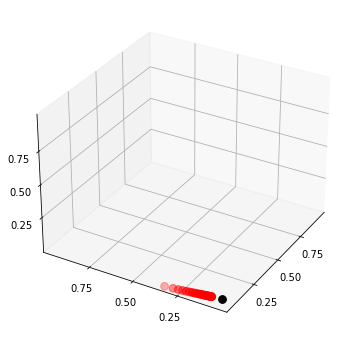

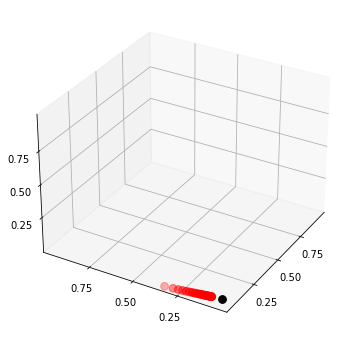

In [174]:
P = np.array(pos_array)

ψ = pos_array[1] #(0.0, 0.2, 0.8)        # Initial condition

fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

ax.set(xlim=(0, 1), ylim=(0, 1), zlim=(0, 1),
       xticks=(0.25, 0.5, 0.75),
       yticks=(0.25, 0.5, 0.75),
       zticks=(0.25, 0.5, 0.75))

x_vals, y_vals, z_vals = [], [], []
for t in range(20):
    x_vals.append(ψ[0])
    y_vals.append(ψ[1])
    z_vals.append(ψ[2])
    ψ = ψ @ P

ax.scatter(x_vals, y_vals, z_vals, c='r', s=60)
ax.view_init(30, 210)

mc = qe.MarkovChain(P)
ψ_star = mc.stationary_distributions[0]
ax.scatter(ψ_star[0], ψ_star[1], ψ_star[2], c='k', s=60)

plt.show()